# Introductory example: 1D Heat equation

We have to solve
$$\frac{\partial u (x,t)}{\partial t} = D^2 \frac{\partial^2 u (x,t)}{\partial x^2} \,, $$
Using the separation of variables
$$ u(x,t) = X(x) T(t)$$
we can recast the PDE into
$$ X \dot T = D^2 X'' T \longrightarrow \frac{\dot T}{T} = D^2 \frac{X''}{X} = - \lambda^2 \,, \qquad \forall \lambda \in \mathbb{R}$$
i.e.
$$ T(t) = T_0 \exp( - \lambda^2 (t - t_0) )\,, \qquad X(x) = X_0 \cos \left( {\frac{\lambda}{D}} \, (x-x_0) \right) $$

The full Cauchy system is thus ($t_0 = 0 = x_0$)
\begin{align}
&\frac{\partial u (x,t)}{\partial t} = D^2 \frac{\partial^2 u (x,t)}{\partial x^2} \\
&u(x, 0) = T_0 X_0 \cos \left( {\frac{\lambda}{D}} \, x \right) \\
&u\left(t, x=\pm \frac{\pi}{2} {\frac{D}{\lambda}} \right) =  0
\end{align}
Notice that we have a heat injection in $(x,t)=(0,0)$:
$$u(t=0, x=0) = T_0 X_0$$

### Tuning the parameters
Now, tuning the parameters to be numerically tratable
$$ T_0 = X_0 = 1, \quad \lambda = \frac{\pi D}{2}\,,$$
We have
\begin{align}
&\frac{\partial u (x,t)}{\partial t} = D^2 \frac{\partial^2 u (x,t)}{\partial x^2} \\
&u(t=0, x) = \cos \left( \frac{\pi}{2} \, x \right) \\
&u\left(t, x=\pm 1\right) =  0
\end{align}
whose exact solution is
$$ u(x,t) = X(x) T(t), \quad \text{where} \quad T(t) = T_0 \exp\left( -  \frac{\pi^2 D^2}{4}\, t  \right)\,, \; X(x) = X_0 \cos \left( \frac{\pi}{2} \, x \right) $$


#### The Outward flux

Notice that the heat flux at the boundary is
\begin{align}
\left. \Phi \right|_{\partial \Omega} &= \sum_i \left. \hat{n}_i \cdot \nabla u  \right|_{\partial \Omega} = \sum_{\pm} \left. \mp\partial_x u  \right|_{x = \pm 1} \\
&= \sum_{\pm} \left. \pm \frac{\pi X_0}{2} \sin \left( \frac{\pi}{2} \, x \right)\right|_{x = \pm 1} T(t)\\
&= \pi X_0 T(t)
\end{align}


------
Extra: reviews on PINN

[1] https://www.nature.com/articles/s42254-021-00314-5

[2] https://arxiv.org/pdf/2202.06416.pdf

[3] https://www.mdpi.com/2504-2289/6/4/140


In [1]:
# Find GPU in this environment
import os, subprocess, re
os.environ["CUDA_VISIBLE_DEVICES"] = ''.join(re.findall("UUID: (MIG-[^)]+)\)", str(subprocess.check_output(["nvidia-smi", "-L"]), 'ascii')))

In [2]:
from typing import Type, Union
import gc
import tqdm
import math
from collections import OrderedDict
try:
    import tqdm
except:
    %pip install tqdm
    import tqdm

import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")
import matplotlib.pyplot as plt

Device: cuda:0


## 0. Exact solution for Separable problem

In [3]:
def exact_solution_func(coords: torch.Tensor, diffusion_param: float = 0.1) -> torch.Tensor:
    """
    Method to generate the exact solution function.
    """
    pi_fact = float(torch.pi/2)
    return torch.exp(- (pi_fact**2)*(diffusion_param**2)*coords[:, 0]) * torch.cos(pi_fact * coords[:, 1])

def exact_solution_func_np(T: np.array, X: np.array, diffusion_param: float = 0.1) -> np.array:
    """
    Method to generate the exact solution function.
    """
    pi_fact = float(np.pi/2)
    return np.exp(- (pi_fact**2)*(diffusion_param**2)*T) * np.cos(pi_fact * X)

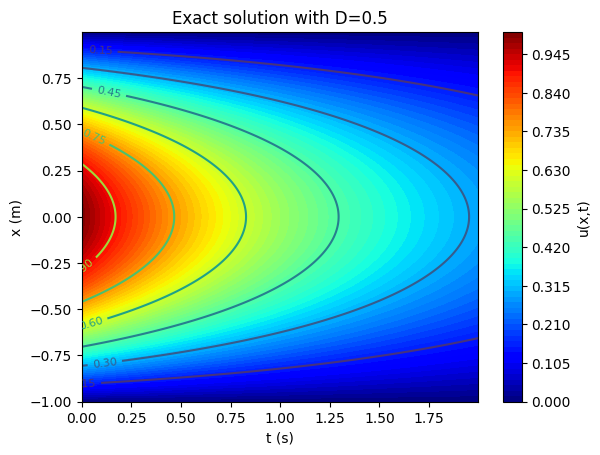

In [4]:
N_POINTS = 10000

diffusion_parameter = 0.5

t = np.arange( 0.0,  2.0, 0.001)
x = np.arange(-1.0, +1.0, 0.001)

pi_fact = float(np.pi/2)

T, X = np.meshgrid(t, x)
Z = exact_solution_func_np(T, X, diffusion_param=diffusion_parameter )
#and then comes the plot,
plt.contourf(
    T, X, Z,
    levels=75,
    origin = 'lower',
    cmap='jet',
    alpha = 1.0
)
cbar = plt.colorbar()
cbar.set_label('u(x,t)')

#optional countour lines:
contours = plt.contour(
    T, X, Z, 
    #colors='green'
    cmap='viridis'
)
plt.clabel(contours, inline=True, fontsize=8)

plt.title(f"Exact solution with D={diffusion_parameter:.1f}")
plt.xlabel('t (s)')
plt.ylabel('x (m)')

plt.show()

### 0.0. [EXTRA] From Random extraction to $R_2$ quasirandom extraction

In [5]:
class R2_extraction:
    def __init__(
        self,
        dimension: int = 2 ,
    ):
        self.d = dimension
        self.phi_dict = {}

    def r_d_extraction(self, N_points: int):
        """
        Method to perform the quasi-random R_d extraction;
        see https://extremelearning.com.au/unreasonable-effectiveness-of-quasirandom-sequences/
        """
        d = self.d
        g = self.phi(d)
        alpha = np.zeros(d)
        for j in range(d):
            alpha[j] = pow(1/g, j+1) %1
        z = np.zeros((N_points, d))
        # This number can be any real number.
        # Common default setting is typically seed=0
        # But seed = 0.5 is generally better.
        seed = 0.5 * np.random.rand(1)[0]
        for i in range(N_points):
            z[i] = (seed + alpha*(i+1))

        z = z %1
        return torch.tensor(z)

    def phi(self, d: int):
        """
        Compute the golden number in d dims;
        it then stores it into a dict for later use.
        """
        _key = f"{d}"
        if _key not in self.phi_dict:
            x=2.0000
            for i in range(10):
                x = pow(1+x,1/(d+1))

            self.phi_dict[_key] = x
        return self.phi_dict[_key]

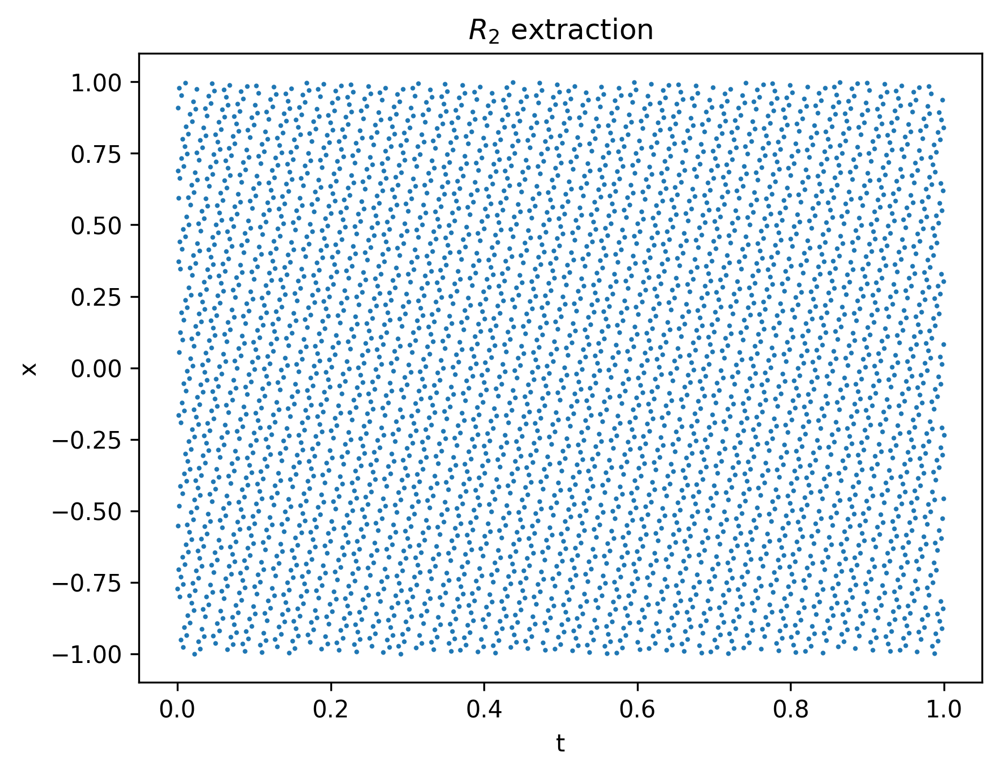

In [6]:
r2_extractor = R2_extraction(dimension=2)

plt.figure(dpi=300)
plt.title("$R_2$ extraction")

coords = r2_extractor.r_d_extraction(N_points=4096)
coords[:, 1] = 2*coords[:, 1] - 1.0
plt.scatter(coords[:, 0], coords[:, 1], s=1, label = '$R_2$')

plt.xlabel('t')
plt.ylabel('x')

plt.show()

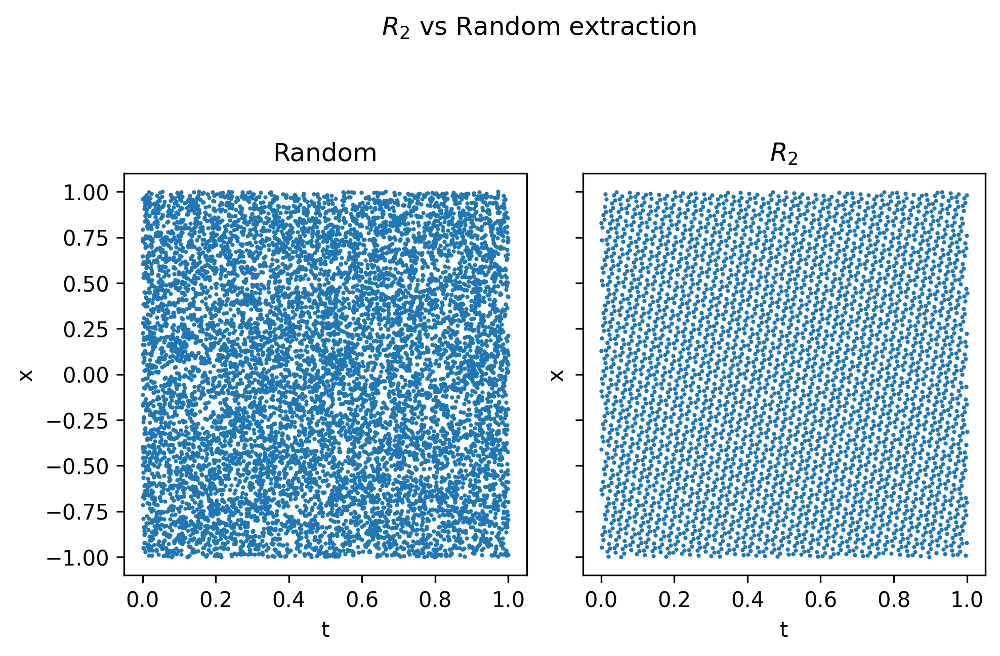

In [7]:
fig, axs = plt.subplots(nrows=1, ncols=2, dpi=300,  sharey=True)
fig.suptitle("$R_2$ vs Random extraction")
fig.tight_layout(h_pad = 2)

coords = torch.cat( (
    torch.rand(N_POINTS).unsqueeze(-1),      # t
    2*torch.rand(N_POINTS).unsqueeze(-1) - 1), # x
    dim=-1
)
axs[0].scatter(coords[:, 0], coords[:, 1], s=1, label = 'Random')
axs[0].set_title('Random')

coords = r2_extractor.r_d_extraction(N_points=4096)
coords[:, 1] = 2*coords[:, 1] - 1.0
axs[1].scatter(coords[:, 0], coords[:, 1], s=1, label = '$R_2$')
axs[1].set_title('$R_2$')

for ax in axs:
    ax.set_xlabel('t')
    ax.set_ylabel('x')
    ax.set_box_aspect(1)

plt.show()

## 1. Define a DNN as torch module

In [8]:
class PINN_DNN(nn.Module):
    """
    Basic Deep Neural Network
    """
    def __init__(
        self,
        n_inputs : int,      # number of inputs, e.g. x,y,z,t,....
        n_outputs: int,      # number of outputs, e.g. u,v,P, T, ....
        hidden_dims: list,   # number of hidden layers
        dropout: float = 0.2,# Dropout
        activation_func = nn.ReLU(), # activation function hidden layers
    ):
        super(PINN_DNN, self).__init__()
        self.n_layers = len(hidden_dims)
        self.dropout_prob = dropout
        self.activation_func = activation_func

        layers = OrderedDict()
        for i in range(self.n_layers):
            # Input layer
            if i == 0:
                layers[f"fc{i}"] = nn.Linear(n_inputs, hidden_dims[0], bias=False)
            # Hidden Layer(s)
            else:
                layers[f"fc{i}"] = nn.Linear(hidden_dims[i-1], hidden_dims[i], bias=False)
            layers[f"act_{i}"]   = self.activation_func
            layers[f"dropout_{i}"] = nn.Dropout(p=self.dropout_prob)

        # Output Layers
        layers[f"fc_{i+1}"] = nn.Linear(hidden_dims[-1], n_outputs, bias=True)

        self.network = nn.Sequential(layers)
        self.reset_parameters()

    def reset_parameters(self):
        """
        Initialisation method for the DNN layers weights (and biases)
        """
        for layer in self.network:
            if not isinstance(layer, nn.Linear):
                continue
            nn.init.normal_(layer.weight, std=1 / math.sqrt(layer.out_features) )
            if layer.bias is not None:
                fan_in, _ = nn.init._calculate_fan_in_and_fan_out(layer.weight)
                bound = 1 / math.sqrt(fan_in)
                nn.init.uniform_(layer.bias, -bound, bound)

    def forward(self, x):
        return self.network(x)

## 2. Define the PDE class with torch.autograd

In [9]:
class Heat_1D_PDE:
    """
        Class computing the 1D Heat PDE equation:
            u_t - D^2 u_xx = 0

        --------------------------
        Args:
            nu    (float): Float parameter describind the ratio between the dynamic viscosity mu and the matter density rho.

        Methods:
            compute_heat      (coords, pred_funcs): returns the computed Heat eq.
    """
    def __init__(
        self,
        D: float = 0.5,     # PDE coefficient
    ):
        self.D = D

    def compute_heat(self, coords: torch.Tensor, pred_func: torch.Tensor) -> torch.Tensor:
        """
        Compute 1D Heat equation
            u_t - D^2 u_xx
        It should equate to zero.

        Args:
            coords    (torch.Tensor): (t,x) coords.
            pred_func (torch.Tensor): (u) evaluated at (t,x)
        """
        # compute derivatives

        u_t  = self.get_derivative(pred_func, coords, 1)[:,0]

        u_x  = self.get_derivative(pred_func, coords, 1)[:,1]
        u_xx = self.get_derivative(u_x, coords, 1)[:,1]

        # return evaluated PDE
        return u_t - (self.D**2) * u_xx

    def get_derivative(self, y, x, n: int = 1):
        """
        General formula to compute the n-th order derivative of y = f(x) with respect to x
        """
        if n == 0:
            return y
        else:
            dy_dx = torch.autograd.grad(y, x, torch.ones_like(y).to(y.device), create_graph=True, retain_graph=True, allow_unused=True)[0]
        return self.get_derivative(dy_dx, x, n - 1)

### 2.0 test the PDE class

In [10]:
"""
    Test the Heat_1D_PDE class
"""
D_param = 0.5

test_pde  = Heat_1D_PDE(D=D_param)
model_try = PINN_DNN(n_inputs=2, n_outputs=1, hidden_dims=[4,8,4])

N_POINTS = 10000
coords = torch.cat( (
    torch.rand(N_POINTS).unsqueeze(-1),        # t
    2*torch.rand(N_POINTS).unsqueeze(-1) - 1), # x
    dim=-1
)
X = Variable(coords, requires_grad=True)
pred_func = model_try(X)
true_func = exact_solution_func(X, diffusion_param=D_param)
true_func_t = test_pde.get_derivative(true_func, X, 1)[:,0]
true_func_xx= test_pde.get_derivative(true_func, X, 2)[:,1]

heat_true = test_pde.compute_heat(X, true_func)
heat_pred = test_pde.compute_heat(X, pred_func)

print(f"True: {heat_true.mean()}")
print(f"Pred: {heat_pred.mean()}")

True: 2.4968747069920028e-08
Pred: 0.14794467389583588


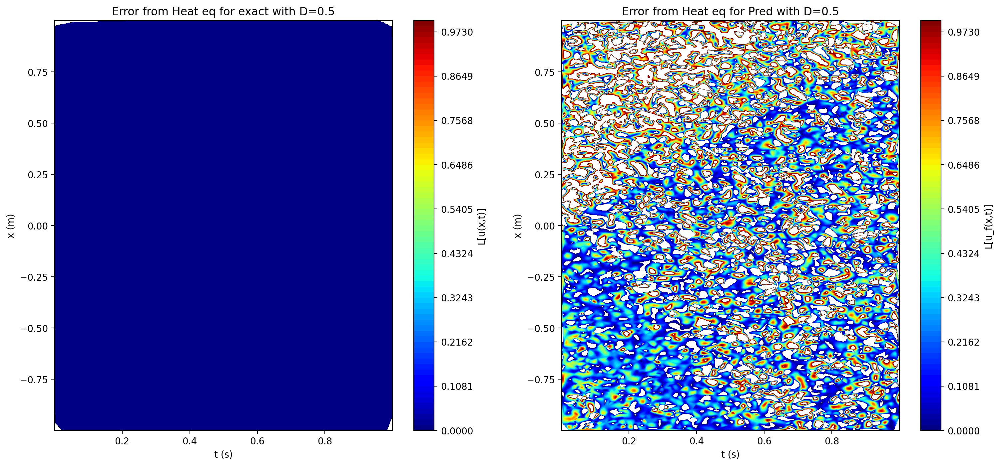

In [11]:
import scipy.interpolate

N_POINTS = 10000

t = coords[:, 0].numpy()
x = coords[:, 1].numpy()

pi_fact = float(np.pi/2)

N_plot = 1000 #number of points for plotting/interpolation

T = np.linspace(t.min(), t.max(), N_plot)
X = np.linspace(x.min(), x.max(), N_plot)
zi = heat_true #/ (true_func + 1e-8)
zi = torch.abs(zi)
zi = zi.detach().numpy()
Z = scipy.interpolate.griddata((t, x), zi, (T[None,:], X[:,None]), method='linear')

zii = torch.abs(heat_pred)
zii = zii.detach().numpy()
Z_false = scipy.interpolate.griddata((t, x), zii, (T[None,:], X[:,None]), method='cubic')

# ===== Figure ======
fig, axs = plt.subplots(nrows=1, ncols=2, dpi=200, figsize=(18,8))
#and then comes the plot, with the colour-blind-friendly viridis colourmap
levels = np.linspace(0, 1, 75)
im0 = axs[0].contourf(
    T, X, Z,
    levels=levels,
    origin = 'lower',
    cmap='jet',
    alpha = 1.0
)
cbar0 = plt.colorbar(im0, ax=axs[0])
cbar0.set_label('L[u(x,t)]')

#optional countour lines:
#contours = axs[0].contour(T, X, Z, colors='yellow');
#axs[0].clabel(contours, inline=True, fontsize=8)

axs[0].set_title(f"Error from Heat eq for exact with D={D_param}")
axs[0].set_xlabel('t (s)')
axs[0].set_ylabel('x (m)')

#levels = np.linspace(heat_pred.min().item(), heat_pred.max().item(), 75)
im1 = axs[1].contourf(
    T, X, Z_false,
    levels=levels,
    origin = 'lower',
    cmap='jet',
    alpha = 1.0
)
cbar1 = plt.colorbar(im1, ax=axs[1])
cbar1.set_label('L[u_f(x,t)]')

#optional countour lines:
#contours = axs[1].contour(T, X, Z_false, colors='yellow');
#axs[1].clabel(contours, inline=True, fontsize=8)

axs[1].set_title(f"Error from Heat eq for Pred with D={D_param}")
axs[1].set_xlabel('t (s)')
axs[1].set_ylabel('x (m)')

plt.show()

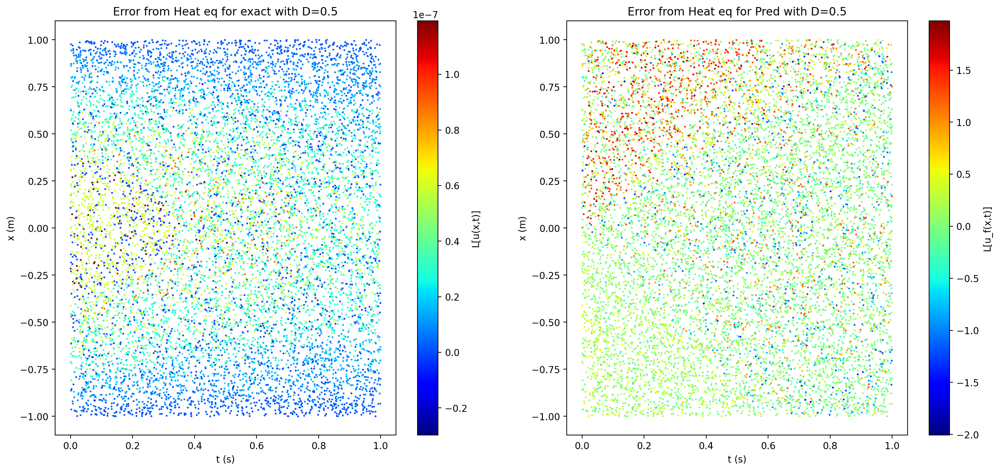

In [12]:
fig, axs = plt.subplots(nrows=1, ncols=2, dpi=200, figsize=(18,8))

im0 = axs[0].scatter(
    coords[:,0], coords[:,1],
    c=heat_true.detach(),
    cmap='jet',
    s = 1.0
)
cbar0 = plt.colorbar(im0, ax=axs[0])
cbar0.set_label('L[u(x,t)]')

axs[0].set_title(f"Error from Heat eq for exact with D={D_param}")
axs[0].set_xlabel('t (s)')
axs[0].set_ylabel('x (m)')

#levels = np.linspace(heat_pred.min().item(), heat_pred.max().item(), 75)
im1 = axs[1].scatter(
    coords[:,0], coords[:,1],
    c=heat_pred.detach(), 
    cmap='jet',
    s = 1.0
)
cbar1 = plt.colorbar(im1, ax=axs[1])
cbar1.set_label('L[u_f(x,t)]')

axs[1].set_title(f"Error from Heat eq for Pred with D={D_param}")
axs[1].set_xlabel('t (s)')
axs[1].set_ylabel('x (m)')

plt.show()

## 3. Boundary Conditions

In [13]:
class Heat_1D_BC:
    def __init__(
        self,
        cost_function = nn.MSELoss()
    ):
        # Cost function
        self.cost_function = cost_function

    def boundary_cond(self, coords: torch.Tensor, pred_func: torch.Tensor) -> torch.Tensor:
        """
        Class for computing BC
            u(t, x=±1) = 0

        Args:
             coords    (torch.Tensor) : The coords at the spatial boundary
             pred_func (torch.Tensor) : The predicted function at those points
        Returns
             bc_loss (torch.tensor)
        """
        true_b  = torch.zeros_like(pred_func)
        bc_loss = self.cost_function(pred_func, true_b)

        return torch.mean( bc_loss )

    def initial_cond(self, coords: torch.Tensor, pred_func: torch.Tensor) -> torch.Tensor:
        """
        Class for computing IC
            u(x, t=0) = cos(π x/2)

        Args:
             coords    (torch.Tensor) : The coords at the Initial Time
             pred_func (torch.Tensor) : The predicted function at those points
        Returns
             ic_loss (torch.tensor)
        """
        pi_fact = float(torch.pi/2)
        x = coords[:, 1].detach().cpu().numpy()
        true_b  = np.cos(pi_fact*x)

        ic_loss = self.cost_function(pred_func, torch.tensor(true_b, requires_grad=False).unsqueeze(-1).to(pred_func.device) )

        return torch.mean( ic_loss )

### 3.0 Test Boundary Class

True Initial Condition: 3.255459165604188e-16
Pred Initial Condition: 0.24505746364593506

True Boundary Condition: 1.0960583044064597e-15
Pred Boundary Condition: 0.18872031569480896


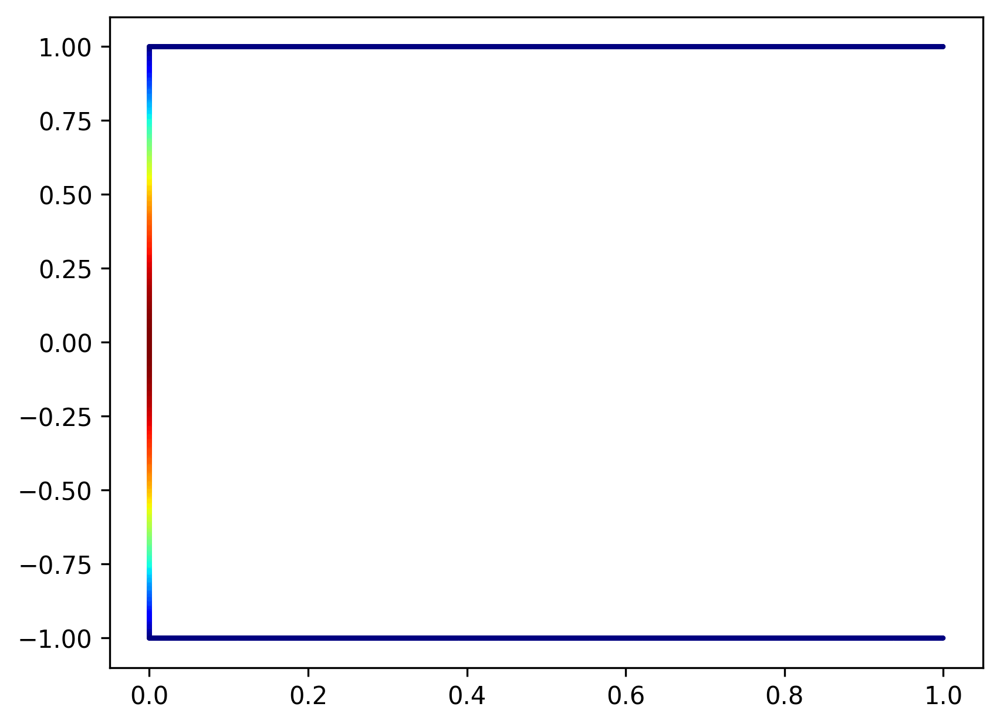

In [14]:
"""
    Test the BC_PDE class
"""
D_param = 0.5

test_bc = Heat_1D_BC( )
model_try = PINN_DNN(n_inputs=2, n_outputs=1, hidden_dims=[4,8,4])

N_POINTS = 10000
ic_coords = torch.cat( (
      torch.zeros(N_POINTS).unsqueeze(-1),      # t
      2*torch.rand(N_POINTS).unsqueeze(-1) - 1  # x
    ),
    dim=-1
)

X = Variable(ic_coords, requires_grad=True)
pred_func_ic = model_try(X)
true_func_ic = exact_solution_func(X, diffusion_param=D_param)

heat_ic_true = test_bc.initial_cond(X, true_func_ic.unsqueeze(-1))
heat_ic_pred = test_bc.initial_cond(X, pred_func_ic)

print(f"True Initial Condition: {heat_ic_true}")
print(f"Pred Initial Condition: {heat_ic_pred}\n")


bc_coords_p = torch.cat( (
      torch.rand(N_POINTS//2).unsqueeze(-1), # t
      +torch.ones(N_POINTS//2).unsqueeze(-1)  # x
    ),
    dim=-1
)
bc_coords_m = torch.cat( (
      torch.rand(N_POINTS//2).unsqueeze(-1), # t
      -torch.ones(N_POINTS//2).unsqueeze(-1)  # x
    ),
    dim=-1
)
bc_coords = torch.cat([bc_coords_p, bc_coords_m])
X = Variable(bc_coords, requires_grad=True)
pred_func_bc = model_try(X)
true_func_bc = exact_solution_func(X, diffusion_param=D_param)
heat_bc_true = test_bc.boundary_cond(X, true_func_bc)
heat_bc_pred = test_bc.boundary_cond(X, pred_func_bc)

print(f"True Boundary Condition: {heat_bc_true}")
print(f"Pred Boundary Condition: {heat_bc_pred}")

plt.figure(dpi=300)
plt.scatter( ic_coords[:, 0], ic_coords[:, 1], c=true_func_ic.detach().squeeze().cpu(), s=1, cmap='jet' )
plt.scatter( bc_coords[:, 0], bc_coords[:, 1], c=true_func_bc.detach().squeeze().cpu(), s=1, cmap='jet', vmin=0, vmax=1 )
plt.show()

## 4. Assemble PINN model

#### Soft Adapt:

Here we have a total loss which is a weighted sum of multiple terms:
$$\mathcal{L} = w_{rec} \mathcal{L}_{rec} (u, u_{t}) + w_{pde} \mathcal{L}_{pde} (u_t) + w_{bc} \mathcal{L}_{bc} (u_t)$$

The idea of SoftAdapt is to see the $w=w(i)$ as function of the epoch $i$; let us say $a = {rec, pde, bc}$. Then
$$w_a (i) = \text{softmax} \left[ \frac{L_a (i)}{L_a (i-1) +\epsilon} - \mu(i)   \right]$$
where $L_a(i)$ is the $a-$loss at epoch $i$, $\epsilon$ a small parameter to prevend division by zero, and
$$\mu(i) = \max_a \frac{L_a (i)}{L_a (i-1)}$$

#### Learning rate annealing:

$$\mathcal{L} \supseteq \mathcal{L}_{pde} (u_t) + w_{bc} \mathcal{L}_{bc} (u_t)$$

we can have a dynamical $w_{bc}$ obtained by an exponential moving average, controlled by an hyperparameter $\alpha$; in fact, we first compute

$$\bar w = \frac{\max |\nabla_\theta \mathcal{L}_{pde} (\theta) |}{ \text{mean} |\nabla_\theta \mathcal{L}_{bc} (\theta) |}$$
where $\theta$ indicates the set of DNN model parameters; then, the $w_{bc} (i)$ is given by
$$w_{bc} (i) = \alpha \bar w + (1-\alpha) w_{bc} (i-1)$$

--------------
Refs:

[1] https://towardsdatascience.com/improving-pinns-through-adaptive-loss-balancing-55662759e701 , https://github.com/rbischof/relative_balancing , https://arxiv.org/abs/2110.09813

[2] https://docs.nvidia.com/deeplearning/modulus/modulus-v2209/user_guide/theory/advanced_schemes.html#softadapt , original paper: https://arxiv.org/pdf/1912.12355.pdf

[3] https://docs.nvidia.com/deeplearning/modulus/modulus-v2209/user_guide/theory/advanced_schemes.html#learning-rate-annealing . original paper https://arxiv.org/pdf/2001.04536.pdf



In [15]:
import json

def write_line_to_file(LOG_FILE: str, log_line: str):
    with open(LOG_FILE, 'a') as f:
        f.write(log_line)

def store_hyp_dict(json_file: str, hyperparam_kwargs: dict, _indent: int = 4):
    with open(json_file, 'w') as fp:
        json.dump(hyperparam_kwargs, fp, indent=_indent)

In [16]:
# Checkpoints (to save model parameters during training)
# this is implemented by writing a python class that uses the torch.save method
class SaveBestModel:
    def __init__(
        self,
        model_name: str = 'best_model',
        best_valid_loss=float('inf')
    ): #object initialized with best_loss = +infinite
        self.best_valid_loss = best_valid_loss
        self.model_name = model_name

    def __call__(
        self, current_valid_loss,
        epoch, model, optimizer, criterion
    ):
        if current_valid_loss < self.best_valid_loss:
            self.best_valid_loss = current_valid_loss
            print(f"\nBest validation loss: {self.best_valid_loss}")
            print(f"\nSaving best model for epoch: {epoch}\n")
            # method to save a model (the state_dict: a python dictionary object that
            # maps each layer to its parameter tensor) and other useful parametrers
            # see: https://pytorch.org/tutorials/beginner/saving_loading_models.html
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'loss': criterion,
                }, f'{self.model_name}.pth')

In [17]:
import datetime
import time

class PINN(nn.Module):
    """
    Full PINN Class for the FORWARD problem.

    It incorporates:
        1. The PINN DNN (in self.DNN)
        2. The PDE      (in self._PDE)
        3. The BC       (in self._BC)

    It exposes the train_model() method to solve the PINN forward problem, by Performing a training with ADAM optimiser

    The train_model() method is thus:
        1. ADAM loop
            1.1. call training_step() for adam
            1.2. Store best model
            1.3. Perform step for learning rate stepper
            1.4. Logs
            1.5. Check if patience reached;

    Args:
        For Args see init method.

    Methods:
        init_model      ()  : init the model.
        load_best_model ()  : reload the best model.
        forward         (x) : DNN Forward passing
        pde_loss        (x, pred_funcs) : Compute PDE loss using self.cost_function
        ic_loss         (x, pred_funcs) : Compute IC  loss using BC class
        bc_loss         (x, pred_funcs) : Compute BC  loss using BC class
        soft_adapt      (losses, previous_losses, eps = 1e-8) : perform SoftAdapt algorithm.
        generate_coords ()  : generate the coords
        closure         ()  : method performing the backprop. Fundamental for L-BFGS part, it is also used for ADAM.
        training_step   (epoch, use_adam)   : Single training step.
        train_model     ()  : Main method. Trains the model.
        store_training_df   ()  : utils method to store the training history as csv
    """
    def __init__(
        self,
        use_rec: bool = True, # parameter to flag False if PINN solve PDE without reconstruction info
        # DNN
        n_inputs : int = 2,      # number of inputs, e.g. x,y,z,t,....
        n_outputs: int = 1,      # number of outputs, e.g. u,v,P, T, ....
        hidden_layers: list = [4, 8, 16, 8], # number of hidden layers
        dropout: float = 0.2,  # Dropout
        activation_func = nn.Tanh(),
        learning_rate: float = 0.001,
        # True func
        exact_solution_func = exact_solution_func,
        # Geometry
        time_interval : list = [0.0,  +1.0] ,
        space_interval: list = [-1.0, +1.0] ,
        # PDE
        diffusion_coefficient: float = 0.5,     # PDE coefficient
        # Training
        patience_training: int = 200,
        epochs: int = 1000,
        N_batches: int = 32,
        patience_lr: int = 50,
        # Soft adapt
        use_softadapt : bool = False,
        softadapt_starting_epoch : int = 5,
        # Loss weights
        weight_rec: float = 1.0,
        weight_pde: float = 1.0,
        weight_bc : float = 1.0,
        weight_ic : float = 1.0,
        # dataloaders
        fun_batch_size: int = 4096,
        pde_batch_size: int = 4096,
        bc_batch_size: int = 1024,
        ic_batch_size: int = 1024,
        # device
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu"),
        # Model name
        BASE_PATH_TO_STORE: str = '.',
        model_name: str = 'pinne_heat',
    ):
        """
        Init method.

        Args:
            use_rec     (bool, optional)    : Boolean to pick if rec_loss should be used. Defaults to True.
            n_inputs    (int, optional)     : Number of DNN inputs. Defaults to 2.
            n_outputs   (int, optional)     : Number of DNN outputs. Defaults to 1.
            hidden_layers (list, optional)  : Listof hidden layers dims. Defaults to [4, 8, 16, 8].
            learning_rate (float, optional) : Adam Learning rate. Defaults to 0.001.
            exact_solution_func     (function, optional): Method to generate the exact solution. Defaults to exact_solution_func.
            diffusion_coefficient   (float, optional)   : Heat diffusion coefficient. Defaults to 0.5.
            patience_training       (int, optional)     : Patience in ADAM training. Defaults to 200.
            epochs                  (int, optional)     : Total Number of ADAM epochs. Defaults to 1000.
            N_batches               (int, optional)     : Number of ADAM Batches. Defaults to 32.
            patience_lr             (int, optional)     : Patience for LR stepper. Defaults to 50.
            use_softadapt            (bool, optional) : Boolean to decide whether to use SoftAdapt algorithm. Defaults to True,
            softadapt_starting_epoch (int, optional)  : SoftAdapt starting epoch. Defaults to 5.
            weight_rec  (float, optional)   : Reconstruction Loss weight. Defaults to 1.0.
            weight_pde  (float, optional)   : PDE Loss weight. Defaults to 1.0.
            weight_bc   (float, optional)   : BC Loss weight. Defaults to 1.0.
            weight_ic   (float, optional)   : IC Loss weight. Defaults to 1.0.
            fun_batch_size  (int, optional) : Batch Size for computing rec loss. Defaults to 4096.
            pde_batch_size  (int, optional) : Batch Size for computing pde loss. Defaults to 4096.
            bc_batch_size   (int, optional) : Batch Size for computing bc  loss. Defaults to 1024.
            device      (_type_, optional)  : Device. Defaults to torch.device("cuda:0" if torch.cuda.is_available() else "cpu").
            BASE_PATH_TO_STORE  (str, optional) : Path to store training and model data. Defaults to '.'.
            model_name          (str, optional) : Model name. Defaults to 'pinne_heat'.
        """
        super(PINN, self).__init__()
        self.use_rec = use_rec
        # geometry
        self._t_min , self._t_max = time_interval
        self._x_min , self._x_max = space_interval
        # ==== DNN PART ==================
        self.n_inputs      = n_inputs
        self.n_outputs     = n_outputs
        self.hidden_layers = hidden_layers
        self.n_layers      = len(hidden_layers)
        self.dropout_prob  = dropout
        self.activation_func = activation_func
        self.learning_rate = learning_rate
        self.device = device
        # ==== SoftAdapt PART ==================
        self.use_softadapt = use_softadapt
        self.softadapt_starting_epoch = softadapt_starting_epoch if softadapt_starting_epoch >= 2 else 2
        # ====  PDE params PART ==================
        self.diffusion_coefficient = diffusion_coefficient
        self.exact_solution_func   = exact_solution_func

        # ==== PINN-DNN PART ==================
        # Dataloader
        self.fun_batch_size = fun_batch_size
        self.pde_batch_size = pde_batch_size
        self.ic_batch_size  = ic_batch_size
        self.bc_batch_size  = bc_batch_size
        self.N_batches   = N_batches
        # training vars
        self.patience_training = patience_training
        self.epochs = epochs
        self.patience_lr     = patience_lr
        # Loss weights
        self.weight_rec = weight_rec
        self.weight_pde = weight_pde
        self.weight_bc  = weight_bc
        self.weight_ic  = weight_ic
        # DNN
        self.model_kwargs = {
           "n_inputs"     : self.n_inputs,
            "n_outputs"   : self.n_outputs,
            "hidden_dims" : self.hidden_layers,
            "dropout"     : self.dropout_prob,
        }
        self.init_model()
        # Optimisers
        self.optimizer = torch.optim.Adam(
            self.DNN.parameters(),
            lr=self.learning_rate,
        )
        # LR scheduler
        self.lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            self.optimizer,
            mode='min',
            factor  = 0.1, # Factor by which the learning rate will be reduced. new_lr = lr * factor. Default: 0.1.
            patience= self.patience_lr, #  Number of epochs with no improvement after which learning rate will be reduced.
        )

        # cost function
        self.cost_function = nn.MSELoss() # Mean squared error

        # ==== PDE PART ==================
        # PDE+BC
        self._PDE = Heat_1D_PDE(D=self.diffusion_coefficient)
        self._BC  = Heat_1D_BC(
            cost_function = self.cost_function
        )

        # save best model
        self.BASE_PATH_TO_STORE = BASE_PATH_TO_STORE
        self.model_name = model_name
        self.full_path_to_store = f"{BASE_PATH_TO_STORE}/{model_name}"
        self.save_best_model = SaveBestModel(model_name=self.full_path_to_store) #initialize checkpoint function

        # Storing
        # === STORE HYPERPARAMETERS =====
        self.hyperparam_kwargs = {
            # Model kwargs
            **self.model_kwargs,
            "activation_func" : f"{self.activation_func}",
            # Dataset info
            'train_size': (self.pde_batch_size+self.bc_batch_size)*self.epochs,
            # Hyperparameters
            'epochs'   : self.epochs,
            'patience' : self.patience_training,
            'lr_patience': self.patience_lr
        }
        store_hyp_dict(f'{self.full_path_to_store}.json', self.hyperparam_kwargs)
        # logs
        self.LOG_FILE = f"{self.full_path_to_store}.txt"

        # === Training vars =====
        self.training_rec_loss = []
        self.training_pde_loss = []
        self.training_bc_loss  = []
        self.training_ic_loss  = []

        self.training_loss   = []
        self.learning_rates  = []

        self.weight_rec_history = []
        self.weight_pde_history = []
        self.weight_bc_history  = []
        self.weight_ic_history  = []

        self.Delta_training = 0 # Delta value for L-FBGS traingin

        self.current_epoch = 0 # store current epoch to pass to closure for soft-adapt

    def init_model(self):
        self.DNN = PINN_DNN(
            activation_func=self.activation_func,
            **self.model_kwargs,
        ).to(self.device)

    def load_best_model(self):
        try:
            # load the best model
            RELOAD_MODEL_NAME = f"{self.full_path_to_store}.pth"
            checkpoint = torch.load(RELOAD_MODEL_NAME)
            self.init_model()
            self.DNN.load_state_dict(checkpoint['model_state_dict'])
            print(f"Loaded best model: {RELOAD_MODEL_NAME} at epoch: {checkpoint['epoch']}\n")
        except Exception as e:
            print(f"Impossible to load {RELOAD_MODEL_NAME}\nError: {e}\n")
            pass

    def forward(self, x):
        """
        Forward step via DNN
        """
        pred_funcs = self.DNN(x)
        return pred_funcs

    def pde_loss(self, x, pred_funcs):
        """
        Method to compute the PDE loss;
        the PDE class gives the evaluation of the LHS of the PDE system, i.e.
            PDE[u](t,x) = 0
        Here we use the cost function to compute the loss.
        """
        heat_eq = self._PDE.compute_heat(x, pred_funcs)

        # The PDE loss is the mean of the squared (0 - PDE)^2 -- see nVidia Modulus example docs
        loss_pde  = self.cost_function(
            heat_eq,
            torch.zeros_like(heat_eq).to(heat_eq.device)
        )

        return loss_pde

    def bc_loss(self, x, preds_funcs):
        """
        Method to compute the Boundary Condition Loss.
        It is already implemented into the BC class, so we simply invoke it.
        """
        bc_loss = self._BC.boundary_cond(x, preds_funcs)
        return bc_loss

    def ic_loss(self, x, preds_funcs):
        """
        Method to compute the Initial Condition Loss.
        It is already implemented into the BC class, so we simply invoke it.
        """
        ic_loss = self._BC.initial_cond(x, preds_funcs)
        return ic_loss

    def soft_adapt(self, losses: list, previous_losses: list, eps: float = 1e-8) -> list:
        """
        Performs the softadapt computation:

        Args:
            losses          (list) : list of losses to compute softadapt on
            previous_losses (list) : list of losses at previous step
            eps (float) : Factor to avoid division by zero. Defaults to 1e-8

        Returns
            (list) list of W params
        """
        Li = np.array(losses)
        Lo = np.array(previous_losses)

        _ratio = (Li)/(Lo + eps)
        _mu = np.max(_ratio)

        _ratio = torch.tensor(_ratio, requires_grad=False)

        _w = nn.functional.softmax(_ratio - _mu)

        return _w.tolist()

    def generate_coords(self):
        """
        Method to generate the coords.
        Notice that we have implemented here a RANDOM EXTRACTOR.

        Returns
            coords    (torch.Tensor) : bulk coordinates
            ic_coords (torch.Tensor) : IC coordinates
            bc_coords (torch.Tensor) : BC coordinates
        """
        coords = torch.cat(
            (
                self._t_min + (self._t_max - self._t_min)*torch.rand(self.pde_batch_size).unsqueeze(-1), # t
                self._x_min + (self._x_max - self._x_min)*torch.rand(self.pde_batch_size).unsqueeze(-1)  # x
            ),
            dim=-1
        )
        coords = Variable(coords.float(), requires_grad=True)
        # initial cond
        ic_coords = torch.cat(
            (
                self._t_min * torch.ones(self.ic_batch_size).unsqueeze(-1), # t
                self._x_min + (self._x_max - self._x_min)*torch.rand(self.ic_batch_size).unsqueeze(-1)  # x
            ),
            dim=-1
        )
        # bc
        bc_coords_p = torch.cat(
            (
                self._t_min + (self._t_max - self._t_min)*torch.rand(self.bc_batch_size//2).unsqueeze(-1), # t
                self._x_max*torch.ones(self.bc_batch_size//2).unsqueeze(-1)  # x
            ),
            dim=-1
        )
        bc_coords_m = torch.cat(
            (
                self._t_min + (self._t_max - self._t_min)*torch.rand(self.bc_batch_size//2).unsqueeze(-1), # t
                self._x_min*torch.ones(self.bc_batch_size//2).unsqueeze(-1)  # x
            ),
            dim=-1
        )
        bc_coords = torch.cat([bc_coords_m, bc_coords_p])

        ic_coords = Variable(ic_coords.float(), requires_grad=True)
        bc_coords = Variable(bc_coords.float(), requires_grad=True)
        # to device
        coords     = coords.to(self.device)
        ic_coords  = ic_coords.to(self.device)
        bc_coords  = bc_coords.to(self.device)

        return coords, ic_coords, bc_coords

    def closure(self):
        """
        Example of closure func:

        if torch.is_grad_enabled():
            self.lbfgs_optimizer.zero_grad()
        output = self(X_)
        loss = self.lossFct(output, y_)
        if loss.requires_grad:
            loss.backward()
        return loss
        """
        self.optimizer.zero_grad()
        # =================== random extraction =====================
        # func + pde
        coords, ic_coords, bc_coords = self.generate_coords()
        # =================== forward =====================
        true_funcs = self.exact_solution_func(coords)# true
        pred_funcs = self.forward(coords)            # DNN pred
        pred_ic    = self.forward(ic_coords)         # DNN pred - ic
        pred_bc    = self.forward(bc_coords)         # DNN pred - bc
        # =================== Losses =====================
        pde_loss = self.pde_loss(coords, pred_funcs)                                                                        # PDE loss
        ic_loss  = self.ic_loss(ic_coords, pred_ic)                                                                         # BC loss
        bc_loss  = self.bc_loss(bc_coords, pred_bc)                                                                         # BC loss
        rec_loss = self.cost_function(pred_funcs, true_funcs.unsqueeze(-1)) if self.use_rec else torch.zeros_like(pde_loss) # rec loss
        # =================== soft-adapt =================
        if self.use_softadapt and self.current_epoch >= self.softadapt_starting_epoch:
            if self.use_rec:
                _losses   =  [rec_loss.item(), pde_loss.item(), ic_loss.item(), bc_loss.item() ]
                _p_losses =  [self.training_rec_loss[-1], self.training_pde_loss[-1], self.training_ic_loss[-1], self.training_bc_loss[-1] ]
                self.weight_rec, self.weight_pde, self.weight_ic, self.weight_bc = self.soft_adapt(
                    losses          = _losses ,
                    previous_losses = _p_losses
                )
            else:
                _losses   = [pde_loss.item(), ic_loss.item(), bc_loss.item() ]
                _p_losses = [self.training_pde_loss[-1],  self.training_ic_loss[-1], self.training_bc_loss[-1] ]
                self.weight_pde, self.weight_ic, self.weight_bc = self.soft_adapt(
                    losses          = _losses ,
                    previous_losses = _p_losses
                )

        # full loss
        loss = self.weight_pde * pde_loss + self.weight_ic * ic_loss  + self.weight_bc * bc_loss  # <=== Full loss here ====
        if self.use_rec:
            loss += self.weight_rec * rec_loss
        # Normalise loss
        loss = loss/( self.weight_rec + self.weight_pde + self.weight_ic + self.weight_bc ) if  self.use_rec else  loss/( self.weight_pde + self.weight_ic + self.weight_bc )

        # Append
        self.train_loss += loss.item()
        self.train_rec_loss += rec_loss.item()
        self.train_pde_loss += pde_loss.item()
        self.train_ic_loss  += ic_loss.item()
        self.train_bc_loss  += bc_loss.item()
        #==== backward ======================
        loss.backward(retain_graph=True)

        return loss

    def training_step(self, epoch: int, use_adam: bool = True):
        """
        Single Epoch training step
        """
        # =====================================================
        # Training
        self.DNN.train()
        self.train_loss = 0
        self.train_rec_loss = 0
        self.train_pde_loss = 0
        self.train_ic_loss  = 0
        self.train_bc_loss  = 0
        # =================== Batches iterations - only ADAM =====================
        for _ in tqdm.tqdm(range(self.N_batches)):
            # =================== closure ====================
            self.optimizer.step(self.closure)
        # =================== compute LOSS ====================
        # set divisor for batches
        _divisor = self.N_batches
        # training loss
        tr_loss = self.train_loss/_divisor
        # others
        tr_rec_loss = self.train_rec_loss/_divisor
        tr_pde_loss = self.train_pde_loss/_divisor
        tr_ic_loss  = self.train_ic_loss /_divisor
        tr_bc_loss  = self.train_bc_loss /_divisor
        # === Append Losses ========
        self.training_loss.append(tr_loss) ## Full trainloss
        # others
        self.training_rec_loss.append(tr_rec_loss)
        self.training_pde_loss.append(tr_pde_loss)
        self.training_ic_loss.append(tr_ic_loss)
        self.training_bc_loss.append(tr_bc_loss)
        # append weights
        self.weight_rec_history.append(self.weight_rec)
        self.weight_pde_history.append(self.weight_pde)
        self.weight_ic_history.append(self.weight_ic)
        self.weight_bc_history.append(self.weight_bc)

        return tr_loss

    def train_model(self):
        t0 = time.time()

        self.training_rec_loss = []
        self.training_pde_loss = []
        self.training_ic_loss  = []
        self.training_bc_loss  = []

        self.training_loss   = []
        self.learning_rates  = []
        #==== ADAM TRAINING LOOP ================================================================================
        for epoch in range(0, self.epochs):
            self.current_epoch = epoch
            loss = self.training_step(epoch)

            #=== GO ON ====
            #save best model
            self.save_best_model(loss, epoch, self.DNN, self.optimizer, self.cost_function)

            # Learning Rate stepper
            current_lr = self.optimizer.param_groups[0]['lr']
            self.learning_rates.append(current_lr)
            # update learning rate schedule
            self.lr_scheduler.step(loss) ### NB: ONLY FOR ReduceLROnPlateau

            # =================== log ========================
            log_line = f'====> Epoch: {epoch}\tTraining loss: {loss:.6f}\tlr: {current_lr:.2e}\tTime: {datetime.datetime.now().strftime("%Y-%m-%d_%H:%M:%S")}\n'
            print(log_line)
            write_line_to_file(LOG_FILE=self.LOG_FILE, log_line=log_line)

            # update number of epochs passed
            self.Delta_training += 1
            # Check patience
            if self.patience_training > 0 and len(self.training_loss) - np.array(self.training_loss).argmin() > self.patience_training:
                break_log = f"\nPatience treshold = {self.patience_training} reached.\nExiting at epoch {epoch}.\n"
                print(break_log)
                write_line_to_file(LOG_FILE=self.LOG_FILE, log_line=break_log)
                break

        # Close up
        log_line = f'\n\nTotal ADAM training time: {time.time() - t0}\tEnd time: {datetime.datetime.now().strftime("%Y-%m-%d_%H:%M:%S")}\n\n'
        print(log_line)
        write_line_to_file(LOG_FILE=self.LOG_FILE, log_line=log_line)

        # store history df
        self.store_training_df()

    def store_training_df(self):
        # store as pandas csv
        df_train = pd.DataFrame(
            {
                "epochs"          : [ epoch for epoch in range(len(self.training_loss)) ],
                "training_loss"   : self.training_loss,
                'lr'              : self.learning_rates,
                "rec_train_losses": self.training_rec_loss,
                "pde_train_losses": self.training_pde_loss,
                "ic_train_losses" : self.training_ic_loss,
                "bc_train_losses" : self.training_bc_loss,
                "weight_rec"      : self.weight_rec_history,
                "weight_pde"      : self.weight_pde_history,
                "weight_ic"       : self.weight_ic_history,
                "weight_bc"       : self.weight_bc_history,
            }
        )
        df_train.to_csv(f'{self.BASE_PATH_TO_STORE}/{self.model_name}_history.csv')

### 4.0 Try model implementation

In [18]:
try:
    from torchsummary import summary
except:
    %pip install torchsummary
    from torchsummary import summary

D_param = 0.5

pinn_model = PINN(
    time_interval = [0.0,  +1.0] ,
    space_interval= [-1.0, +1.0] ,
    diffusion_coefficient = D_param,
    hidden_layers = [
        #128, 128, 128
        #512, 512, 512
        64, 64, 64, 64, 64
    ],
    activation_func=nn.GELU(), #nn.Tanh(), 
    exact_solution_func=lambda x: exact_solution_func(x, diffusion_param=D_param) ,
    learning_rate = 0.001,
    BASE_PATH_TO_STORE='./model_data',
    model_name = 'pinne_heat_prova',
    use_rec = False,
    #use_softadapt = False,
    weight_rec = 1.0,
    weight_pde = 1.0,
    weight_bc  = 1.0,
    weight_ic  = 1.0,
    #weight_pde = 0.5,
    #weight_bc  = 1.5,
    #weight_ic  = 4.5,
    pde_batch_size = 4096,
    bc_batch_size  = 4096,
    ic_batch_size  = 4096,
    # Training
    patience_training = 200,
    epochs      = 1000,
    N_batches   = 32,
    patience_lr = 50,
)

print(pinn_model.DNN)

print(f"\n\nTorchSummary:\n")
summary(pinn_model.DNN, input_size=( 2, ), batch_size=4096, device=pinn_model.device.type)

PINN_DNN(
  (activation_func): GELU(approximate='none')
  (network): Sequential(
    (fc0): Linear(in_features=2, out_features=64, bias=False)
    (act_0): GELU(approximate='none')
    (dropout_0): Dropout(p=0.2, inplace=False)
    (fc1): Linear(in_features=64, out_features=64, bias=False)
    (act_1): GELU(approximate='none')
    (dropout_1): Dropout(p=0.2, inplace=False)
    (fc2): Linear(in_features=64, out_features=64, bias=False)
    (act_2): GELU(approximate='none')
    (dropout_2): Dropout(p=0.2, inplace=False)
    (fc3): Linear(in_features=64, out_features=64, bias=False)
    (act_3): GELU(approximate='none')
    (dropout_3): Dropout(p=0.2, inplace=False)
    (fc4): Linear(in_features=64, out_features=64, bias=False)
    (act_4): GELU(approximate='none')
    (dropout_4): Dropout(p=0.2, inplace=False)
    (fc_5): Linear(in_features=64, out_features=1, bias=True)
  )
)


TorchSummary:

----------------------------------------------------------------
        Layer (type)          

## 5. Train model

In [19]:
pinn_model.train_model()

100%|██████████| 32/32 [00:00<00:00, 57.79it/s]



Best validation loss: 0.195867866743356

Saving best model for epoch: 0

====> Epoch: 0	Training loss: 0.195868	lr: 1.00e-03	Time: 2023-11-13_10:58:50



100%|██████████| 32/32 [00:00<00:00, 67.99it/s]



Best validation loss: 0.17953548021614552

Saving best model for epoch: 1

====> Epoch: 1	Training loss: 0.179535	lr: 1.00e-03	Time: 2023-11-13_10:58:50



100%|██████████| 32/32 [00:00<00:00, 66.60it/s]



Best validation loss: 0.16843481454998255

Saving best model for epoch: 2

====> Epoch: 2	Training loss: 0.168435	lr: 1.00e-03	Time: 2023-11-13_10:58:51



100%|██████████| 32/32 [00:00<00:00, 87.94it/s]



Best validation loss: 0.15756950248032808

Saving best model for epoch: 3

====> Epoch: 3	Training loss: 0.157570	lr: 1.00e-03	Time: 2023-11-13_10:58:51



100%|██████████| 32/32 [00:00<00:00, 88.51it/s]



Best validation loss: 0.14754193183034658

Saving best model for epoch: 4

====> Epoch: 4	Training loss: 0.147542	lr: 1.00e-03	Time: 2023-11-13_10:58:51



100%|██████████| 32/32 [00:00<00:00, 87.81it/s]



Best validation loss: 0.13862844184041023

Saving best model for epoch: 5

====> Epoch: 5	Training loss: 0.138628	lr: 1.00e-03	Time: 2023-11-13_10:58:52



100%|██████████| 32/32 [00:00<00:00, 62.08it/s]



Best validation loss: 0.12963180104270577

Saving best model for epoch: 6

====> Epoch: 6	Training loss: 0.129632	lr: 1.00e-03	Time: 2023-11-13_10:58:52



100%|██████████| 32/32 [00:00<00:00, 75.08it/s]



Best validation loss: 0.12218168494291604

Saving best model for epoch: 7

====> Epoch: 7	Training loss: 0.122182	lr: 1.00e-03	Time: 2023-11-13_10:58:53



100%|██████████| 32/32 [00:00<00:00, 74.84it/s]



Best validation loss: 0.11540764360688627

Saving best model for epoch: 8

====> Epoch: 8	Training loss: 0.115408	lr: 1.00e-03	Time: 2023-11-13_10:58:53



100%|██████████| 32/32 [00:00<00:00, 74.84it/s]



Best validation loss: 0.10843349108472466

Saving best model for epoch: 9

====> Epoch: 9	Training loss: 0.108433	lr: 1.00e-03	Time: 2023-11-13_10:58:54



100%|██████████| 32/32 [00:00<00:00, 63.87it/s]



Best validation loss: 0.10149516351521015

Saving best model for epoch: 10

====> Epoch: 10	Training loss: 0.101495	lr: 1.00e-03	Time: 2023-11-13_10:58:54



100%|██████████| 32/32 [00:00<00:00, 69.49it/s]



Best validation loss: 0.09528934885747731

Saving best model for epoch: 11

====> Epoch: 11	Training loss: 0.095289	lr: 1.00e-03	Time: 2023-11-13_10:58:55



100%|██████████| 32/32 [00:00<00:00, 74.73it/s]



Best validation loss: 0.08944503660313785

Saving best model for epoch: 12

====> Epoch: 12	Training loss: 0.089445	lr: 1.00e-03	Time: 2023-11-13_10:58:55



100%|██████████| 32/32 [00:00<00:00, 48.13it/s]



Best validation loss: 0.08373861364088953

Saving best model for epoch: 13

====> Epoch: 13	Training loss: 0.083739	lr: 1.00e-03	Time: 2023-11-13_10:58:56



100%|██████████| 32/32 [00:00<00:00, 47.89it/s]



Best validation loss: 0.07803160883486271

Saving best model for epoch: 14

====> Epoch: 14	Training loss: 0.078032	lr: 1.00e-03	Time: 2023-11-13_10:58:56



100%|██████████| 32/32 [00:00<00:00, 49.13it/s]



Best validation loss: 0.0725537077523768

Saving best model for epoch: 15

====> Epoch: 15	Training loss: 0.072554	lr: 1.00e-03	Time: 2023-11-13_10:58:57



100%|██████████| 32/32 [00:00<00:00, 47.00it/s]



Best validation loss: 0.06599759426899254

Saving best model for epoch: 16

====> Epoch: 16	Training loss: 0.065998	lr: 1.00e-03	Time: 2023-11-13_10:58:58



100%|██████████| 32/32 [00:00<00:00, 46.91it/s]



Best validation loss: 0.05779969599097967

Saving best model for epoch: 17

====> Epoch: 17	Training loss: 0.057800	lr: 1.00e-03	Time: 2023-11-13_10:58:58



100%|██████████| 32/32 [00:00<00:00, 43.16it/s]



Best validation loss: 0.050641431706026196

Saving best model for epoch: 18

====> Epoch: 18	Training loss: 0.050641	lr: 1.00e-03	Time: 2023-11-13_10:58:59



100%|██████████| 32/32 [00:00<00:00, 55.29it/s]



Best validation loss: 0.045521362335421145

Saving best model for epoch: 19

====> Epoch: 19	Training loss: 0.045521	lr: 1.00e-03	Time: 2023-11-13_10:59:00



100%|██████████| 32/32 [00:00<00:00, 69.79it/s]



Best validation loss: 0.04165329702664167

Saving best model for epoch: 20

====> Epoch: 20	Training loss: 0.041653	lr: 1.00e-03	Time: 2023-11-13_10:59:00



100%|██████████| 32/32 [00:00<00:00, 50.62it/s]



Best validation loss: 0.03915146796498448

Saving best model for epoch: 21

====> Epoch: 21	Training loss: 0.039151	lr: 1.00e-03	Time: 2023-11-13_10:59:01



100%|██████████| 32/32 [00:00<00:00, 50.07it/s]



Best validation loss: 0.036822704947553575

Saving best model for epoch: 22

====> Epoch: 22	Training loss: 0.036823	lr: 1.00e-03	Time: 2023-11-13_10:59:02



100%|██████████| 32/32 [00:00<00:00, 67.35it/s]



Best validation loss: 0.035246241139248013

Saving best model for epoch: 23

====> Epoch: 23	Training loss: 0.035246	lr: 1.00e-03	Time: 2023-11-13_10:59:02



100%|██████████| 32/32 [00:00<00:00, 93.18it/s]



Best validation loss: 0.03363781451480463

Saving best model for epoch: 24

====> Epoch: 24	Training loss: 0.033638	lr: 1.00e-03	Time: 2023-11-13_10:59:02



100%|██████████| 32/32 [00:00<00:00, 94.00it/s]



Best validation loss: 0.03223981085466221

Saving best model for epoch: 25

====> Epoch: 25	Training loss: 0.032240	lr: 1.00e-03	Time: 2023-11-13_10:59:03



100%|██████████| 32/32 [00:00<00:00, 94.47it/s]



Best validation loss: 0.030948258470743895

Saving best model for epoch: 26

====> Epoch: 26	Training loss: 0.030948	lr: 1.00e-03	Time: 2023-11-13_10:59:03



100%|██████████| 32/32 [00:00<00:00, 78.45it/s]



Best validation loss: 0.029588556906674057

Saving best model for epoch: 27

====> Epoch: 27	Training loss: 0.029589	lr: 1.00e-03	Time: 2023-11-13_10:59:04



100%|██████████| 32/32 [00:00<00:00, 82.69it/s]



Best validation loss: 0.028315255709458143

Saving best model for epoch: 28

====> Epoch: 28	Training loss: 0.028315	lr: 1.00e-03	Time: 2023-11-13_10:59:04



100%|██████████| 32/32 [00:00<00:00, 67.52it/s]



Best validation loss: 0.02719179989071563

Saving best model for epoch: 29

====> Epoch: 29	Training loss: 0.027192	lr: 1.00e-03	Time: 2023-11-13_10:59:04



100%|██████████| 32/32 [00:00<00:00, 87.24it/s]



Best validation loss: 0.026355050213169307

Saving best model for epoch: 30

====> Epoch: 30	Training loss: 0.026355	lr: 1.00e-03	Time: 2023-11-13_10:59:05



100%|██████████| 32/32 [00:00<00:00, 81.70it/s]



Best validation loss: 0.025389564514625818

Saving best model for epoch: 31

====> Epoch: 31	Training loss: 0.025390	lr: 1.00e-03	Time: 2023-11-13_10:59:05



100%|██████████| 32/32 [00:00<00:00, 88.86it/s]



Best validation loss: 0.024392674735281616

Saving best model for epoch: 32

====> Epoch: 32	Training loss: 0.024393	lr: 1.00e-03	Time: 2023-11-13_10:59:06



100%|██████████| 32/32 [00:00<00:00, 82.40it/s]



Best validation loss: 0.023724301834590733

Saving best model for epoch: 33

====> Epoch: 33	Training loss: 0.023724	lr: 1.00e-03	Time: 2023-11-13_10:59:06



100%|██████████| 32/32 [00:00<00:00, 92.10it/s]



Best validation loss: 0.023051151947584003

Saving best model for epoch: 34

====> Epoch: 34	Training loss: 0.023051	lr: 1.00e-03	Time: 2023-11-13_10:59:06



100%|██████████| 32/32 [00:00<00:00, 56.88it/s]



Best validation loss: 0.02230616961605847

Saving best model for epoch: 35

====> Epoch: 35	Training loss: 0.022306	lr: 1.00e-03	Time: 2023-11-13_10:59:07



100%|██████████| 32/32 [00:00<00:00, 52.66it/s]



Best validation loss: 0.021447863371577114

Saving best model for epoch: 36

====> Epoch: 36	Training loss: 0.021448	lr: 1.00e-03	Time: 2023-11-13_10:59:07



100%|██████████| 32/32 [00:00<00:00, 51.31it/s]



Best validation loss: 0.020979758468456566

Saving best model for epoch: 37

====> Epoch: 37	Training loss: 0.020980	lr: 1.00e-03	Time: 2023-11-13_10:59:08



100%|██████████| 32/32 [00:00<00:00, 54.81it/s]



Best validation loss: 0.020304958103224635

Saving best model for epoch: 38

====> Epoch: 38	Training loss: 0.020305	lr: 1.00e-03	Time: 2023-11-13_10:59:09



100%|██████████| 32/32 [00:00<00:00, 73.44it/s]



Best validation loss: 0.019689849112182856

Saving best model for epoch: 39

====> Epoch: 39	Training loss: 0.019690	lr: 1.00e-03	Time: 2023-11-13_10:59:09



100%|██████████| 32/32 [00:00<00:00, 72.94it/s]



Best validation loss: 0.019144346355460584

Saving best model for epoch: 40

====> Epoch: 40	Training loss: 0.019144	lr: 1.00e-03	Time: 2023-11-13_10:59:10



100%|██████████| 32/32 [00:00<00:00, 73.74it/s]



Best validation loss: 0.01867504377150908

Saving best model for epoch: 41

====> Epoch: 41	Training loss: 0.018675	lr: 1.00e-03	Time: 2023-11-13_10:59:10



100%|██████████| 32/32 [00:00<00:00, 69.96it/s]



Best validation loss: 0.01807131915120408

Saving best model for epoch: 42

====> Epoch: 42	Training loss: 0.018071	lr: 1.00e-03	Time: 2023-11-13_10:59:11



100%|██████████| 32/32 [00:00<00:00, 73.18it/s]



Best validation loss: 0.017494258063379675

Saving best model for epoch: 43

====> Epoch: 43	Training loss: 0.017494	lr: 1.00e-03	Time: 2023-11-13_10:59:11



100%|██████████| 32/32 [00:00<00:00, 59.91it/s]



Best validation loss: 0.017101561359595507

Saving best model for epoch: 44

====> Epoch: 44	Training loss: 0.017102	lr: 1.00e-03	Time: 2023-11-13_10:59:12



100%|██████████| 32/32 [00:00<00:00, 58.10it/s]



Best validation loss: 0.016534115828108042

Saving best model for epoch: 45

====> Epoch: 45	Training loss: 0.016534	lr: 1.00e-03	Time: 2023-11-13_10:59:12



100%|██████████| 32/32 [00:00<00:00, 82.35it/s]



Best validation loss: 0.016244347527390346

Saving best model for epoch: 46

====> Epoch: 46	Training loss: 0.016244	lr: 1.00e-03	Time: 2023-11-13_10:59:12



100%|██████████| 32/32 [00:00<00:00, 94.95it/s]



Best validation loss: 0.01586121611762792

Saving best model for epoch: 47

====> Epoch: 47	Training loss: 0.015861	lr: 1.00e-03	Time: 2023-11-13_10:59:13



100%|██████████| 32/32 [00:00<00:00, 95.71it/s]



Best validation loss: 0.01544683609972708

Saving best model for epoch: 48

====> Epoch: 48	Training loss: 0.015447	lr: 1.00e-03	Time: 2023-11-13_10:59:13



100%|██████████| 32/32 [00:00<00:00, 95.04it/s]



Best validation loss: 0.015068443462951109

Saving best model for epoch: 49

====> Epoch: 49	Training loss: 0.015068	lr: 1.00e-03	Time: 2023-11-13_10:59:14



100%|██████████| 32/32 [00:00<00:00, 96.29it/s]



Best validation loss: 0.01476128344074823

Saving best model for epoch: 50

====> Epoch: 50	Training loss: 0.014761	lr: 1.00e-03	Time: 2023-11-13_10:59:14



100%|██████████| 32/32 [00:00<00:00, 66.16it/s]



Best validation loss: 0.014272743079345673

Saving best model for epoch: 51

====> Epoch: 51	Training loss: 0.014273	lr: 1.00e-03	Time: 2023-11-13_10:59:14



100%|██████████| 32/32 [00:00<00:00, 73.35it/s]



Best validation loss: 0.014052585262106732

Saving best model for epoch: 52

====> Epoch: 52	Training loss: 0.014053	lr: 1.00e-03	Time: 2023-11-13_10:59:15



100%|██████████| 32/32 [00:00<00:00, 71.74it/s]



Best validation loss: 0.013606742140837014

Saving best model for epoch: 53

====> Epoch: 53	Training loss: 0.013607	lr: 1.00e-03	Time: 2023-11-13_10:59:15



100%|██████████| 32/32 [00:00<00:00, 69.32it/s]



Best validation loss: 0.01335776096675545

Saving best model for epoch: 54

====> Epoch: 54	Training loss: 0.013358	lr: 1.00e-03	Time: 2023-11-13_10:59:16



100%|██████████| 32/32 [00:00<00:00, 72.46it/s]



Best validation loss: 0.01311851548962295

Saving best model for epoch: 55

====> Epoch: 55	Training loss: 0.013119	lr: 1.00e-03	Time: 2023-11-13_10:59:16



100%|██████████| 32/32 [00:00<00:00, 68.15it/s]



Best validation loss: 0.01281547630787827

Saving best model for epoch: 56

====> Epoch: 56	Training loss: 0.012815	lr: 1.00e-03	Time: 2023-11-13_10:59:17



100%|██████████| 32/32 [00:00<00:00, 62.50it/s]



Best validation loss: 0.012532320397440344

Saving best model for epoch: 57

====> Epoch: 57	Training loss: 0.012532	lr: 1.00e-03	Time: 2023-11-13_10:59:17



100%|██████████| 32/32 [00:00<00:00, 67.09it/s]



Best validation loss: 0.012236875161761418

Saving best model for epoch: 58

====> Epoch: 58	Training loss: 0.012237	lr: 1.00e-03	Time: 2023-11-13_10:59:18



100%|██████████| 32/32 [00:00<00:00, 67.70it/s]



Best validation loss: 0.011972032923949882

Saving best model for epoch: 59

====> Epoch: 59	Training loss: 0.011972	lr: 1.00e-03	Time: 2023-11-13_10:59:18



100%|██████████| 32/32 [00:00<00:00, 71.24it/s]



Best validation loss: 0.011752919643186033

Saving best model for epoch: 60

====> Epoch: 60	Training loss: 0.011753	lr: 1.00e-03	Time: 2023-11-13_10:59:19



100%|██████████| 32/32 [00:00<00:00, 73.47it/s]



Best validation loss: 0.011468792072264478

Saving best model for epoch: 61

====> Epoch: 61	Training loss: 0.011469	lr: 1.00e-03	Time: 2023-11-13_10:59:19



100%|██████████| 32/32 [00:00<00:00, 73.96it/s]



Best validation loss: 0.011222153814742342

Saving best model for epoch: 62

====> Epoch: 62	Training loss: 0.011222	lr: 1.00e-03	Time: 2023-11-13_10:59:19



100%|██████████| 32/32 [00:00<00:00, 74.03it/s]



Best validation loss: 0.011099927738541737

Saving best model for epoch: 63

====> Epoch: 63	Training loss: 0.011100	lr: 1.00e-03	Time: 2023-11-13_10:59:20



100%|██████████| 32/32 [00:00<00:00, 74.05it/s]



Best validation loss: 0.010906772455200553

Saving best model for epoch: 64

====> Epoch: 64	Training loss: 0.010907	lr: 1.00e-03	Time: 2023-11-13_10:59:20



100%|██████████| 32/32 [00:00<00:00, 68.86it/s]



Best validation loss: 0.010647238319506869

Saving best model for epoch: 65

====> Epoch: 65	Training loss: 0.010647	lr: 1.00e-03	Time: 2023-11-13_10:59:21



100%|██████████| 32/32 [00:00<00:00, 74.16it/s]



Best validation loss: 0.010489727748790756

Saving best model for epoch: 66

====> Epoch: 66	Training loss: 0.010490	lr: 1.00e-03	Time: 2023-11-13_10:59:21



100%|██████████| 32/32 [00:00<00:00, 73.56it/s]



Best validation loss: 0.010249652608763427

Saving best model for epoch: 67

====> Epoch: 67	Training loss: 0.010250	lr: 1.00e-03	Time: 2023-11-13_10:59:22



100%|██████████| 32/32 [00:00<00:00, 75.02it/s]



Best validation loss: 0.010075404832605273

Saving best model for epoch: 68

====> Epoch: 68	Training loss: 0.010075	lr: 1.00e-03	Time: 2023-11-13_10:59:22



100%|██████████| 32/32 [00:00<00:00, 73.32it/s]



Best validation loss: 0.00989015563391149

Saving best model for epoch: 69

====> Epoch: 69	Training loss: 0.009890	lr: 1.00e-03	Time: 2023-11-13_10:59:23



100%|██████████| 32/32 [00:00<00:00, 74.79it/s]



Best validation loss: 0.009772753372089937

Saving best model for epoch: 70

====> Epoch: 70	Training loss: 0.009773	lr: 1.00e-03	Time: 2023-11-13_10:59:23



100%|██████████| 32/32 [00:00<00:00, 86.20it/s]



Best validation loss: 0.00960911565925926

Saving best model for epoch: 71

====> Epoch: 71	Training loss: 0.009609	lr: 1.00e-03	Time: 2023-11-13_10:59:23



100%|██████████| 32/32 [00:00<00:00, 87.00it/s]



Best validation loss: 0.009455933643039316

Saving best model for epoch: 72

====> Epoch: 72	Training loss: 0.009456	lr: 1.00e-03	Time: 2023-11-13_10:59:24



100%|██████████| 32/32 [00:00<00:00, 86.71it/s]



Best validation loss: 0.009340780641650781

Saving best model for epoch: 73

====> Epoch: 73	Training loss: 0.009341	lr: 1.00e-03	Time: 2023-11-13_10:59:24



100%|██████████| 32/32 [00:00<00:00, 86.01it/s]



Best validation loss: 0.009176390391075984

Saving best model for epoch: 74

====> Epoch: 74	Training loss: 0.009176	lr: 1.00e-03	Time: 2023-11-13_10:59:25



100%|██████████| 32/32 [00:00<00:00, 86.97it/s]



Best validation loss: 0.009056456852704287

Saving best model for epoch: 75

====> Epoch: 75	Training loss: 0.009056	lr: 1.00e-03	Time: 2023-11-13_10:59:25



100%|██████████| 32/32 [00:00<00:00, 86.76it/s]



Best validation loss: 0.008957243815530092

Saving best model for epoch: 76

====> Epoch: 76	Training loss: 0.008957	lr: 1.00e-03	Time: 2023-11-13_10:59:25



100%|██████████| 32/32 [00:00<00:00, 87.29it/s]



Best validation loss: 0.00885333912447095

Saving best model for epoch: 77

====> Epoch: 77	Training loss: 0.008853	lr: 1.00e-03	Time: 2023-11-13_10:59:26



100%|██████████| 32/32 [00:00<00:00, 75.35it/s]



Best validation loss: 0.008732441812753677

Saving best model for epoch: 78

====> Epoch: 78	Training loss: 0.008732	lr: 1.00e-03	Time: 2023-11-13_10:59:26



100%|██████████| 32/32 [00:00<00:00, 73.50it/s]



Best validation loss: 0.008647211652714759

Saving best model for epoch: 79

====> Epoch: 79	Training loss: 0.008647	lr: 1.00e-03	Time: 2023-11-13_10:59:27



100%|██████████| 32/32 [00:00<00:00, 74.49it/s]



Best validation loss: 0.008533983171219006

Saving best model for epoch: 80

====> Epoch: 80	Training loss: 0.008534	lr: 1.00e-03	Time: 2023-11-13_10:59:27



100%|██████████| 32/32 [00:00<00:00, 81.59it/s]



Best validation loss: 0.008467274077702314

Saving best model for epoch: 81

====> Epoch: 81	Training loss: 0.008467	lr: 1.00e-03	Time: 2023-11-13_10:59:27



100%|██████████| 32/32 [00:00<00:00, 80.65it/s]



Best validation loss: 0.00838715914869681

Saving best model for epoch: 82

====> Epoch: 82	Training loss: 0.008387	lr: 1.00e-03	Time: 2023-11-13_10:59:28



100%|██████████| 32/32 [00:00<00:00, 81.01it/s]



Best validation loss: 0.008247653138823807

Saving best model for epoch: 83

====> Epoch: 83	Training loss: 0.008248	lr: 1.00e-03	Time: 2023-11-13_10:59:28



100%|██████████| 32/32 [00:00<00:00, 80.34it/s]



Best validation loss: 0.008181000623153523

Saving best model for epoch: 84

====> Epoch: 84	Training loss: 0.008181	lr: 1.00e-03	Time: 2023-11-13_10:59:29



100%|██████████| 32/32 [00:00<00:00, 73.55it/s]



Best validation loss: 0.008092080359347165

Saving best model for epoch: 85

====> Epoch: 85	Training loss: 0.008092	lr: 1.00e-03	Time: 2023-11-13_10:59:29



100%|██████████| 32/32 [00:00<00:00, 95.03it/s]



Best validation loss: 0.008042484463658184

Saving best model for epoch: 86

====> Epoch: 86	Training loss: 0.008042	lr: 1.00e-03	Time: 2023-11-13_10:59:29



100%|██████████| 32/32 [00:00<00:00, 94.76it/s]



Best validation loss: 0.008019607572350651

Saving best model for epoch: 87

====> Epoch: 87	Training loss: 0.008020	lr: 1.00e-03	Time: 2023-11-13_10:59:30



100%|██████████| 32/32 [00:00<00:00, 95.89it/s]



Best validation loss: 0.007881051846197806

Saving best model for epoch: 88

====> Epoch: 88	Training loss: 0.007881	lr: 1.00e-03	Time: 2023-11-13_10:59:30



100%|██████████| 32/32 [00:00<00:00, 70.89it/s]



Best validation loss: 0.00784327433211729

Saving best model for epoch: 89

====> Epoch: 89	Training loss: 0.007843	lr: 1.00e-03	Time: 2023-11-13_10:59:31



100%|██████████| 32/32 [00:00<00:00, 72.58it/s]



Best validation loss: 0.007802538195392117

Saving best model for epoch: 90

====> Epoch: 90	Training loss: 0.007803	lr: 1.00e-03	Time: 2023-11-13_10:59:31



100%|██████████| 32/32 [00:00<00:00, 72.71it/s]



Best validation loss: 0.007701639420702122

Saving best model for epoch: 91

====> Epoch: 91	Training loss: 0.007702	lr: 1.00e-03	Time: 2023-11-13_10:59:31



100%|██████████| 32/32 [00:00<00:00, 77.11it/s]



Best validation loss: 0.00762847627629526

Saving best model for epoch: 92

====> Epoch: 92	Training loss: 0.007628	lr: 1.00e-03	Time: 2023-11-13_10:59:32



100%|██████████| 32/32 [00:00<00:00, 81.30it/s]



Best validation loss: 0.007608723535668105

Saving best model for epoch: 93

====> Epoch: 93	Training loss: 0.007609	lr: 1.00e-03	Time: 2023-11-13_10:59:32



100%|██████████| 32/32 [00:00<00:00, 80.40it/s]



Best validation loss: 0.0074886582006001845

Saving best model for epoch: 94

====> Epoch: 94	Training loss: 0.007489	lr: 1.00e-03	Time: 2023-11-13_10:59:33



100%|██████████| 32/32 [00:00<00:00, 95.01it/s]



Best validation loss: 0.00747076902189292

Saving best model for epoch: 95

====> Epoch: 95	Training loss: 0.007471	lr: 1.00e-03	Time: 2023-11-13_10:59:33



100%|██████████| 32/32 [00:00<00:00, 95.67it/s]



Best validation loss: 0.007406319346046075

Saving best model for epoch: 96

====> Epoch: 96	Training loss: 0.007406	lr: 1.00e-03	Time: 2023-11-13_10:59:33



100%|██████████| 32/32 [00:00<00:00, 95.17it/s]



Best validation loss: 0.007360063405940309

Saving best model for epoch: 97

====> Epoch: 97	Training loss: 0.007360	lr: 1.00e-03	Time: 2023-11-13_10:59:34



100%|██████████| 32/32 [00:00<00:00, 95.68it/s]



Best validation loss: 0.007326246268348768

Saving best model for epoch: 98

====> Epoch: 98	Training loss: 0.007326	lr: 1.00e-03	Time: 2023-11-13_10:59:34



100%|██████████| 32/32 [00:00<00:00, 95.59it/s]



Best validation loss: 0.007290554713108577

Saving best model for epoch: 99

====> Epoch: 99	Training loss: 0.007291	lr: 1.00e-03	Time: 2023-11-13_10:59:34



100%|██████████| 32/32 [00:00<00:00, 95.65it/s]



Best validation loss: 0.007234073869767599

Saving best model for epoch: 100

====> Epoch: 100	Training loss: 0.007234	lr: 1.00e-03	Time: 2023-11-13_10:59:35



100%|██████████| 32/32 [00:00<00:00, 95.39it/s]



Best validation loss: 0.007190233533037826

Saving best model for epoch: 101

====> Epoch: 101	Training loss: 0.007190	lr: 1.00e-03	Time: 2023-11-13_10:59:35



100%|██████████| 32/32 [00:00<00:00, 90.13it/s]



Best validation loss: 0.0071178149519255385

Saving best model for epoch: 102

====> Epoch: 102	Training loss: 0.007118	lr: 1.00e-03	Time: 2023-11-13_10:59:35



100%|██████████| 32/32 [00:00<00:00, 79.91it/s]



Best validation loss: 0.007061539654387161

Saving best model for epoch: 103

====> Epoch: 103	Training loss: 0.007062	lr: 1.00e-03	Time: 2023-11-13_10:59:36



100%|██████████| 32/32 [00:00<00:00, 70.23it/s]



Best validation loss: 0.007032442634226754

Saving best model for epoch: 104

====> Epoch: 104	Training loss: 0.007032	lr: 1.00e-03	Time: 2023-11-13_10:59:36



100%|██████████| 32/32 [00:00<00:00, 75.19it/s]



Best validation loss: 0.00699444769998081

Saving best model for epoch: 105

====> Epoch: 105	Training loss: 0.006994	lr: 1.00e-03	Time: 2023-11-13_10:59:37



100%|██████████| 32/32 [00:00<00:00, 94.78it/s]



Best validation loss: 0.006967491717659868

Saving best model for epoch: 106

====> Epoch: 106	Training loss: 0.006967	lr: 1.00e-03	Time: 2023-11-13_10:59:37



100%|██████████| 32/32 [00:00<00:00, 95.34it/s]



Best validation loss: 0.006920809842995368

Saving best model for epoch: 107

====> Epoch: 107	Training loss: 0.006921	lr: 1.00e-03	Time: 2023-11-13_10:59:37



100%|██████████| 32/32 [00:00<00:00, 95.86it/s]



Best validation loss: 0.00690069685515482

Saving best model for epoch: 108

====> Epoch: 108	Training loss: 0.006901	lr: 1.00e-03	Time: 2023-11-13_10:59:38



100%|██████████| 32/32 [00:00<00:00, 95.45it/s]



Best validation loss: 0.0068747762707062066

Saving best model for epoch: 109

====> Epoch: 109	Training loss: 0.006875	lr: 1.00e-03	Time: 2023-11-13_10:59:38



100%|██████████| 32/32 [00:00<00:00, 94.84it/s]



Best validation loss: 0.00681492562580388

Saving best model for epoch: 110

====> Epoch: 110	Training loss: 0.006815	lr: 1.00e-03	Time: 2023-11-13_10:59:39



100%|██████████| 32/32 [00:00<00:00, 95.61it/s]


====> Epoch: 111	Training loss: 0.006835	lr: 1.00e-03	Time: 2023-11-13_10:59:39



100%|██████████| 32/32 [00:00<00:00, 94.71it/s]



Best validation loss: 0.006745930761098862

Saving best model for epoch: 112

====> Epoch: 112	Training loss: 0.006746	lr: 1.00e-03	Time: 2023-11-13_10:59:39



100%|██████████| 32/32 [00:00<00:00, 95.61it/s]



Best validation loss: 0.006726909283315763

Saving best model for epoch: 113

====> Epoch: 113	Training loss: 0.006727	lr: 1.00e-03	Time: 2023-11-13_10:59:40



100%|██████████| 32/32 [00:00<00:00, 95.57it/s]



Best validation loss: 0.006676952834823169

Saving best model for epoch: 114

====> Epoch: 114	Training loss: 0.006677	lr: 1.00e-03	Time: 2023-11-13_10:59:40



100%|██████████| 32/32 [00:00<00:00, 94.82it/s]



Best validation loss: 0.006639710074523464

Saving best model for epoch: 115

====> Epoch: 115	Training loss: 0.006640	lr: 1.00e-03	Time: 2023-11-13_10:59:40



100%|██████████| 32/32 [00:00<00:00, 82.15it/s]



Best validation loss: 0.00663741234166082

Saving best model for epoch: 116

====> Epoch: 116	Training loss: 0.006637	lr: 1.00e-03	Time: 2023-11-13_10:59:41



100%|██████████| 32/32 [00:00<00:00, 75.05it/s]



Best validation loss: 0.006608365263673477

Saving best model for epoch: 117

====> Epoch: 117	Training loss: 0.006608	lr: 1.00e-03	Time: 2023-11-13_10:59:41



100%|██████████| 32/32 [00:00<00:00, 73.66it/s]



Best validation loss: 0.00652948189235758

Saving best model for epoch: 118

====> Epoch: 118	Training loss: 0.006529	lr: 1.00e-03	Time: 2023-11-13_10:59:42



100%|██████████| 32/32 [00:00<00:00, 73.65it/s]


====> Epoch: 119	Training loss: 0.006534	lr: 1.00e-03	Time: 2023-11-13_10:59:42



100%|██████████| 32/32 [00:00<00:00, 73.21it/s]



Best validation loss: 0.006520781054859981

Saving best model for epoch: 120

====> Epoch: 120	Training loss: 0.006521	lr: 1.00e-03	Time: 2023-11-13_10:59:42



100%|██████████| 32/32 [00:00<00:00, 73.84it/s]



Best validation loss: 0.006490729880169965

Saving best model for epoch: 121

====> Epoch: 121	Training loss: 0.006491	lr: 1.00e-03	Time: 2023-11-13_10:59:43



100%|██████████| 32/32 [00:00<00:00, 73.11it/s]



Best validation loss: 0.006478733965195715

Saving best model for epoch: 122

====> Epoch: 122	Training loss: 0.006479	lr: 1.00e-03	Time: 2023-11-13_10:59:43



100%|██████████| 32/32 [00:00<00:00, 73.73it/s]



Best validation loss: 0.006453689769841731

Saving best model for epoch: 123

====> Epoch: 123	Training loss: 0.006454	lr: 1.00e-03	Time: 2023-11-13_10:59:44



100%|██████████| 32/32 [00:00<00:00, 78.33it/s]



Best validation loss: 0.006402607177733444

Saving best model for epoch: 124

====> Epoch: 124	Training loss: 0.006403	lr: 1.00e-03	Time: 2023-11-13_10:59:44



100%|██████████| 32/32 [00:00<00:00, 73.36it/s]



Best validation loss: 0.006373530224664137

Saving best model for epoch: 125

====> Epoch: 125	Training loss: 0.006374	lr: 1.00e-03	Time: 2023-11-13_10:59:45



100%|██████████| 32/32 [00:00<00:00, 58.78it/s]


====> Epoch: 126	Training loss: 0.006387	lr: 1.00e-03	Time: 2023-11-13_10:59:45



100%|██████████| 32/32 [00:00<00:00, 57.58it/s]



Best validation loss: 0.006369850903865881

Saving best model for epoch: 127

====> Epoch: 127	Training loss: 0.006370	lr: 1.00e-03	Time: 2023-11-13_10:59:46



100%|██████████| 32/32 [00:00<00:00, 57.79it/s]



Best validation loss: 0.006360798521200195

Saving best model for epoch: 128

====> Epoch: 128	Training loss: 0.006361	lr: 1.00e-03	Time: 2023-11-13_10:59:46



100%|██████████| 32/32 [00:00<00:00, 80.30it/s]



Best validation loss: 0.006307136587565765

Saving best model for epoch: 129

====> Epoch: 129	Training loss: 0.006307	lr: 1.00e-03	Time: 2023-11-13_10:59:47



100%|██████████| 32/32 [00:00<00:00, 80.98it/s]



Best validation loss: 0.006243224372155964

Saving best model for epoch: 130

====> Epoch: 130	Training loss: 0.006243	lr: 1.00e-03	Time: 2023-11-13_10:59:47



100%|██████████| 32/32 [00:00<00:00, 95.05it/s]



Best validation loss: 0.006226586105185561

Saving best model for epoch: 131

====> Epoch: 131	Training loss: 0.006227	lr: 1.00e-03	Time: 2023-11-13_10:59:47



100%|██████████| 32/32 [00:00<00:00, 95.76it/s]


====> Epoch: 132	Training loss: 0.006273	lr: 1.00e-03	Time: 2023-11-13_10:59:48



100%|██████████| 32/32 [00:00<00:00, 95.54it/s]



Best validation loss: 0.006213007218320854

Saving best model for epoch: 133

====> Epoch: 133	Training loss: 0.006213	lr: 1.00e-03	Time: 2023-11-13_10:59:48



100%|██████████| 32/32 [00:00<00:00, 94.50it/s]



Best validation loss: 0.006199564260896295

Saving best model for epoch: 134

====> Epoch: 134	Training loss: 0.006200	lr: 1.00e-03	Time: 2023-11-13_10:59:48



100%|██████████| 32/32 [00:00<00:00, 94.38it/s]



Best validation loss: 0.0061784615681972355

Saving best model for epoch: 135

====> Epoch: 135	Training loss: 0.006178	lr: 1.00e-03	Time: 2023-11-13_10:59:49



100%|██████████| 32/32 [00:00<00:00, 95.08it/s]


====> Epoch: 136	Training loss: 0.006187	lr: 1.00e-03	Time: 2023-11-13_10:59:49



100%|██████████| 32/32 [00:00<00:00, 90.81it/s]



Best validation loss: 0.006130648107500747

Saving best model for epoch: 137

====> Epoch: 137	Training loss: 0.006131	lr: 1.00e-03	Time: 2023-11-13_10:59:50



100%|██████████| 32/32 [00:00<00:00, 58.55it/s]



Best validation loss: 0.006085896064178087

Saving best model for epoch: 138

====> Epoch: 138	Training loss: 0.006086	lr: 1.00e-03	Time: 2023-11-13_10:59:50



100%|██████████| 32/32 [00:00<00:00, 59.09it/s]


====> Epoch: 139	Training loss: 0.006099	lr: 1.00e-03	Time: 2023-11-13_10:59:51



100%|██████████| 32/32 [00:00<00:00, 58.13it/s]


====> Epoch: 140	Training loss: 0.006118	lr: 1.00e-03	Time: 2023-11-13_10:59:51



100%|██████████| 32/32 [00:00<00:00, 58.56it/s]



Best validation loss: 0.006062761953216977

Saving best model for epoch: 141

====> Epoch: 141	Training loss: 0.006063	lr: 1.00e-03	Time: 2023-11-13_10:59:52



100%|██████████| 32/32 [00:00<00:00, 64.51it/s]


====> Epoch: 142	Training loss: 0.006066	lr: 1.00e-03	Time: 2023-11-13_10:59:52



100%|██████████| 32/32 [00:00<00:00, 62.30it/s]


====> Epoch: 143	Training loss: 0.006074	lr: 1.00e-03	Time: 2023-11-13_10:59:53



100%|██████████| 32/32 [00:00<00:00, 82.10it/s]



Best validation loss: 0.005999612403684296

Saving best model for epoch: 144

====> Epoch: 144	Training loss: 0.006000	lr: 1.00e-03	Time: 2023-11-13_10:59:53



100%|██████████| 32/32 [00:00<00:00, 82.93it/s]


====> Epoch: 145	Training loss: 0.006013	lr: 1.00e-03	Time: 2023-11-13_10:59:54



100%|██████████| 32/32 [00:00<00:00, 80.46it/s]



Best validation loss: 0.005977628869004548

Saving best model for epoch: 146

====> Epoch: 146	Training loss: 0.005978	lr: 1.00e-03	Time: 2023-11-13_10:59:54



100%|██████████| 32/32 [00:00<00:00, 81.41it/s]



Best validation loss: 0.005963816933217458

Saving best model for epoch: 147

====> Epoch: 147	Training loss: 0.005964	lr: 1.00e-03	Time: 2023-11-13_10:59:54



100%|██████████| 32/32 [00:00<00:00, 81.00it/s]



Best validation loss: 0.005951918821665458

Saving best model for epoch: 148

====> Epoch: 148	Training loss: 0.005952	lr: 1.00e-03	Time: 2023-11-13_10:59:55



100%|██████████| 32/32 [00:00<00:00, 81.10it/s]



Best validation loss: 0.005935225955909118

Saving best model for epoch: 149

====> Epoch: 149	Training loss: 0.005935	lr: 1.00e-03	Time: 2023-11-13_10:59:55



100%|██████████| 32/32 [00:00<00:00, 68.95it/s]



Best validation loss: 0.005903242534259334

Saving best model for epoch: 150

====> Epoch: 150	Training loss: 0.005903	lr: 1.00e-03	Time: 2023-11-13_10:59:56



100%|██████████| 32/32 [00:00<00:00, 62.80it/s]


====> Epoch: 151	Training loss: 0.005915	lr: 1.00e-03	Time: 2023-11-13_10:59:56



100%|██████████| 32/32 [00:00<00:00, 80.89it/s]



Best validation loss: 0.005876041206647642

Saving best model for epoch: 152

====> Epoch: 152	Training loss: 0.005876	lr: 1.00e-03	Time: 2023-11-13_10:59:57



100%|██████████| 32/32 [00:00<00:00, 81.22it/s]


====> Epoch: 153	Training loss: 0.005923	lr: 1.00e-03	Time: 2023-11-13_10:59:57



100%|██████████| 32/32 [00:00<00:00, 70.37it/s]


====> Epoch: 154	Training loss: 0.005892	lr: 1.00e-03	Time: 2023-11-13_10:59:57



100%|██████████| 32/32 [00:00<00:00, 55.62it/s]



Best validation loss: 0.005860728619154543

Saving best model for epoch: 155

====> Epoch: 155	Training loss: 0.005861	lr: 1.00e-03	Time: 2023-11-13_10:59:58



100%|██████████| 32/32 [00:00<00:00, 55.50it/s]



Best validation loss: 0.005852709597093053

Saving best model for epoch: 156

====> Epoch: 156	Training loss: 0.005853	lr: 1.00e-03	Time: 2023-11-13_10:59:59



100%|██████████| 32/32 [00:00<00:00, 51.67it/s]


====> Epoch: 157	Training loss: 0.005878	lr: 1.00e-03	Time: 2023-11-13_10:59:59



100%|██████████| 32/32 [00:00<00:00, 52.52it/s]



Best validation loss: 0.0058270986774005

Saving best model for epoch: 158

====> Epoch: 158	Training loss: 0.005827	lr: 1.00e-03	Time: 2023-11-13_11:00:00



100%|██████████| 32/32 [00:00<00:00, 58.15it/s]



Best validation loss: 0.005795326185761951

Saving best model for epoch: 159

====> Epoch: 159	Training loss: 0.005795	lr: 1.00e-03	Time: 2023-11-13_11:00:00



100%|██████████| 32/32 [00:00<00:00, 49.51it/s]



Best validation loss: 0.0057889588351827115

Saving best model for epoch: 160

====> Epoch: 160	Training loss: 0.005789	lr: 1.00e-03	Time: 2023-11-13_11:00:01



100%|██████████| 32/32 [00:00<00:00, 61.91it/s]



Best validation loss: 0.005788788519566879

Saving best model for epoch: 161

====> Epoch: 161	Training loss: 0.005789	lr: 1.00e-03	Time: 2023-11-13_11:00:02



100%|██████████| 32/32 [00:00<00:00, 48.69it/s]



Best validation loss: 0.005750371696194634

Saving best model for epoch: 162

====> Epoch: 162	Training loss: 0.005750	lr: 1.00e-03	Time: 2023-11-13_11:00:02



100%|██████████| 32/32 [00:00<00:00, 54.58it/s]



Best validation loss: 0.005694999024854042

Saving best model for epoch: 163

====> Epoch: 163	Training loss: 0.005695	lr: 1.00e-03	Time: 2023-11-13_11:00:03



100%|██████████| 32/32 [00:00<00:00, 56.86it/s]


====> Epoch: 164	Training loss: 0.005717	lr: 1.00e-03	Time: 2023-11-13_11:00:03



100%|██████████| 32/32 [00:00<00:00, 75.73it/s]


====> Epoch: 165	Training loss: 0.005722	lr: 1.00e-03	Time: 2023-11-13_11:00:04



100%|██████████| 32/32 [00:00<00:00, 61.01it/s]


====> Epoch: 166	Training loss: 0.005696	lr: 1.00e-03	Time: 2023-11-13_11:00:04



100%|██████████| 32/32 [00:00<00:00, 89.26it/s]



Best validation loss: 0.005681582086253911

Saving best model for epoch: 167

====> Epoch: 167	Training loss: 0.005682	lr: 1.00e-03	Time: 2023-11-13_11:00:05



100%|██████████| 32/32 [00:00<00:00, 86.70it/s]


====> Epoch: 168	Training loss: 0.005724	lr: 1.00e-03	Time: 2023-11-13_11:00:05



100%|██████████| 32/32 [00:00<00:00, 83.04it/s]



Best validation loss: 0.005671534730936401

Saving best model for epoch: 169

====> Epoch: 169	Training loss: 0.005672	lr: 1.00e-03	Time: 2023-11-13_11:00:06



100%|██████████| 32/32 [00:00<00:00, 66.73it/s]



Best validation loss: 0.005640263741952367

Saving best model for epoch: 170

====> Epoch: 170	Training loss: 0.005640	lr: 1.00e-03	Time: 2023-11-13_11:00:06



100%|██████████| 32/32 [00:00<00:00, 50.04it/s]


====> Epoch: 171	Training loss: 0.005676	lr: 1.00e-03	Time: 2023-11-13_11:00:07



100%|██████████| 32/32 [00:00<00:00, 44.07it/s]


====> Epoch: 172	Training loss: 0.005652	lr: 1.00e-03	Time: 2023-11-13_11:00:07



100%|██████████| 32/32 [00:00<00:00, 51.15it/s]


====> Epoch: 173	Training loss: 0.005646	lr: 1.00e-03	Time: 2023-11-13_11:00:08



100%|██████████| 32/32 [00:00<00:00, 51.13it/s]



Best validation loss: 0.0056163846456911415

Saving best model for epoch: 174

====> Epoch: 174	Training loss: 0.005616	lr: 1.00e-03	Time: 2023-11-13_11:00:09



100%|██████████| 32/32 [00:00<00:00, 51.07it/s]


====> Epoch: 175	Training loss: 0.005642	lr: 1.00e-03	Time: 2023-11-13_11:00:09



100%|██████████| 32/32 [00:00<00:00, 51.07it/s]



Best validation loss: 0.005579823700827546

Saving best model for epoch: 176

====> Epoch: 176	Training loss: 0.005580	lr: 1.00e-03	Time: 2023-11-13_11:00:10



100%|██████████| 32/32 [00:00<00:00, 52.92it/s]


====> Epoch: 177	Training loss: 0.005598	lr: 1.00e-03	Time: 2023-11-13_11:00:11



100%|██████████| 32/32 [00:00<00:00, 52.83it/s]


====> Epoch: 178	Training loss: 0.005587	lr: 1.00e-03	Time: 2023-11-13_11:00:11



100%|██████████| 32/32 [00:00<00:00, 52.95it/s]


====> Epoch: 179	Training loss: 0.005585	lr: 1.00e-03	Time: 2023-11-13_11:00:12



100%|██████████| 32/32 [00:00<00:00, 52.57it/s]



Best validation loss: 0.005564670238527469

Saving best model for epoch: 180

====> Epoch: 180	Training loss: 0.005565	lr: 1.00e-03	Time: 2023-11-13_11:00:12



100%|██████████| 32/32 [00:00<00:00, 48.94it/s]



Best validation loss: 0.005547658773139119

Saving best model for epoch: 181

====> Epoch: 181	Training loss: 0.005548	lr: 1.00e-03	Time: 2023-11-13_11:00:13



100%|██████████| 32/32 [00:00<00:00, 64.45it/s]



Best validation loss: 0.005536433789529838

Saving best model for epoch: 182

====> Epoch: 182	Training loss: 0.005536	lr: 1.00e-03	Time: 2023-11-13_11:00:14



100%|██████████| 32/32 [00:00<00:00, 63.53it/s]



Best validation loss: 0.005533313218620606

Saving best model for epoch: 183

====> Epoch: 183	Training loss: 0.005533	lr: 1.00e-03	Time: 2023-11-13_11:00:14



100%|██████████| 32/32 [00:00<00:00, 63.21it/s]


====> Epoch: 184	Training loss: 0.005547	lr: 1.00e-03	Time: 2023-11-13_11:00:15



100%|██████████| 32/32 [00:00<00:00, 65.83it/s]



Best validation loss: 0.005485107263666578

Saving best model for epoch: 185

====> Epoch: 185	Training loss: 0.005485	lr: 1.00e-03	Time: 2023-11-13_11:00:15



100%|██████████| 32/32 [00:00<00:00, 65.73it/s]


====> Epoch: 186	Training loss: 0.005519	lr: 1.00e-03	Time: 2023-11-13_11:00:16



100%|██████████| 32/32 [00:00<00:00, 72.89it/s]


====> Epoch: 187	Training loss: 0.005510	lr: 1.00e-03	Time: 2023-11-13_11:00:16



100%|██████████| 32/32 [00:00<00:00, 65.52it/s]


====> Epoch: 188	Training loss: 0.005487	lr: 1.00e-03	Time: 2023-11-13_11:00:16



100%|██████████| 32/32 [00:00<00:00, 66.75it/s]



Best validation loss: 0.0054823252285132185

Saving best model for epoch: 189

====> Epoch: 189	Training loss: 0.005482	lr: 1.00e-03	Time: 2023-11-13_11:00:17



100%|██████████| 32/32 [00:00<00:00, 66.86it/s]



Best validation loss: 0.005458570565679111

Saving best model for epoch: 190

====> Epoch: 190	Training loss: 0.005459	lr: 1.00e-03	Time: 2023-11-13_11:00:17



100%|██████████| 32/32 [00:00<00:00, 67.16it/s]


====> Epoch: 191	Training loss: 0.005463	lr: 1.00e-03	Time: 2023-11-13_11:00:18



100%|██████████| 32/32 [00:00<00:00, 67.82it/s]



Best validation loss: 0.005442294699605554

Saving best model for epoch: 192

====> Epoch: 192	Training loss: 0.005442	lr: 1.00e-03	Time: 2023-11-13_11:00:18



100%|██████████| 32/32 [00:00<00:00, 67.96it/s]


====> Epoch: 193	Training loss: 0.005487	lr: 1.00e-03	Time: 2023-11-13_11:00:19



100%|██████████| 32/32 [00:00<00:00, 67.37it/s]


====> Epoch: 194	Training loss: 0.005453	lr: 1.00e-03	Time: 2023-11-13_11:00:19



100%|██████████| 32/32 [00:00<00:00, 67.12it/s]



Best validation loss: 0.005430074685136788

Saving best model for epoch: 195

====> Epoch: 195	Training loss: 0.005430	lr: 1.00e-03	Time: 2023-11-13_11:00:20



100%|██████████| 32/32 [00:00<00:00, 51.05it/s]


====> Epoch: 196	Training loss: 0.005434	lr: 1.00e-03	Time: 2023-11-13_11:00:20



100%|██████████| 32/32 [00:00<00:00, 51.86it/s]



Best validation loss: 0.005419937893748283

Saving best model for epoch: 197

====> Epoch: 197	Training loss: 0.005420	lr: 1.00e-03	Time: 2023-11-13_11:00:21



100%|██████████| 32/32 [00:00<00:00, 66.29it/s]



Best validation loss: 0.0053934008901705965

Saving best model for epoch: 198

====> Epoch: 198	Training loss: 0.005393	lr: 1.00e-03	Time: 2023-11-13_11:00:22



100%|██████████| 32/32 [00:00<00:00, 63.98it/s]


====> Epoch: 199	Training loss: 0.005404	lr: 1.00e-03	Time: 2023-11-13_11:00:22



100%|██████████| 32/32 [00:00<00:00, 66.89it/s]


====> Epoch: 200	Training loss: 0.005426	lr: 1.00e-03	Time: 2023-11-13_11:00:23



100%|██████████| 32/32 [00:00<00:00, 66.96it/s]


====> Epoch: 201	Training loss: 0.005456	lr: 1.00e-03	Time: 2023-11-13_11:00:23



100%|██████████| 32/32 [00:00<00:00, 74.92it/s]



Best validation loss: 0.005371335311792791

Saving best model for epoch: 202

====> Epoch: 202	Training loss: 0.005371	lr: 1.00e-03	Time: 2023-11-13_11:00:24



100%|██████████| 32/32 [00:00<00:00, 55.00it/s]



Best validation loss: 0.005361825693398714

Saving best model for epoch: 203

====> Epoch: 203	Training loss: 0.005362	lr: 1.00e-03	Time: 2023-11-13_11:00:24



100%|██████████| 32/32 [00:00<00:00, 57.15it/s]


====> Epoch: 204	Training loss: 0.005369	lr: 1.00e-03	Time: 2023-11-13_11:00:25



100%|██████████| 32/32 [00:00<00:00, 73.88it/s]


====> Epoch: 205	Training loss: 0.005384	lr: 1.00e-03	Time: 2023-11-13_11:00:25



100%|██████████| 32/32 [00:00<00:00, 92.08it/s]



Best validation loss: 0.005326300393790007

Saving best model for epoch: 206

====> Epoch: 206	Training loss: 0.005326	lr: 1.00e-03	Time: 2023-11-13_11:00:25



100%|██████████| 32/32 [00:00<00:00, 91.90it/s]



Best validation loss: 0.005319773190421984

Saving best model for epoch: 207

====> Epoch: 207	Training loss: 0.005320	lr: 1.00e-03	Time: 2023-11-13_11:00:26



100%|██████████| 32/32 [00:00<00:00, 92.25it/s]


====> Epoch: 208	Training loss: 0.005335	lr: 1.00e-03	Time: 2023-11-13_11:00:26



100%|██████████| 32/32 [00:00<00:00, 92.61it/s]


====> Epoch: 209	Training loss: 0.005346	lr: 1.00e-03	Time: 2023-11-13_11:00:27



100%|██████████| 32/32 [00:00<00:00, 92.31it/s]



Best validation loss: 0.005287623906042427

Saving best model for epoch: 210

====> Epoch: 210	Training loss: 0.005288	lr: 1.00e-03	Time: 2023-11-13_11:00:27



100%|██████████| 32/32 [00:00<00:00, 83.51it/s]


====> Epoch: 211	Training loss: 0.005355	lr: 1.00e-03	Time: 2023-11-13_11:00:27



100%|██████████| 32/32 [00:00<00:00, 92.39it/s]



Best validation loss: 0.005284939092234708

Saving best model for epoch: 212

====> Epoch: 212	Training loss: 0.005285	lr: 1.00e-03	Time: 2023-11-13_11:00:28



100%|██████████| 32/32 [00:00<00:00, 92.38it/s]


====> Epoch: 213	Training loss: 0.005296	lr: 1.00e-03	Time: 2023-11-13_11:00:28



100%|██████████| 32/32 [00:00<00:00, 92.82it/s]



Best validation loss: 0.005249074209132232

Saving best model for epoch: 214

====> Epoch: 214	Training loss: 0.005249	lr: 1.00e-03	Time: 2023-11-13_11:00:28



100%|██████████| 32/32 [00:00<00:00, 91.17it/s]


====> Epoch: 215	Training loss: 0.005264	lr: 1.00e-03	Time: 2023-11-13_11:00:29



100%|██████████| 32/32 [00:00<00:00, 92.78it/s]


====> Epoch: 216	Training loss: 0.005293	lr: 1.00e-03	Time: 2023-11-13_11:00:29



100%|██████████| 32/32 [00:00<00:00, 92.46it/s]


====> Epoch: 217	Training loss: 0.005254	lr: 1.00e-03	Time: 2023-11-13_11:00:29



100%|██████████| 32/32 [00:00<00:00, 92.72it/s]



Best validation loss: 0.005225511791650206

Saving best model for epoch: 218

====> Epoch: 218	Training loss: 0.005226	lr: 1.00e-03	Time: 2023-11-13_11:00:30



100%|██████████| 32/32 [00:00<00:00, 92.80it/s]


====> Epoch: 219	Training loss: 0.005257	lr: 1.00e-03	Time: 2023-11-13_11:00:30



100%|██████████| 32/32 [00:00<00:00, 92.81it/s]



Best validation loss: 0.0051863527041859925

Saving best model for epoch: 220

====> Epoch: 220	Training loss: 0.005186	lr: 1.00e-03	Time: 2023-11-13_11:00:30



100%|██████████| 32/32 [00:00<00:00, 92.69it/s]


====> Epoch: 221	Training loss: 0.005222	lr: 1.00e-03	Time: 2023-11-13_11:00:31



100%|██████████| 32/32 [00:00<00:00, 92.90it/s]


====> Epoch: 222	Training loss: 0.005210	lr: 1.00e-03	Time: 2023-11-13_11:00:31



100%|██████████| 32/32 [00:00<00:00, 91.94it/s]


====> Epoch: 223	Training loss: 0.005200	lr: 1.00e-03	Time: 2023-11-13_11:00:31



100%|██████████| 32/32 [00:00<00:00, 92.64it/s]


====> Epoch: 224	Training loss: 0.005242	lr: 1.00e-03	Time: 2023-11-13_11:00:32



100%|██████████| 32/32 [00:00<00:00, 92.68it/s]


====> Epoch: 225	Training loss: 0.005197	lr: 1.00e-03	Time: 2023-11-13_11:00:32



100%|██████████| 32/32 [00:00<00:00, 92.30it/s]


====> Epoch: 226	Training loss: 0.005223	lr: 1.00e-03	Time: 2023-11-13_11:00:33



100%|██████████| 32/32 [00:00<00:00, 92.56it/s]



Best validation loss: 0.005128165183123201

Saving best model for epoch: 227

====> Epoch: 227	Training loss: 0.005128	lr: 1.00e-03	Time: 2023-11-13_11:00:33



100%|██████████| 32/32 [00:00<00:00, 92.82it/s]


====> Epoch: 228	Training loss: 0.005130	lr: 1.00e-03	Time: 2023-11-13_11:00:33



100%|██████████| 32/32 [00:00<00:00, 92.33it/s]


====> Epoch: 229	Training loss: 0.005168	lr: 1.00e-03	Time: 2023-11-13_11:00:34



100%|██████████| 32/32 [00:00<00:00, 92.18it/s]



Best validation loss: 0.005119337132782675

Saving best model for epoch: 230

====> Epoch: 230	Training loss: 0.005119	lr: 1.00e-03	Time: 2023-11-13_11:00:34



100%|██████████| 32/32 [00:00<00:00, 92.76it/s]


====> Epoch: 231	Training loss: 0.005131	lr: 1.00e-03	Time: 2023-11-13_11:00:34



100%|██████████| 32/32 [00:00<00:00, 92.35it/s]


====> Epoch: 232	Training loss: 0.005139	lr: 1.00e-03	Time: 2023-11-13_11:00:35



100%|██████████| 32/32 [00:00<00:00, 92.43it/s]



Best validation loss: 0.005092087958473712

Saving best model for epoch: 233

====> Epoch: 233	Training loss: 0.005092	lr: 1.00e-03	Time: 2023-11-13_11:00:35



100%|██████████| 32/32 [00:00<00:00, 92.81it/s]


====> Epoch: 234	Training loss: 0.005124	lr: 1.00e-03	Time: 2023-11-13_11:00:35



100%|██████████| 32/32 [00:00<00:00, 92.61it/s]



Best validation loss: 0.00506551397847943

Saving best model for epoch: 235

====> Epoch: 235	Training loss: 0.005066	lr: 1.00e-03	Time: 2023-11-13_11:00:36



100%|██████████| 32/32 [00:00<00:00, 65.52it/s]


====> Epoch: 236	Training loss: 0.005115	lr: 1.00e-03	Time: 2023-11-13_11:00:36



100%|██████████| 32/32 [00:00<00:00, 70.06it/s]


====> Epoch: 237	Training loss: 0.005119	lr: 1.00e-03	Time: 2023-11-13_11:00:37



100%|██████████| 32/32 [00:00<00:00, 86.80it/s]


====> Epoch: 238	Training loss: 0.005125	lr: 1.00e-03	Time: 2023-11-13_11:00:37



100%|██████████| 32/32 [00:00<00:00, 84.90it/s]


====> Epoch: 239	Training loss: 0.005069	lr: 1.00e-03	Time: 2023-11-13_11:00:37



100%|██████████| 32/32 [00:00<00:00, 85.87it/s]


====> Epoch: 240	Training loss: 0.005067	lr: 1.00e-03	Time: 2023-11-13_11:00:38



100%|██████████| 32/32 [00:00<00:00, 86.47it/s]



Best validation loss: 0.005056388632510789

Saving best model for epoch: 241

====> Epoch: 241	Training loss: 0.005056	lr: 1.00e-03	Time: 2023-11-13_11:00:38



100%|██████████| 32/32 [00:00<00:00, 69.97it/s]


====> Epoch: 242	Training loss: 0.005072	lr: 1.00e-03	Time: 2023-11-13_11:00:39



100%|██████████| 32/32 [00:00<00:00, 77.11it/s]


====> Epoch: 243	Training loss: 0.005071	lr: 1.00e-03	Time: 2023-11-13_11:00:39



100%|██████████| 32/32 [00:00<00:00, 69.64it/s]



Best validation loss: 0.005046191217843443

Saving best model for epoch: 244

====> Epoch: 244	Training loss: 0.005046	lr: 1.00e-03	Time: 2023-11-13_11:00:40



100%|██████████| 32/32 [00:00<00:00, 74.87it/s]


====> Epoch: 245	Training loss: 0.005050	lr: 1.00e-03	Time: 2023-11-13_11:00:40



100%|██████████| 32/32 [00:00<00:00, 74.98it/s]


====> Epoch: 246	Training loss: 0.005053	lr: 1.00e-03	Time: 2023-11-13_11:00:40



100%|██████████| 32/32 [00:00<00:00, 83.03it/s]



Best validation loss: 0.004989362088963389

Saving best model for epoch: 247

====> Epoch: 247	Training loss: 0.004989	lr: 1.00e-03	Time: 2023-11-13_11:00:41



100%|██████████| 32/32 [00:00<00:00, 87.60it/s]


====> Epoch: 248	Training loss: 0.005014	lr: 1.00e-03	Time: 2023-11-13_11:00:41



100%|██████████| 32/32 [00:00<00:00, 82.55it/s]



Best validation loss: 0.004964992112945765

Saving best model for epoch: 249

====> Epoch: 249	Training loss: 0.004965	lr: 1.00e-03	Time: 2023-11-13_11:00:42



100%|██████████| 32/32 [00:00<00:00, 79.86it/s]


====> Epoch: 250	Training loss: 0.004994	lr: 1.00e-03	Time: 2023-11-13_11:00:42



100%|██████████| 32/32 [00:00<00:00, 87.74it/s]


====> Epoch: 251	Training loss: 0.004995	lr: 1.00e-03	Time: 2023-11-13_11:00:42



100%|██████████| 32/32 [00:00<00:00, 87.66it/s]


====> Epoch: 252	Training loss: 0.004986	lr: 1.00e-03	Time: 2023-11-13_11:00:43



100%|██████████| 32/32 [00:00<00:00, 87.56it/s]


====> Epoch: 253	Training loss: 0.005003	lr: 1.00e-03	Time: 2023-11-13_11:00:43



100%|██████████| 32/32 [00:00<00:00, 87.98it/s]



Best validation loss: 0.004941759951179847

Saving best model for epoch: 254

====> Epoch: 254	Training loss: 0.004942	lr: 1.00e-03	Time: 2023-11-13_11:00:43



100%|██████████| 32/32 [00:00<00:00, 88.10it/s]


====> Epoch: 255	Training loss: 0.004963	lr: 1.00e-03	Time: 2023-11-13_11:00:44



100%|██████████| 32/32 [00:00<00:00, 88.05it/s]


====> Epoch: 256	Training loss: 0.004943	lr: 1.00e-03	Time: 2023-11-13_11:00:44



100%|██████████| 32/32 [00:00<00:00, 87.80it/s]



Best validation loss: 0.004928934824420139

Saving best model for epoch: 257

====> Epoch: 257	Training loss: 0.004929	lr: 1.00e-03	Time: 2023-11-13_11:00:45



100%|██████████| 32/32 [00:00<00:00, 88.28it/s]



Best validation loss: 0.004920957100694068

Saving best model for epoch: 258

====> Epoch: 258	Training loss: 0.004921	lr: 1.00e-03	Time: 2023-11-13_11:00:45



100%|██████████| 32/32 [00:00<00:00, 87.67it/s]


====> Epoch: 259	Training loss: 0.004928	lr: 1.00e-03	Time: 2023-11-13_11:00:45



100%|██████████| 32/32 [00:00<00:00, 88.11it/s]


====> Epoch: 260	Training loss: 0.004963	lr: 1.00e-03	Time: 2023-11-13_11:00:46



100%|██████████| 32/32 [00:00<00:00, 88.02it/s]


====> Epoch: 261	Training loss: 0.004932	lr: 1.00e-03	Time: 2023-11-13_11:00:46



100%|██████████| 32/32 [00:00<00:00, 89.77it/s]


====> Epoch: 262	Training loss: 0.004928	lr: 1.00e-03	Time: 2023-11-13_11:00:46



100%|██████████| 32/32 [00:00<00:00, 89.48it/s]



Best validation loss: 0.0049115813308162615

Saving best model for epoch: 263

====> Epoch: 263	Training loss: 0.004912	lr: 1.00e-03	Time: 2023-11-13_11:00:47



100%|██████████| 32/32 [00:00<00:00, 89.46it/s]



Best validation loss: 0.004877957762801088

Saving best model for epoch: 264

====> Epoch: 264	Training loss: 0.004878	lr: 1.00e-03	Time: 2023-11-13_11:00:47



100%|██████████| 32/32 [00:00<00:00, 83.86it/s]


====> Epoch: 265	Training loss: 0.004879	lr: 1.00e-03	Time: 2023-11-13_11:00:47



100%|██████████| 32/32 [00:00<00:00, 83.52it/s]



Best validation loss: 0.0048544768505962566

Saving best model for epoch: 266

====> Epoch: 266	Training loss: 0.004854	lr: 1.00e-03	Time: 2023-11-13_11:00:48



100%|██████████| 32/32 [00:00<00:00, 81.21it/s]


====> Epoch: 267	Training loss: 0.004871	lr: 1.00e-03	Time: 2023-11-13_11:00:48



100%|██████████| 32/32 [00:00<00:00, 77.29it/s]


====> Epoch: 268	Training loss: 0.004868	lr: 1.00e-03	Time: 2023-11-13_11:00:49



100%|██████████| 32/32 [00:00<00:00, 82.85it/s]


====> Epoch: 269	Training loss: 0.004886	lr: 1.00e-03	Time: 2023-11-13_11:00:49



100%|██████████| 32/32 [00:00<00:00, 88.68it/s]



Best validation loss: 0.004830286212381907

Saving best model for epoch: 270

====> Epoch: 270	Training loss: 0.004830	lr: 1.00e-03	Time: 2023-11-13_11:00:49



100%|██████████| 32/32 [00:00<00:00, 89.92it/s]


====> Epoch: 271	Training loss: 0.004832	lr: 1.00e-03	Time: 2023-11-13_11:00:50



100%|██████████| 32/32 [00:00<00:00, 85.14it/s]


====> Epoch: 272	Training loss: 0.004860	lr: 1.00e-03	Time: 2023-11-13_11:00:50



100%|██████████| 32/32 [00:00<00:00, 57.91it/s]



Best validation loss: 0.004817021617782302

Saving best model for epoch: 273

====> Epoch: 273	Training loss: 0.004817	lr: 1.00e-03	Time: 2023-11-13_11:00:51



100%|██████████| 32/32 [00:00<00:00, 79.84it/s]



Best validation loss: 0.004814313244423829

Saving best model for epoch: 274

====> Epoch: 274	Training loss: 0.004814	lr: 1.00e-03	Time: 2023-11-13_11:00:51



100%|██████████| 32/32 [00:00<00:00, 81.39it/s]



Best validation loss: 0.004805788092198782

Saving best model for epoch: 275

====> Epoch: 275	Training loss: 0.004806	lr: 1.00e-03	Time: 2023-11-13_11:00:52



100%|██████████| 32/32 [00:00<00:00, 81.39it/s]



Best validation loss: 0.004781016003107652

Saving best model for epoch: 276

====> Epoch: 276	Training loss: 0.004781	lr: 1.00e-03	Time: 2023-11-13_11:00:52



100%|██████████| 32/32 [00:00<00:00, 73.91it/s]


====> Epoch: 277	Training loss: 0.004789	lr: 1.00e-03	Time: 2023-11-13_11:00:52



100%|██████████| 32/32 [00:00<00:00, 58.91it/s]


====> Epoch: 278	Training loss: 0.004786	lr: 1.00e-03	Time: 2023-11-13_11:00:53



100%|██████████| 32/32 [00:00<00:00, 58.67it/s]


====> Epoch: 279	Training loss: 0.004798	lr: 1.00e-03	Time: 2023-11-13_11:00:53



100%|██████████| 32/32 [00:00<00:00, 58.38it/s]



Best validation loss: 0.004769190330989659

Saving best model for epoch: 280

====> Epoch: 280	Training loss: 0.004769	lr: 1.00e-03	Time: 2023-11-13_11:00:54



100%|██████████| 32/32 [00:00<00:00, 59.14it/s]


====> Epoch: 281	Training loss: 0.004787	lr: 1.00e-03	Time: 2023-11-13_11:00:55



100%|██████████| 32/32 [00:00<00:00, 59.00it/s]



Best validation loss: 0.004744300604215823

Saving best model for epoch: 282

====> Epoch: 282	Training loss: 0.004744	lr: 1.00e-03	Time: 2023-11-13_11:00:55



100%|██████████| 32/32 [00:00<00:00, 58.33it/s]


====> Epoch: 283	Training loss: 0.004793	lr: 1.00e-03	Time: 2023-11-13_11:00:56



100%|██████████| 32/32 [00:00<00:00, 59.16it/s]


====> Epoch: 284	Training loss: 0.004770	lr: 1.00e-03	Time: 2023-11-13_11:00:56



100%|██████████| 32/32 [00:00<00:00, 58.98it/s]



Best validation loss: 0.004716387367807329

Saving best model for epoch: 285

====> Epoch: 285	Training loss: 0.004716	lr: 1.00e-03	Time: 2023-11-13_11:00:57



100%|██████████| 32/32 [00:00<00:00, 58.39it/s]


====> Epoch: 286	Training loss: 0.004755	lr: 1.00e-03	Time: 2023-11-13_11:00:57



100%|██████████| 32/32 [00:00<00:00, 58.62it/s]


====> Epoch: 287	Training loss: 0.004743	lr: 1.00e-03	Time: 2023-11-13_11:00:58



100%|██████████| 32/32 [00:00<00:00, 50.08it/s]


====> Epoch: 288	Training loss: 0.004722	lr: 1.00e-03	Time: 2023-11-13_11:00:59



100%|██████████| 32/32 [00:00<00:00, 52.26it/s]



Best validation loss: 0.004716215524240397

Saving best model for epoch: 289

====> Epoch: 289	Training loss: 0.004716	lr: 1.00e-03	Time: 2023-11-13_11:00:59



100%|██████████| 32/32 [00:00<00:00, 52.19it/s]



Best validation loss: 0.004714565395261161

Saving best model for epoch: 290

====> Epoch: 290	Training loss: 0.004715	lr: 1.00e-03	Time: 2023-11-13_11:01:00



100%|██████████| 32/32 [00:00<00:00, 52.55it/s]



Best validation loss: 0.004712926544016227

Saving best model for epoch: 291

====> Epoch: 291	Training loss: 0.004713	lr: 1.00e-03	Time: 2023-11-13_11:01:00



100%|██████████| 32/32 [00:00<00:00, 52.76it/s]


====> Epoch: 292	Training loss: 0.004718	lr: 1.00e-03	Time: 2023-11-13_11:01:01



100%|██████████| 32/32 [00:00<00:00, 52.17it/s]



Best validation loss: 0.004706723819253966

Saving best model for epoch: 293

====> Epoch: 293	Training loss: 0.004707	lr: 1.00e-03	Time: 2023-11-13_11:01:02



100%|██████████| 32/32 [00:00<00:00, 77.05it/s]


====> Epoch: 294	Training loss: 0.004724	lr: 1.00e-03	Time: 2023-11-13_11:01:02



100%|██████████| 32/32 [00:00<00:00, 80.33it/s]



Best validation loss: 0.00466558824700769

Saving best model for epoch: 295

====> Epoch: 295	Training loss: 0.004666	lr: 1.00e-03	Time: 2023-11-13_11:01:02



100%|██████████| 32/32 [00:00<00:00, 85.42it/s]


====> Epoch: 296	Training loss: 0.004690	lr: 1.00e-03	Time: 2023-11-13_11:01:03



100%|██████████| 32/32 [00:00<00:00, 80.36it/s]


====> Epoch: 297	Training loss: 0.004677	lr: 1.00e-03	Time: 2023-11-13_11:01:03



100%|██████████| 32/32 [00:00<00:00, 83.44it/s]



Best validation loss: 0.004640652477974072

Saving best model for epoch: 298

====> Epoch: 298	Training loss: 0.004641	lr: 1.00e-03	Time: 2023-11-13_11:01:04



100%|██████████| 32/32 [00:00<00:00, 80.98it/s]


====> Epoch: 299	Training loss: 0.004670	lr: 1.00e-03	Time: 2023-11-13_11:01:04



100%|██████████| 32/32 [00:00<00:00, 81.70it/s]



Best validation loss: 0.004633686039596796

Saving best model for epoch: 300

====> Epoch: 300	Training loss: 0.004634	lr: 1.00e-03	Time: 2023-11-13_11:01:04



100%|██████████| 32/32 [00:00<00:00, 81.70it/s]


====> Epoch: 301	Training loss: 0.004652	lr: 1.00e-03	Time: 2023-11-13_11:01:05



100%|██████████| 32/32 [00:00<00:00, 86.91it/s]



Best validation loss: 0.004630532013834454

Saving best model for epoch: 302

====> Epoch: 302	Training loss: 0.004631	lr: 1.00e-03	Time: 2023-11-13_11:01:05



100%|██████████| 32/32 [00:00<00:00, 96.05it/s]



Best validation loss: 0.004613298995536752

Saving best model for epoch: 303

====> Epoch: 303	Training loss: 0.004613	lr: 1.00e-03	Time: 2023-11-13_11:01:06



100%|██████████| 32/32 [00:00<00:00, 95.97it/s]



Best validation loss: 0.00460129402927123

Saving best model for epoch: 304

====> Epoch: 304	Training loss: 0.004601	lr: 1.00e-03	Time: 2023-11-13_11:01:06



100%|██████████| 32/32 [00:00<00:00, 87.14it/s]



Best validation loss: 0.004579355998430401

Saving best model for epoch: 305

====> Epoch: 305	Training loss: 0.004579	lr: 1.00e-03	Time: 2023-11-13_11:01:06



100%|██████████| 32/32 [00:00<00:00, 83.21it/s]


====> Epoch: 306	Training loss: 0.004600	lr: 1.00e-03	Time: 2023-11-13_11:01:07



100%|██████████| 32/32 [00:00<00:00, 79.01it/s]


====> Epoch: 307	Training loss: 0.004582	lr: 1.00e-03	Time: 2023-11-13_11:01:07



100%|██████████| 32/32 [00:00<00:00, 94.41it/s]


====> Epoch: 308	Training loss: 0.004606	lr: 1.00e-03	Time: 2023-11-13_11:01:07



100%|██████████| 32/32 [00:00<00:00, 94.67it/s]


====> Epoch: 309	Training loss: 0.004596	lr: 1.00e-03	Time: 2023-11-13_11:01:08



100%|██████████| 32/32 [00:00<00:00, 86.43it/s]


====> Epoch: 310	Training loss: 0.004592	lr: 1.00e-03	Time: 2023-11-13_11:01:08



100%|██████████| 32/32 [00:00<00:00, 88.95it/s]


====> Epoch: 311	Training loss: 0.004583	lr: 1.00e-03	Time: 2023-11-13_11:01:08



100%|██████████| 32/32 [00:00<00:00, 79.86it/s]



Best validation loss: 0.004544481125776656

Saving best model for epoch: 312

====> Epoch: 312	Training loss: 0.004544	lr: 1.00e-03	Time: 2023-11-13_11:01:09



100%|██████████| 32/32 [00:00<00:00, 65.90it/s]



Best validation loss: 0.004544374431134202

Saving best model for epoch: 313

====> Epoch: 313	Training loss: 0.004544	lr: 1.00e-03	Time: 2023-11-13_11:01:09



100%|██████████| 32/32 [00:00<00:00, 60.03it/s]


====> Epoch: 314	Training loss: 0.004551	lr: 1.00e-03	Time: 2023-11-13_11:01:10



100%|██████████| 32/32 [00:00<00:00, 67.81it/s]



Best validation loss: 0.004515459149843082

Saving best model for epoch: 315

====> Epoch: 315	Training loss: 0.004515	lr: 1.00e-03	Time: 2023-11-13_11:01:10



100%|██████████| 32/32 [00:00<00:00, 68.99it/s]


====> Epoch: 316	Training loss: 0.004576	lr: 1.00e-03	Time: 2023-11-13_11:01:11



100%|██████████| 32/32 [00:00<00:00, 69.27it/s]


====> Epoch: 317	Training loss: 0.004539	lr: 1.00e-03	Time: 2023-11-13_11:01:11



100%|██████████| 32/32 [00:00<00:00, 68.09it/s]


====> Epoch: 318	Training loss: 0.004553	lr: 1.00e-03	Time: 2023-11-13_11:01:12



100%|██████████| 32/32 [00:00<00:00, 67.20it/s]



Best validation loss: 0.004504656084463932

Saving best model for epoch: 319

====> Epoch: 319	Training loss: 0.004505	lr: 1.00e-03	Time: 2023-11-13_11:01:12



100%|██████████| 32/32 [00:00<00:00, 69.13it/s]


====> Epoch: 320	Training loss: 0.004519	lr: 1.00e-03	Time: 2023-11-13_11:01:13



100%|██████████| 32/32 [00:00<00:00, 68.84it/s]


====> Epoch: 321	Training loss: 0.004520	lr: 1.00e-03	Time: 2023-11-13_11:01:13



100%|██████████| 32/32 [00:00<00:00, 68.73it/s]


====> Epoch: 322	Training loss: 0.004510	lr: 1.00e-03	Time: 2023-11-13_11:01:14



100%|██████████| 32/32 [00:00<00:00, 68.81it/s]


====> Epoch: 323	Training loss: 0.004528	lr: 1.00e-03	Time: 2023-11-13_11:01:14



100%|██████████| 32/32 [00:00<00:00, 67.89it/s]


====> Epoch: 324	Training loss: 0.004526	lr: 1.00e-03	Time: 2023-11-13_11:01:15



100%|██████████| 32/32 [00:00<00:00, 46.65it/s]



Best validation loss: 0.004490389226702973

Saving best model for epoch: 325

====> Epoch: 325	Training loss: 0.004490	lr: 1.00e-03	Time: 2023-11-13_11:01:15



100%|██████████| 32/32 [00:00<00:00, 52.82it/s]



Best validation loss: 0.004485411132918671

Saving best model for epoch: 326

====> Epoch: 326	Training loss: 0.004485	lr: 1.00e-03	Time: 2023-11-13_11:01:16



100%|██████████| 32/32 [00:00<00:00, 59.13it/s]


====> Epoch: 327	Training loss: 0.004514	lr: 1.00e-03	Time: 2023-11-13_11:01:17



100%|██████████| 32/32 [00:00<00:00, 57.86it/s]



Best validation loss: 0.004478520757402293

Saving best model for epoch: 328

====> Epoch: 328	Training loss: 0.004479	lr: 1.00e-03	Time: 2023-11-13_11:01:17



100%|██████████| 32/32 [00:00<00:00, 58.97it/s]


====> Epoch: 329	Training loss: 0.004481	lr: 1.00e-03	Time: 2023-11-13_11:01:18



100%|██████████| 32/32 [00:00<00:00, 58.14it/s]



Best validation loss: 0.004459589923499152

Saving best model for epoch: 330

====> Epoch: 330	Training loss: 0.004460	lr: 1.00e-03	Time: 2023-11-13_11:01:18



100%|██████████| 32/32 [00:00<00:00, 59.34it/s]


====> Epoch: 331	Training loss: 0.004494	lr: 1.00e-03	Time: 2023-11-13_11:01:19



100%|██████████| 32/32 [00:00<00:00, 56.58it/s]


====> Epoch: 332	Training loss: 0.004494	lr: 1.00e-03	Time: 2023-11-13_11:01:19



100%|██████████| 32/32 [00:00<00:00, 58.05it/s]


====> Epoch: 333	Training loss: 0.004476	lr: 1.00e-03	Time: 2023-11-13_11:01:20



100%|██████████| 32/32 [00:00<00:00, 56.00it/s]


====> Epoch: 334	Training loss: 0.004469	lr: 1.00e-03	Time: 2023-11-13_11:01:20



100%|██████████| 32/32 [00:00<00:00, 51.69it/s]


====> Epoch: 335	Training loss: 0.004480	lr: 1.00e-03	Time: 2023-11-13_11:01:21



100%|██████████| 32/32 [00:00<00:00, 56.63it/s]



Best validation loss: 0.0044319964363239706

Saving best model for epoch: 336

====> Epoch: 336	Training loss: 0.004432	lr: 1.00e-03	Time: 2023-11-13_11:01:22



100%|██████████| 32/32 [00:00<00:00, 73.77it/s]


====> Epoch: 337	Training loss: 0.004463	lr: 1.00e-03	Time: 2023-11-13_11:01:22



100%|██████████| 32/32 [00:00<00:00, 74.03it/s]


====> Epoch: 338	Training loss: 0.004438	lr: 1.00e-03	Time: 2023-11-13_11:01:22



100%|██████████| 32/32 [00:00<00:00, 73.99it/s]


====> Epoch: 339	Training loss: 0.004436	lr: 1.00e-03	Time: 2023-11-13_11:01:23



100%|██████████| 32/32 [00:00<00:00, 73.91it/s]


====> Epoch: 340	Training loss: 0.004438	lr: 1.00e-03	Time: 2023-11-13_11:01:23



100%|██████████| 32/32 [00:00<00:00, 73.65it/s]



Best validation loss: 0.004426802828675136

Saving best model for epoch: 341

====> Epoch: 341	Training loss: 0.004427	lr: 1.00e-03	Time: 2023-11-13_11:01:24



100%|██████████| 32/32 [00:00<00:00, 73.68it/s]



Best validation loss: 0.004402628823299892

Saving best model for epoch: 342

====> Epoch: 342	Training loss: 0.004403	lr: 1.00e-03	Time: 2023-11-13_11:01:24



100%|██████████| 32/32 [00:00<00:00, 73.47it/s]


====> Epoch: 343	Training loss: 0.004408	lr: 1.00e-03	Time: 2023-11-13_11:01:25



100%|██████████| 32/32 [00:00<00:00, 73.87it/s]


====> Epoch: 344	Training loss: 0.004427	lr: 1.00e-03	Time: 2023-11-13_11:01:25



100%|██████████| 32/32 [00:00<00:00, 73.98it/s]



Best validation loss: 0.00439181923866272

Saving best model for epoch: 345

====> Epoch: 345	Training loss: 0.004392	lr: 1.00e-03	Time: 2023-11-13_11:01:26



100%|██████████| 32/32 [00:00<00:00, 73.50it/s]


====> Epoch: 346	Training loss: 0.004404	lr: 1.00e-03	Time: 2023-11-13_11:01:26



100%|██████████| 32/32 [00:00<00:00, 74.92it/s]


====> Epoch: 347	Training loss: 0.004407	lr: 1.00e-03	Time: 2023-11-13_11:01:26



100%|██████████| 32/32 [00:00<00:00, 73.78it/s]



Best validation loss: 0.004388715475215577

Saving best model for epoch: 348

====> Epoch: 348	Training loss: 0.004389	lr: 1.00e-03	Time: 2023-11-13_11:01:27



100%|██████████| 32/32 [00:00<00:00, 71.48it/s]


====> Epoch: 349	Training loss: 0.004411	lr: 1.00e-03	Time: 2023-11-13_11:01:27



100%|██████████| 32/32 [00:00<00:00, 51.91it/s]


====> Epoch: 350	Training loss: 0.004399	lr: 1.00e-03	Time: 2023-11-13_11:01:28



100%|██████████| 32/32 [00:00<00:00, 51.53it/s]


====> Epoch: 351	Training loss: 0.004392	lr: 1.00e-03	Time: 2023-11-13_11:01:29



100%|██████████| 32/32 [00:00<00:00, 51.34it/s]


====> Epoch: 352	Training loss: 0.004390	lr: 1.00e-03	Time: 2023-11-13_11:01:29



100%|██████████| 32/32 [00:00<00:00, 51.68it/s]



Best validation loss: 0.004381021033623256

Saving best model for epoch: 353

====> Epoch: 353	Training loss: 0.004381	lr: 1.00e-03	Time: 2023-11-13_11:01:30



100%|██████████| 32/32 [00:00<00:00, 44.43it/s]



Best validation loss: 0.004380690210382454

Saving best model for epoch: 354

====> Epoch: 354	Training loss: 0.004381	lr: 1.00e-03	Time: 2023-11-13_11:01:31



100%|██████████| 32/32 [00:00<00:00, 56.36it/s]


====> Epoch: 355	Training loss: 0.004384	lr: 1.00e-03	Time: 2023-11-13_11:01:31



100%|██████████| 32/32 [00:00<00:00, 58.12it/s]



Best validation loss: 0.004368837646325119

Saving best model for epoch: 356

====> Epoch: 356	Training loss: 0.004369	lr: 1.00e-03	Time: 2023-11-13_11:01:32



100%|██████████| 32/32 [00:00<00:00, 58.38it/s]


====> Epoch: 357	Training loss: 0.004376	lr: 1.00e-03	Time: 2023-11-13_11:01:32



100%|██████████| 32/32 [00:00<00:00, 58.67it/s]



Best validation loss: 0.004349866649135947

Saving best model for epoch: 358

====> Epoch: 358	Training loss: 0.004350	lr: 1.00e-03	Time: 2023-11-13_11:01:33



100%|██████████| 32/32 [00:00<00:00, 59.15it/s]



Best validation loss: 0.004332697368226945

Saving best model for epoch: 359

====> Epoch: 359	Training loss: 0.004333	lr: 1.00e-03	Time: 2023-11-13_11:01:33



100%|██████████| 32/32 [00:00<00:00, 46.13it/s]


====> Epoch: 360	Training loss: 0.004346	lr: 1.00e-03	Time: 2023-11-13_11:01:34



100%|██████████| 32/32 [00:00<00:00, 47.88it/s]


====> Epoch: 361	Training loss: 0.004356	lr: 1.00e-03	Time: 2023-11-13_11:01:35



100%|██████████| 32/32 [00:00<00:00, 52.39it/s]


====> Epoch: 362	Training loss: 0.004362	lr: 1.00e-03	Time: 2023-11-13_11:01:35



100%|██████████| 32/32 [00:00<00:00, 51.80it/s]


====> Epoch: 363	Training loss: 0.004380	lr: 1.00e-03	Time: 2023-11-13_11:01:36



100%|██████████| 32/32 [00:00<00:00, 51.55it/s]


====> Epoch: 364	Training loss: 0.004348	lr: 1.00e-03	Time: 2023-11-13_11:01:37



100%|██████████| 32/32 [00:00<00:00, 51.80it/s]


====> Epoch: 365	Training loss: 0.004365	lr: 1.00e-03	Time: 2023-11-13_11:01:37



100%|██████████| 32/32 [00:00<00:00, 52.17it/s]



Best validation loss: 0.004311202763346955

Saving best model for epoch: 366

====> Epoch: 366	Training loss: 0.004311	lr: 1.00e-03	Time: 2023-11-13_11:01:38



100%|██████████| 32/32 [00:00<00:00, 52.49it/s]


====> Epoch: 367	Training loss: 0.004328	lr: 1.00e-03	Time: 2023-11-13_11:01:38



100%|██████████| 32/32 [00:00<00:00, 52.12it/s]


====> Epoch: 368	Training loss: 0.004343	lr: 1.00e-03	Time: 2023-11-13_11:01:39



100%|██████████| 32/32 [00:00<00:00, 52.61it/s]


====> Epoch: 369	Training loss: 0.004383	lr: 1.00e-03	Time: 2023-11-13_11:01:40



100%|██████████| 32/32 [00:00<00:00, 52.33it/s]


====> Epoch: 370	Training loss: 0.004328	lr: 1.00e-03	Time: 2023-11-13_11:01:40



100%|██████████| 32/32 [00:00<00:00, 52.62it/s]


====> Epoch: 371	Training loss: 0.004337	lr: 1.00e-03	Time: 2023-11-13_11:01:41



100%|██████████| 32/32 [00:00<00:00, 52.32it/s]



Best validation loss: 0.004309964555432089

Saving best model for epoch: 372

====> Epoch: 372	Training loss: 0.004310	lr: 1.00e-03	Time: 2023-11-13_11:01:42



100%|██████████| 32/32 [00:00<00:00, 52.53it/s]



Best validation loss: 0.004278005508240312

Saving best model for epoch: 373

====> Epoch: 373	Training loss: 0.004278	lr: 1.00e-03	Time: 2023-11-13_11:01:42



100%|██████████| 32/32 [00:00<00:00, 72.63it/s]


====> Epoch: 374	Training loss: 0.004286	lr: 1.00e-03	Time: 2023-11-13_11:01:43



100%|██████████| 32/32 [00:00<00:00, 73.58it/s]


====> Epoch: 375	Training loss: 0.004299	lr: 1.00e-03	Time: 2023-11-13_11:01:43



100%|██████████| 32/32 [00:00<00:00, 73.39it/s]



Best validation loss: 0.004265362877049483

Saving best model for epoch: 376

====> Epoch: 376	Training loss: 0.004265	lr: 1.00e-03	Time: 2023-11-13_11:01:44



100%|██████████| 32/32 [00:00<00:00, 75.67it/s]


====> Epoch: 377	Training loss: 0.004305	lr: 1.00e-03	Time: 2023-11-13_11:01:44



100%|██████████| 32/32 [00:00<00:00, 74.91it/s]


====> Epoch: 378	Training loss: 0.004297	lr: 1.00e-03	Time: 2023-11-13_11:01:44



100%|██████████| 32/32 [00:00<00:00, 72.67it/s]


====> Epoch: 379	Training loss: 0.004303	lr: 1.00e-03	Time: 2023-11-13_11:01:45



100%|██████████| 32/32 [00:00<00:00, 73.15it/s]


====> Epoch: 380	Training loss: 0.004311	lr: 1.00e-03	Time: 2023-11-13_11:01:45



100%|██████████| 32/32 [00:00<00:00, 47.57it/s]


====> Epoch: 381	Training loss: 0.004283	lr: 1.00e-03	Time: 2023-11-13_11:01:46



100%|██████████| 32/32 [00:00<00:00, 52.52it/s]


====> Epoch: 382	Training loss: 0.004277	lr: 1.00e-03	Time: 2023-11-13_11:01:47



100%|██████████| 32/32 [00:00<00:00, 52.26it/s]


====> Epoch: 383	Training loss: 0.004288	lr: 1.00e-03	Time: 2023-11-13_11:01:47



100%|██████████| 32/32 [00:00<00:00, 44.40it/s]



Best validation loss: 0.004263106937287375

Saving best model for epoch: 384

====> Epoch: 384	Training loss: 0.004263	lr: 1.00e-03	Time: 2023-11-13_11:01:48



100%|██████████| 32/32 [00:00<00:00, 52.51it/s]



Best validation loss: 0.00426202459493652

Saving best model for epoch: 385

====> Epoch: 385	Training loss: 0.004262	lr: 1.00e-03	Time: 2023-11-13_11:01:49



100%|██████████| 32/32 [00:00<00:00, 52.60it/s]


====> Epoch: 386	Training loss: 0.004264	lr: 1.00e-03	Time: 2023-11-13_11:01:49



100%|██████████| 32/32 [00:00<00:00, 52.55it/s]


====> Epoch: 387	Training loss: 0.004283	lr: 1.00e-03	Time: 2023-11-13_11:01:50



100%|██████████| 32/32 [00:00<00:00, 52.78it/s]



Best validation loss: 0.004226874370942824

Saving best model for epoch: 388

====> Epoch: 388	Training loss: 0.004227	lr: 1.00e-03	Time: 2023-11-13_11:01:50



100%|██████████| 32/32 [00:00<00:00, 69.32it/s]


====> Epoch: 389	Training loss: 0.004234	lr: 1.00e-03	Time: 2023-11-13_11:01:51



100%|██████████| 32/32 [00:00<00:00, 45.07it/s]


====> Epoch: 390	Training loss: 0.004236	lr: 1.00e-03	Time: 2023-11-13_11:01:52



100%|██████████| 32/32 [00:00<00:00, 80.01it/s]


====> Epoch: 391	Training loss: 0.004282	lr: 1.00e-03	Time: 2023-11-13_11:01:52



100%|██████████| 32/32 [00:00<00:00, 59.14it/s]


====> Epoch: 392	Training loss: 0.004237	lr: 1.00e-03	Time: 2023-11-13_11:01:52



100%|██████████| 32/32 [00:00<00:00, 57.75it/s]


====> Epoch: 393	Training loss: 0.004260	lr: 1.00e-03	Time: 2023-11-13_11:01:53



100%|██████████| 32/32 [00:00<00:00, 59.00it/s]


====> Epoch: 394	Training loss: 0.004234	lr: 1.00e-03	Time: 2023-11-13_11:01:54



100%|██████████| 32/32 [00:00<00:00, 59.00it/s]



Best validation loss: 0.004222279632813297

Saving best model for epoch: 395

====> Epoch: 395	Training loss: 0.004222	lr: 1.00e-03	Time: 2023-11-13_11:01:54



100%|██████████| 32/32 [00:00<00:00, 58.86it/s]


====> Epoch: 396	Training loss: 0.004242	lr: 1.00e-03	Time: 2023-11-13_11:01:55



100%|██████████| 32/32 [00:00<00:00, 58.98it/s]



Best validation loss: 0.0042106730688828975

Saving best model for epoch: 397

====> Epoch: 397	Training loss: 0.004211	lr: 1.00e-03	Time: 2023-11-13_11:01:55



100%|██████████| 32/32 [00:00<00:00, 58.71it/s]



Best validation loss: 0.004208826328977011

Saving best model for epoch: 398

====> Epoch: 398	Training loss: 0.004209	lr: 1.00e-03	Time: 2023-11-13_11:01:56



100%|██████████| 32/32 [00:00<00:00, 57.49it/s]


====> Epoch: 399	Training loss: 0.004239	lr: 1.00e-03	Time: 2023-11-13_11:01:56



100%|██████████| 32/32 [00:00<00:00, 57.93it/s]



Best validation loss: 0.0041982715629274026

Saving best model for epoch: 400

====> Epoch: 400	Training loss: 0.004198	lr: 1.00e-03	Time: 2023-11-13_11:01:57



100%|██████████| 32/32 [00:00<00:00, 56.84it/s]



Best validation loss: 0.0041965924901887774

Saving best model for epoch: 401

====> Epoch: 401	Training loss: 0.004197	lr: 1.00e-03	Time: 2023-11-13_11:01:58



100%|██████████| 32/32 [00:00<00:00, 63.85it/s]


====> Epoch: 402	Training loss: 0.004204	lr: 1.00e-03	Time: 2023-11-13_11:01:58



100%|██████████| 32/32 [00:00<00:00, 69.33it/s]


====> Epoch: 403	Training loss: 0.004219	lr: 1.00e-03	Time: 2023-11-13_11:01:58



100%|██████████| 32/32 [00:00<00:00, 65.57it/s]


====> Epoch: 404	Training loss: 0.004206	lr: 1.00e-03	Time: 2023-11-13_11:01:59



100%|██████████| 32/32 [00:00<00:00, 66.53it/s]



Best validation loss: 0.004187840851955116

Saving best model for epoch: 405

====> Epoch: 405	Training loss: 0.004188	lr: 1.00e-03	Time: 2023-11-13_11:01:59



100%|██████████| 32/32 [00:00<00:00, 68.86it/s]


====> Epoch: 406	Training loss: 0.004198	lr: 1.00e-03	Time: 2023-11-13_11:02:00



100%|██████████| 32/32 [00:00<00:00, 69.06it/s]


====> Epoch: 407	Training loss: 0.004209	lr: 1.00e-03	Time: 2023-11-13_11:02:00



100%|██████████| 32/32 [00:00<00:00, 68.57it/s]



Best validation loss: 0.004175093781668693

Saving best model for epoch: 408

====> Epoch: 408	Training loss: 0.004175	lr: 1.00e-03	Time: 2023-11-13_11:02:01



100%|██████████| 32/32 [00:00<00:00, 76.64it/s]


====> Epoch: 409	Training loss: 0.004191	lr: 1.00e-03	Time: 2023-11-13_11:02:01



100%|██████████| 32/32 [00:00<00:00, 71.51it/s]


====> Epoch: 410	Training loss: 0.004187	lr: 1.00e-03	Time: 2023-11-13_11:02:02



100%|██████████| 32/32 [00:00<00:00, 76.23it/s]


====> Epoch: 411	Training loss: 0.004196	lr: 1.00e-03	Time: 2023-11-13_11:02:02



100%|██████████| 32/32 [00:00<00:00, 75.52it/s]


====> Epoch: 412	Training loss: 0.004191	lr: 1.00e-03	Time: 2023-11-13_11:02:03



100%|██████████| 32/32 [00:00<00:00, 88.27it/s]


====> Epoch: 413	Training loss: 0.004181	lr: 1.00e-03	Time: 2023-11-13_11:02:03



100%|██████████| 32/32 [00:00<00:00, 77.78it/s]



Best validation loss: 0.004163505422184244

Saving best model for epoch: 414

====> Epoch: 414	Training loss: 0.004164	lr: 1.00e-03	Time: 2023-11-13_11:02:03



100%|██████████| 32/32 [00:00<00:00, 76.84it/s]


====> Epoch: 415	Training loss: 0.004186	lr: 1.00e-03	Time: 2023-11-13_11:02:04



100%|██████████| 32/32 [00:00<00:00, 78.35it/s]



Best validation loss: 0.0041534566262271255

Saving best model for epoch: 416

====> Epoch: 416	Training loss: 0.004153	lr: 1.00e-03	Time: 2023-11-13_11:02:04



100%|██████████| 32/32 [00:00<00:00, 89.51it/s]


====> Epoch: 417	Training loss: 0.004160	lr: 1.00e-03	Time: 2023-11-13_11:02:05



100%|██████████| 32/32 [00:00<00:00, 85.97it/s]


====> Epoch: 418	Training loss: 0.004157	lr: 1.00e-03	Time: 2023-11-13_11:02:05



100%|██████████| 32/32 [00:00<00:00, 87.10it/s]



Best validation loss: 0.004128556960495189

Saving best model for epoch: 419

====> Epoch: 419	Training loss: 0.004129	lr: 1.00e-03	Time: 2023-11-13_11:02:05



100%|██████████| 32/32 [00:00<00:00, 87.60it/s]


====> Epoch: 420	Training loss: 0.004157	lr: 1.00e-03	Time: 2023-11-13_11:02:06



100%|██████████| 32/32 [00:00<00:00, 79.46it/s]



Best validation loss: 0.004126844651182182

Saving best model for epoch: 421

====> Epoch: 421	Training loss: 0.004127	lr: 1.00e-03	Time: 2023-11-13_11:02:06



100%|██████████| 32/32 [00:00<00:00, 65.88it/s]


====> Epoch: 422	Training loss: 0.004148	lr: 1.00e-03	Time: 2023-11-13_11:02:07



100%|██████████| 32/32 [00:00<00:00, 73.85it/s]


====> Epoch: 423	Training loss: 0.004148	lr: 1.00e-03	Time: 2023-11-13_11:02:07



100%|██████████| 32/32 [00:00<00:00, 51.31it/s]



Best validation loss: 0.004122774145798758

Saving best model for epoch: 424

====> Epoch: 424	Training loss: 0.004123	lr: 1.00e-03	Time: 2023-11-13_11:02:08



100%|██████████| 32/32 [00:00<00:00, 69.70it/s]


====> Epoch: 425	Training loss: 0.004125	lr: 1.00e-03	Time: 2023-11-13_11:02:08



100%|██████████| 32/32 [00:00<00:00, 56.14it/s]


====> Epoch: 426	Training loss: 0.004129	lr: 1.00e-03	Time: 2023-11-13_11:02:09



100%|██████████| 32/32 [00:00<00:00, 75.54it/s]


====> Epoch: 427	Training loss: 0.004142	lr: 1.00e-03	Time: 2023-11-13_11:02:09



100%|██████████| 32/32 [00:00<00:00, 63.06it/s]


====> Epoch: 428	Training loss: 0.004126	lr: 1.00e-03	Time: 2023-11-13_11:02:10



100%|██████████| 32/32 [00:00<00:00, 59.08it/s]


====> Epoch: 429	Training loss: 0.004141	lr: 1.00e-03	Time: 2023-11-13_11:02:10



100%|██████████| 32/32 [00:00<00:00, 55.93it/s]


====> Epoch: 430	Training loss: 0.004157	lr: 1.00e-03	Time: 2023-11-13_11:02:11



100%|██████████| 32/32 [00:00<00:00, 53.16it/s]



Best validation loss: 0.00410633985302411

Saving best model for epoch: 431

====> Epoch: 431	Training loss: 0.004106	lr: 1.00e-03	Time: 2023-11-13_11:02:11



100%|██████████| 32/32 [00:00<00:00, 63.06it/s]


====> Epoch: 432	Training loss: 0.004110	lr: 1.00e-03	Time: 2023-11-13_11:02:12



100%|██████████| 32/32 [00:00<00:00, 73.87it/s]



Best validation loss: 0.004093414594535716

Saving best model for epoch: 433

====> Epoch: 433	Training loss: 0.004093	lr: 1.00e-03	Time: 2023-11-13_11:02:12



100%|██████████| 32/32 [00:00<00:00, 73.90it/s]


====> Epoch: 434	Training loss: 0.004108	lr: 1.00e-03	Time: 2023-11-13_11:02:13



100%|██████████| 32/32 [00:00<00:00, 73.44it/s]


====> Epoch: 435	Training loss: 0.004096	lr: 1.00e-03	Time: 2023-11-13_11:02:13



100%|██████████| 32/32 [00:00<00:00, 72.99it/s]


====> Epoch: 436	Training loss: 0.004116	lr: 1.00e-03	Time: 2023-11-13_11:02:14



100%|██████████| 32/32 [00:00<00:00, 73.36it/s]


====> Epoch: 437	Training loss: 0.004107	lr: 1.00e-03	Time: 2023-11-13_11:02:14



100%|██████████| 32/32 [00:00<00:00, 73.21it/s]



Best validation loss: 0.004074834781931713

Saving best model for epoch: 438

====> Epoch: 438	Training loss: 0.004075	lr: 1.00e-03	Time: 2023-11-13_11:02:15



100%|██████████| 32/32 [00:00<00:00, 49.97it/s]


====> Epoch: 439	Training loss: 0.004076	lr: 1.00e-03	Time: 2023-11-13_11:02:15



100%|██████████| 32/32 [00:00<00:00, 66.05it/s]


====> Epoch: 440	Training loss: 0.004086	lr: 1.00e-03	Time: 2023-11-13_11:02:16



100%|██████████| 32/32 [00:00<00:00, 81.59it/s]


====> Epoch: 441	Training loss: 0.004092	lr: 1.00e-03	Time: 2023-11-13_11:02:16



100%|██████████| 32/32 [00:00<00:00, 62.38it/s]


====> Epoch: 442	Training loss: 0.004086	lr: 1.00e-03	Time: 2023-11-13_11:02:17



100%|██████████| 32/32 [00:00<00:00, 58.94it/s]


====> Epoch: 443	Training loss: 0.004094	lr: 1.00e-03	Time: 2023-11-13_11:02:17



100%|██████████| 32/32 [00:00<00:00, 57.42it/s]



Best validation loss: 0.0040706822474021465

Saving best model for epoch: 444

====> Epoch: 444	Training loss: 0.004071	lr: 1.00e-03	Time: 2023-11-13_11:02:18



100%|██████████| 32/32 [00:00<00:00, 57.37it/s]


====> Epoch: 445	Training loss: 0.004080	lr: 1.00e-03	Time: 2023-11-13_11:02:18



100%|██████████| 32/32 [00:00<00:00, 57.23it/s]


====> Epoch: 446	Training loss: 0.004071	lr: 1.00e-03	Time: 2023-11-13_11:02:19



100%|██████████| 32/32 [00:00<00:00, 57.34it/s]



Best validation loss: 0.004047160080517642

Saving best model for epoch: 447

====> Epoch: 447	Training loss: 0.004047	lr: 1.00e-03	Time: 2023-11-13_11:02:19



100%|██████████| 32/32 [00:00<00:00, 57.05it/s]


====> Epoch: 448	Training loss: 0.004055	lr: 1.00e-03	Time: 2023-11-13_11:02:20



100%|██████████| 32/32 [00:00<00:00, 53.01it/s]


====> Epoch: 449	Training loss: 0.004072	lr: 1.00e-03	Time: 2023-11-13_11:02:21



100%|██████████| 32/32 [00:00<00:00, 57.45it/s]


====> Epoch: 450	Training loss: 0.004061	lr: 1.00e-03	Time: 2023-11-13_11:02:21



100%|██████████| 32/32 [00:00<00:00, 57.10it/s]



Best validation loss: 0.004036917016492225

Saving best model for epoch: 451

====> Epoch: 451	Training loss: 0.004037	lr: 1.00e-03	Time: 2023-11-13_11:02:22



100%|██████████| 32/32 [00:00<00:00, 60.61it/s]


====> Epoch: 452	Training loss: 0.004048	lr: 1.00e-03	Time: 2023-11-13_11:02:22



100%|██████████| 32/32 [00:00<00:00, 56.74it/s]



Best validation loss: 0.004034147219499573

Saving best model for epoch: 453

====> Epoch: 453	Training loss: 0.004034	lr: 1.00e-03	Time: 2023-11-13_11:02:23



100%|██████████| 32/32 [00:00<00:00, 51.09it/s]


====> Epoch: 454	Training loss: 0.004062	lr: 1.00e-03	Time: 2023-11-13_11:02:23



100%|██████████| 32/32 [00:00<00:00, 51.46it/s]


====> Epoch: 455	Training loss: 0.004068	lr: 1.00e-03	Time: 2023-11-13_11:02:24



100%|██████████| 32/32 [00:00<00:00, 58.30it/s]


====> Epoch: 456	Training loss: 0.004048	lr: 1.00e-03	Time: 2023-11-13_11:02:25



100%|██████████| 32/32 [00:00<00:00, 62.34it/s]


====> Epoch: 457	Training loss: 0.004056	lr: 1.00e-03	Time: 2023-11-13_11:02:25



100%|██████████| 32/32 [00:00<00:00, 58.41it/s]


====> Epoch: 458	Training loss: 0.004067	lr: 1.00e-03	Time: 2023-11-13_11:02:26



100%|██████████| 32/32 [00:00<00:00, 54.59it/s]



Best validation loss: 0.0040280311441165395

Saving best model for epoch: 459

====> Epoch: 459	Training loss: 0.004028	lr: 1.00e-03	Time: 2023-11-13_11:02:26



100%|██████████| 32/32 [00:00<00:00, 51.06it/s]


====> Epoch: 460	Training loss: 0.004046	lr: 1.00e-03	Time: 2023-11-13_11:02:27



100%|██████████| 32/32 [00:00<00:00, 47.73it/s]


====> Epoch: 461	Training loss: 0.004043	lr: 1.00e-03	Time: 2023-11-13_11:02:28



100%|██████████| 32/32 [00:00<00:00, 51.50it/s]



Best validation loss: 0.004008369549410418

Saving best model for epoch: 462

====> Epoch: 462	Training loss: 0.004008	lr: 1.00e-03	Time: 2023-11-13_11:02:28



100%|██████████| 32/32 [00:00<00:00, 52.36it/s]


====> Epoch: 463	Training loss: 0.004024	lr: 1.00e-03	Time: 2023-11-13_11:02:29



100%|██████████| 32/32 [00:00<00:00, 53.99it/s]



Best validation loss: 0.004004995716968551

Saving best model for epoch: 464

====> Epoch: 464	Training loss: 0.004005	lr: 1.00e-03	Time: 2023-11-13_11:02:29



100%|██████████| 32/32 [00:00<00:00, 50.34it/s]


====> Epoch: 465	Training loss: 0.004011	lr: 1.00e-03	Time: 2023-11-13_11:02:30



100%|██████████| 32/32 [00:00<00:00, 46.76it/s]



Best validation loss: 0.003995206752733793

Saving best model for epoch: 466

====> Epoch: 466	Training loss: 0.003995	lr: 1.00e-03	Time: 2023-11-13_11:02:31



100%|██████████| 32/32 [00:00<00:00, 51.19it/s]


====> Epoch: 467	Training loss: 0.004095	lr: 1.00e-03	Time: 2023-11-13_11:02:31



100%|██████████| 32/32 [00:00<00:00, 51.20it/s]


====> Epoch: 468	Training loss: 0.004040	lr: 1.00e-03	Time: 2023-11-13_11:02:32



100%|██████████| 32/32 [00:00<00:00, 50.95it/s]


====> Epoch: 469	Training loss: 0.004009	lr: 1.00e-03	Time: 2023-11-13_11:02:33



100%|██████████| 32/32 [00:00<00:00, 44.82it/s]


====> Epoch: 470	Training loss: 0.004033	lr: 1.00e-03	Time: 2023-11-13_11:02:33



100%|██████████| 32/32 [00:00<00:00, 45.50it/s]


====> Epoch: 471	Training loss: 0.004027	lr: 1.00e-03	Time: 2023-11-13_11:02:34



100%|██████████| 32/32 [00:00<00:00, 52.07it/s]


====> Epoch: 472	Training loss: 0.004024	lr: 1.00e-03	Time: 2023-11-13_11:02:35



100%|██████████| 32/32 [00:00<00:00, 51.51it/s]



Best validation loss: 0.00398577927990118

Saving best model for epoch: 473

====> Epoch: 473	Training loss: 0.003986	lr: 1.00e-03	Time: 2023-11-13_11:02:35



100%|██████████| 32/32 [00:00<00:00, 66.66it/s]


====> Epoch: 474	Training loss: 0.003992	lr: 1.00e-03	Time: 2023-11-13_11:02:36



100%|██████████| 32/32 [00:00<00:00, 61.12it/s]


====> Epoch: 475	Training loss: 0.003998	lr: 1.00e-03	Time: 2023-11-13_11:02:36



100%|██████████| 32/32 [00:00<00:00, 45.19it/s]



Best validation loss: 0.003984755363489967

Saving best model for epoch: 476

====> Epoch: 476	Training loss: 0.003985	lr: 1.00e-03	Time: 2023-11-13_11:02:37



100%|██████████| 32/32 [00:00<00:00, 46.55it/s]


====> Epoch: 477	Training loss: 0.003995	lr: 1.00e-03	Time: 2023-11-13_11:02:38



100%|██████████| 32/32 [00:00<00:00, 47.98it/s]



Best validation loss: 0.003983235503255855

Saving best model for epoch: 478

====> Epoch: 478	Training loss: 0.003983	lr: 1.00e-03	Time: 2023-11-13_11:02:38



100%|██████████| 32/32 [00:00<00:00, 48.91it/s]


====> Epoch: 479	Training loss: 0.004021	lr: 1.00e-03	Time: 2023-11-13_11:02:39



100%|██████████| 32/32 [00:00<00:00, 51.56it/s]


====> Epoch: 480	Training loss: 0.004019	lr: 1.00e-03	Time: 2023-11-13_11:02:40



100%|██████████| 32/32 [00:00<00:00, 51.59it/s]



Best validation loss: 0.003978813452704344

Saving best model for epoch: 481

====> Epoch: 481	Training loss: 0.003979	lr: 1.00e-03	Time: 2023-11-13_11:02:40



100%|██████████| 32/32 [00:00<00:00, 84.00it/s]


====> Epoch: 482	Training loss: 0.003988	lr: 1.00e-03	Time: 2023-11-13_11:02:41



100%|██████████| 32/32 [00:00<00:00, 88.90it/s]



Best validation loss: 0.003962131406296976

Saving best model for epoch: 483

====> Epoch: 483	Training loss: 0.003962	lr: 1.00e-03	Time: 2023-11-13_11:02:41



100%|██████████| 32/32 [00:00<00:00, 88.08it/s]


====> Epoch: 484	Training loss: 0.003969	lr: 1.00e-03	Time: 2023-11-13_11:02:41



100%|██████████| 32/32 [00:00<00:00, 88.11it/s]


====> Epoch: 485	Training loss: 0.003993	lr: 1.00e-03	Time: 2023-11-13_11:02:42



100%|██████████| 32/32 [00:00<00:00, 76.40it/s]



Best validation loss: 0.003955997781304177

Saving best model for epoch: 486

====> Epoch: 486	Training loss: 0.003956	lr: 1.00e-03	Time: 2023-11-13_11:02:42



100%|██████████| 32/32 [00:00<00:00, 75.84it/s]


====> Epoch: 487	Training loss: 0.003966	lr: 1.00e-03	Time: 2023-11-13_11:02:43



100%|██████████| 32/32 [00:00<00:00, 69.83it/s]


====> Epoch: 488	Training loss: 0.003985	lr: 1.00e-03	Time: 2023-11-13_11:02:43



100%|██████████| 32/32 [00:00<00:00, 56.93it/s]


====> Epoch: 489	Training loss: 0.003986	lr: 1.00e-03	Time: 2023-11-13_11:02:44



100%|██████████| 32/32 [00:00<00:00, 46.52it/s]


====> Epoch: 490	Training loss: 0.003957	lr: 1.00e-03	Time: 2023-11-13_11:02:44



100%|██████████| 32/32 [00:00<00:00, 53.38it/s]


====> Epoch: 491	Training loss: 0.003965	lr: 1.00e-03	Time: 2023-11-13_11:02:45



100%|██████████| 32/32 [00:00<00:00, 52.42it/s]


====> Epoch: 492	Training loss: 0.003988	lr: 1.00e-03	Time: 2023-11-13_11:02:46



100%|██████████| 32/32 [00:00<00:00, 63.10it/s]



Best validation loss: 0.003944982119719498

Saving best model for epoch: 493

====> Epoch: 493	Training loss: 0.003945	lr: 1.00e-03	Time: 2023-11-13_11:02:46



100%|██████████| 32/32 [00:00<00:00, 95.72it/s]



Best validation loss: 0.003939085778256413

Saving best model for epoch: 494

====> Epoch: 494	Training loss: 0.003939	lr: 1.00e-03	Time: 2023-11-13_11:02:47



100%|██████████| 32/32 [00:00<00:00, 95.74it/s]


====> Epoch: 495	Training loss: 0.003948	lr: 1.00e-03	Time: 2023-11-13_11:02:47



100%|██████████| 32/32 [00:00<00:00, 80.50it/s]


====> Epoch: 496	Training loss: 0.003961	lr: 1.00e-03	Time: 2023-11-13_11:02:47



100%|██████████| 32/32 [00:00<00:00, 85.14it/s]



Best validation loss: 0.003926110337488353

Saving best model for epoch: 497

====> Epoch: 497	Training loss: 0.003926	lr: 1.00e-03	Time: 2023-11-13_11:02:48



100%|██████████| 32/32 [00:00<00:00, 72.32it/s]



Best validation loss: 0.003919403403415345

Saving best model for epoch: 498

====> Epoch: 498	Training loss: 0.003919	lr: 1.00e-03	Time: 2023-11-13_11:02:48



100%|██████████| 32/32 [00:00<00:00, 63.14it/s]


====> Epoch: 499	Training loss: 0.003942	lr: 1.00e-03	Time: 2023-11-13_11:02:49



100%|██████████| 32/32 [00:00<00:00, 51.52it/s]


====> Epoch: 500	Training loss: 0.003967	lr: 1.00e-03	Time: 2023-11-13_11:02:49



100%|██████████| 32/32 [00:00<00:00, 50.84it/s]


====> Epoch: 501	Training loss: 0.003921	lr: 1.00e-03	Time: 2023-11-13_11:02:50



100%|██████████| 32/32 [00:00<00:00, 53.24it/s]



Best validation loss: 0.003913716536771972

Saving best model for epoch: 502

====> Epoch: 502	Training loss: 0.003914	lr: 1.00e-03	Time: 2023-11-13_11:02:50



100%|██████████| 32/32 [00:00<00:00, 73.77it/s]


====> Epoch: 503	Training loss: 0.003926	lr: 1.00e-03	Time: 2023-11-13_11:02:51



100%|██████████| 32/32 [00:00<00:00, 71.97it/s]


====> Epoch: 504	Training loss: 0.003922	lr: 1.00e-03	Time: 2023-11-13_11:02:51



100%|██████████| 32/32 [00:00<00:00, 73.51it/s]


====> Epoch: 505	Training loss: 0.003961	lr: 1.00e-03	Time: 2023-11-13_11:02:52



100%|██████████| 32/32 [00:00<00:00, 73.98it/s]


====> Epoch: 506	Training loss: 0.003931	lr: 1.00e-03	Time: 2023-11-13_11:02:52



100%|██████████| 32/32 [00:00<00:00, 74.06it/s]


====> Epoch: 507	Training loss: 0.003935	lr: 1.00e-03	Time: 2023-11-13_11:02:53



100%|██████████| 32/32 [00:00<00:00, 73.99it/s]


====> Epoch: 508	Training loss: 0.003929	lr: 1.00e-03	Time: 2023-11-13_11:02:53



100%|██████████| 32/32 [00:00<00:00, 73.68it/s]



Best validation loss: 0.0038912215750315227

Saving best model for epoch: 509

====> Epoch: 509	Training loss: 0.003891	lr: 1.00e-03	Time: 2023-11-13_11:02:54



100%|██████████| 32/32 [00:00<00:00, 73.96it/s]


====> Epoch: 510	Training loss: 0.003915	lr: 1.00e-03	Time: 2023-11-13_11:02:54



100%|██████████| 32/32 [00:00<00:00, 74.20it/s]


====> Epoch: 511	Training loss: 0.003899	lr: 1.00e-03	Time: 2023-11-13_11:02:54



100%|██████████| 32/32 [00:00<00:00, 73.91it/s]


====> Epoch: 512	Training loss: 0.003927	lr: 1.00e-03	Time: 2023-11-13_11:02:55



100%|██████████| 32/32 [00:00<00:00, 80.65it/s]


====> Epoch: 513	Training loss: 0.003909	lr: 1.00e-03	Time: 2023-11-13_11:02:55



100%|██████████| 32/32 [00:00<00:00, 81.34it/s]


====> Epoch: 514	Training loss: 0.003953	lr: 1.00e-03	Time: 2023-11-13_11:02:56



100%|██████████| 32/32 [00:00<00:00, 81.68it/s]


====> Epoch: 515	Training loss: 0.003922	lr: 1.00e-03	Time: 2023-11-13_11:02:56



100%|██████████| 32/32 [00:00<00:00, 82.39it/s]



Best validation loss: 0.0038780258400947787

Saving best model for epoch: 516

====> Epoch: 516	Training loss: 0.003878	lr: 1.00e-03	Time: 2023-11-13_11:02:56



100%|██████████| 32/32 [00:00<00:00, 95.47it/s]


====> Epoch: 517	Training loss: 0.003898	lr: 1.00e-03	Time: 2023-11-13_11:02:57



100%|██████████| 32/32 [00:00<00:00, 89.74it/s]


====> Epoch: 518	Training loss: 0.003923	lr: 1.00e-03	Time: 2023-11-13_11:02:57



100%|██████████| 32/32 [00:00<00:00, 93.44it/s]


====> Epoch: 519	Training loss: 0.003898	lr: 1.00e-03	Time: 2023-11-13_11:02:57



100%|██████████| 32/32 [00:00<00:00, 92.85it/s]


====> Epoch: 520	Training loss: 0.003910	lr: 1.00e-03	Time: 2023-11-13_11:02:58



100%|██████████| 32/32 [00:00<00:00, 94.64it/s]


====> Epoch: 521	Training loss: 0.003912	lr: 1.00e-03	Time: 2023-11-13_11:02:58



100%|██████████| 32/32 [00:00<00:00, 95.14it/s]


====> Epoch: 522	Training loss: 0.003892	lr: 1.00e-03	Time: 2023-11-13_11:02:59



100%|██████████| 32/32 [00:00<00:00, 95.41it/s]


====> Epoch: 523	Training loss: 0.003905	lr: 1.00e-03	Time: 2023-11-13_11:02:59



100%|██████████| 32/32 [00:00<00:00, 95.42it/s]


====> Epoch: 524	Training loss: 0.003902	lr: 1.00e-03	Time: 2023-11-13_11:02:59



100%|██████████| 32/32 [00:00<00:00, 80.39it/s]



Best validation loss: 0.0038741224925615825

Saving best model for epoch: 525

====> Epoch: 525	Training loss: 0.003874	lr: 1.00e-03	Time: 2023-11-13_11:03:00



100%|██████████| 32/32 [00:00<00:00, 96.10it/s]


====> Epoch: 526	Training loss: 0.003906	lr: 1.00e-03	Time: 2023-11-13_11:03:00



100%|██████████| 32/32 [00:00<00:00, 81.02it/s]


====> Epoch: 527	Training loss: 0.003915	lr: 1.00e-03	Time: 2023-11-13_11:03:00



100%|██████████| 32/32 [00:00<00:00, 94.43it/s]


====> Epoch: 528	Training loss: 0.003888	lr: 1.00e-03	Time: 2023-11-13_11:03:01



100%|██████████| 32/32 [00:00<00:00, 80.50it/s]


====> Epoch: 529	Training loss: 0.003892	lr: 1.00e-03	Time: 2023-11-13_11:03:01



100%|██████████| 32/32 [00:00<00:00, 79.49it/s]


====> Epoch: 530	Training loss: 0.003886	lr: 1.00e-03	Time: 2023-11-13_11:03:02



100%|██████████| 32/32 [00:00<00:00, 70.87it/s]



Best validation loss: 0.0038643567750114016

Saving best model for epoch: 531

====> Epoch: 531	Training loss: 0.003864	lr: 1.00e-03	Time: 2023-11-13_11:03:02



100%|██████████| 32/32 [00:00<00:00, 57.16it/s]


====> Epoch: 532	Training loss: 0.003877	lr: 1.00e-03	Time: 2023-11-13_11:03:03



100%|██████████| 32/32 [00:00<00:00, 88.83it/s]


====> Epoch: 533	Training loss: 0.003870	lr: 1.00e-03	Time: 2023-11-13_11:03:03



100%|██████████| 32/32 [00:00<00:00, 89.07it/s]


====> Epoch: 534	Training loss: 0.003876	lr: 1.00e-03	Time: 2023-11-13_11:03:03



100%|██████████| 32/32 [00:00<00:00, 88.45it/s]


====> Epoch: 535	Training loss: 0.003914	lr: 1.00e-03	Time: 2023-11-13_11:03:04



100%|██████████| 32/32 [00:00<00:00, 88.55it/s]



Best validation loss: 0.0038489241851493716

Saving best model for epoch: 536

====> Epoch: 536	Training loss: 0.003849	lr: 1.00e-03	Time: 2023-11-13_11:03:04



100%|██████████| 32/32 [00:00<00:00, 86.19it/s]


====> Epoch: 537	Training loss: 0.003889	lr: 1.00e-03	Time: 2023-11-13_11:03:04



100%|██████████| 32/32 [00:00<00:00, 60.80it/s]


====> Epoch: 538	Training loss: 0.003871	lr: 1.00e-03	Time: 2023-11-13_11:03:05



100%|██████████| 32/32 [00:00<00:00, 74.94it/s]


====> Epoch: 539	Training loss: 0.003875	lr: 1.00e-03	Time: 2023-11-13_11:03:05



100%|██████████| 32/32 [00:00<00:00, 87.40it/s]


====> Epoch: 540	Training loss: 0.003875	lr: 1.00e-03	Time: 2023-11-13_11:03:06



100%|██████████| 32/32 [00:00<00:00, 88.72it/s]


====> Epoch: 541	Training loss: 0.003860	lr: 1.00e-03	Time: 2023-11-13_11:03:06



100%|██████████| 32/32 [00:00<00:00, 78.05it/s]


====> Epoch: 542	Training loss: 0.003856	lr: 1.00e-03	Time: 2023-11-13_11:03:06



100%|██████████| 32/32 [00:00<00:00, 81.79it/s]


====> Epoch: 543	Training loss: 0.003853	lr: 1.00e-03	Time: 2023-11-13_11:03:07



100%|██████████| 32/32 [00:00<00:00, 83.08it/s]



Best validation loss: 0.0038488797799800523

Saving best model for epoch: 544

====> Epoch: 544	Training loss: 0.003849	lr: 1.00e-03	Time: 2023-11-13_11:03:07



100%|██████████| 32/32 [00:00<00:00, 70.13it/s]


====> Epoch: 545	Training loss: 0.003873	lr: 1.00e-03	Time: 2023-11-13_11:03:08



100%|██████████| 32/32 [00:00<00:00, 55.25it/s]



Best validation loss: 0.0038431222274084575

Saving best model for epoch: 546

====> Epoch: 546	Training loss: 0.003843	lr: 1.00e-03	Time: 2023-11-13_11:03:08



100%|██████████| 32/32 [00:00<00:00, 57.02it/s]


====> Epoch: 547	Training loss: 0.003857	lr: 1.00e-03	Time: 2023-11-13_11:03:09



100%|██████████| 32/32 [00:00<00:00, 56.12it/s]


====> Epoch: 548	Training loss: 0.003875	lr: 1.00e-03	Time: 2023-11-13_11:03:09



100%|██████████| 32/32 [00:00<00:00, 56.93it/s]


====> Epoch: 549	Training loss: 0.003873	lr: 1.00e-03	Time: 2023-11-13_11:03:10



100%|██████████| 32/32 [00:00<00:00, 57.77it/s]



Best validation loss: 0.003839237666397821

Saving best model for epoch: 550

====> Epoch: 550	Training loss: 0.003839	lr: 1.00e-03	Time: 2023-11-13_11:03:11



100%|██████████| 32/32 [00:00<00:00, 58.53it/s]


====> Epoch: 551	Training loss: 0.003857	lr: 1.00e-03	Time: 2023-11-13_11:03:11



100%|██████████| 32/32 [00:00<00:00, 59.21it/s]


====> Epoch: 552	Training loss: 0.003848	lr: 1.00e-03	Time: 2023-11-13_11:03:12



100%|██████████| 32/32 [00:00<00:00, 58.73it/s]


====> Epoch: 553	Training loss: 0.003867	lr: 1.00e-03	Time: 2023-11-13_11:03:12



100%|██████████| 32/32 [00:00<00:00, 58.65it/s]


====> Epoch: 554	Training loss: 0.003841	lr: 1.00e-03	Time: 2023-11-13_11:03:13



100%|██████████| 32/32 [00:00<00:00, 58.39it/s]



Best validation loss: 0.003834665250906255

Saving best model for epoch: 555

====> Epoch: 555	Training loss: 0.003835	lr: 1.00e-03	Time: 2023-11-13_11:03:13



100%|██████████| 32/32 [00:00<00:00, 59.08it/s]



Best validation loss: 0.003825432046141941

Saving best model for epoch: 556

====> Epoch: 556	Training loss: 0.003825	lr: 1.00e-03	Time: 2023-11-13_11:03:14



100%|██████████| 32/32 [00:00<00:00, 58.83it/s]


====> Epoch: 557	Training loss: 0.003856	lr: 1.00e-03	Time: 2023-11-13_11:03:14



100%|██████████| 32/32 [00:00<00:00, 58.44it/s]


====> Epoch: 558	Training loss: 0.003837	lr: 1.00e-03	Time: 2023-11-13_11:03:15



100%|██████████| 32/32 [00:00<00:00, 58.26it/s]



Best validation loss: 0.0038131949768285267

Saving best model for epoch: 559

====> Epoch: 559	Training loss: 0.003813	lr: 1.00e-03	Time: 2023-11-13_11:03:16



100%|██████████| 32/32 [00:00<00:00, 79.25it/s]


====> Epoch: 560	Training loss: 0.003853	lr: 1.00e-03	Time: 2023-11-13_11:03:16



100%|██████████| 32/32 [00:00<00:00, 66.83it/s]


====> Epoch: 561	Training loss: 0.003841	lr: 1.00e-03	Time: 2023-11-13_11:03:16



100%|██████████| 32/32 [00:00<00:00, 66.14it/s]


====> Epoch: 562	Training loss: 0.003859	lr: 1.00e-03	Time: 2023-11-13_11:03:17



100%|██████████| 32/32 [00:00<00:00, 72.91it/s]


====> Epoch: 563	Training loss: 0.003834	lr: 1.00e-03	Time: 2023-11-13_11:03:17



100%|██████████| 32/32 [00:00<00:00, 68.95it/s]


====> Epoch: 564	Training loss: 0.003833	lr: 1.00e-03	Time: 2023-11-13_11:03:18



100%|██████████| 32/32 [00:00<00:00, 73.50it/s]


====> Epoch: 565	Training loss: 0.003838	lr: 1.00e-03	Time: 2023-11-13_11:03:18



100%|██████████| 32/32 [00:00<00:00, 73.28it/s]



Best validation loss: 0.0037877882350585423

Saving best model for epoch: 566

====> Epoch: 566	Training loss: 0.003788	lr: 1.00e-03	Time: 2023-11-13_11:03:19



100%|██████████| 32/32 [00:00<00:00, 73.45it/s]


====> Epoch: 567	Training loss: 0.003827	lr: 1.00e-03	Time: 2023-11-13_11:03:19



100%|██████████| 32/32 [00:00<00:00, 73.95it/s]


====> Epoch: 568	Training loss: 0.003844	lr: 1.00e-03	Time: 2023-11-13_11:03:20



100%|██████████| 32/32 [00:00<00:00, 73.71it/s]


====> Epoch: 569	Training loss: 0.003808	lr: 1.00e-03	Time: 2023-11-13_11:03:20



100%|██████████| 32/32 [00:00<00:00, 73.45it/s]



Best validation loss: 0.0037842248202650808

Saving best model for epoch: 570

====> Epoch: 570	Training loss: 0.003784	lr: 1.00e-03	Time: 2023-11-13_11:03:20



100%|██████████| 32/32 [00:00<00:00, 73.74it/s]


====> Epoch: 571	Training loss: 0.003801	lr: 1.00e-03	Time: 2023-11-13_11:03:21



100%|██████████| 32/32 [00:00<00:00, 73.41it/s]


====> Epoch: 572	Training loss: 0.003797	lr: 1.00e-03	Time: 2023-11-13_11:03:21



100%|██████████| 32/32 [00:00<00:00, 73.37it/s]


====> Epoch: 573	Training loss: 0.003827	lr: 1.00e-03	Time: 2023-11-13_11:03:22



100%|██████████| 32/32 [00:00<00:00, 72.51it/s]


====> Epoch: 574	Training loss: 0.003856	lr: 1.00e-03	Time: 2023-11-13_11:03:22



100%|██████████| 32/32 [00:00<00:00, 65.50it/s]


====> Epoch: 575	Training loss: 0.003823	lr: 1.00e-03	Time: 2023-11-13_11:03:23



100%|██████████| 32/32 [00:00<00:00, 64.50it/s]


====> Epoch: 576	Training loss: 0.003812	lr: 1.00e-03	Time: 2023-11-13_11:03:23



100%|██████████| 32/32 [00:00<00:00, 65.03it/s]


====> Epoch: 577	Training loss: 0.003800	lr: 1.00e-03	Time: 2023-11-13_11:03:24



100%|██████████| 32/32 [00:00<00:00, 65.00it/s]


====> Epoch: 578	Training loss: 0.003811	lr: 1.00e-03	Time: 2023-11-13_11:03:24



100%|██████████| 32/32 [00:00<00:00, 53.78it/s]


====> Epoch: 579	Training loss: 0.003821	lr: 1.00e-03	Time: 2023-11-13_11:03:25



100%|██████████| 32/32 [00:00<00:00, 59.43it/s]


====> Epoch: 580	Training loss: 0.003817	lr: 1.00e-03	Time: 2023-11-13_11:03:25



100%|██████████| 32/32 [00:00<00:00, 68.57it/s]



Best validation loss: 0.0037758871767437086

Saving best model for epoch: 581

====> Epoch: 581	Training loss: 0.003776	lr: 1.00e-03	Time: 2023-11-13_11:03:26



100%|██████████| 32/32 [00:00<00:00, 62.81it/s]


====> Epoch: 582	Training loss: 0.003785	lr: 1.00e-03	Time: 2023-11-13_11:03:26



100%|██████████| 32/32 [00:00<00:00, 51.98it/s]


====> Epoch: 583	Training loss: 0.003808	lr: 1.00e-03	Time: 2023-11-13_11:03:27



100%|██████████| 32/32 [00:00<00:00, 55.54it/s]


====> Epoch: 584	Training loss: 0.003780	lr: 1.00e-03	Time: 2023-11-13_11:03:28



100%|██████████| 32/32 [00:00<00:00, 54.84it/s]


====> Epoch: 585	Training loss: 0.003790	lr: 1.00e-03	Time: 2023-11-13_11:03:28



100%|██████████| 32/32 [00:00<00:00, 53.03it/s]


====> Epoch: 586	Training loss: 0.003797	lr: 1.00e-03	Time: 2023-11-13_11:03:29



100%|██████████| 32/32 [00:00<00:00, 56.75it/s]


====> Epoch: 587	Training loss: 0.003799	lr: 1.00e-03	Time: 2023-11-13_11:03:29



100%|██████████| 32/32 [00:00<00:00, 52.15it/s]



Best validation loss: 0.003768968701479025

Saving best model for epoch: 588

====> Epoch: 588	Training loss: 0.003769	lr: 1.00e-03	Time: 2023-11-13_11:03:30



100%|██████████| 32/32 [00:00<00:00, 67.61it/s]


====> Epoch: 589	Training loss: 0.003794	lr: 1.00e-03	Time: 2023-11-13_11:03:30



100%|██████████| 32/32 [00:00<00:00, 67.99it/s]


====> Epoch: 590	Training loss: 0.003794	lr: 1.00e-03	Time: 2023-11-13_11:03:31



100%|██████████| 32/32 [00:00<00:00, 67.57it/s]


====> Epoch: 591	Training loss: 0.003780	lr: 1.00e-03	Time: 2023-11-13_11:03:31



100%|██████████| 32/32 [00:00<00:00, 55.28it/s]


====> Epoch: 592	Training loss: 0.003810	lr: 1.00e-03	Time: 2023-11-13_11:03:32



100%|██████████| 32/32 [00:00<00:00, 46.96it/s]


====> Epoch: 593	Training loss: 0.003799	lr: 1.00e-03	Time: 2023-11-13_11:03:33



100%|██████████| 32/32 [00:00<00:00, 52.03it/s]


====> Epoch: 594	Training loss: 0.003793	lr: 1.00e-03	Time: 2023-11-13_11:03:33



100%|██████████| 32/32 [00:00<00:00, 51.81it/s]


====> Epoch: 595	Training loss: 0.003808	lr: 1.00e-03	Time: 2023-11-13_11:03:34



100%|██████████| 32/32 [00:00<00:00, 51.87it/s]


====> Epoch: 596	Training loss: 0.003811	lr: 1.00e-03	Time: 2023-11-13_11:03:35



100%|██████████| 32/32 [00:00<00:00, 52.48it/s]


====> Epoch: 597	Training loss: 0.003795	lr: 1.00e-03	Time: 2023-11-13_11:03:35



100%|██████████| 32/32 [00:00<00:00, 52.86it/s]


====> Epoch: 598	Training loss: 0.003772	lr: 1.00e-03	Time: 2023-11-13_11:03:36



100%|██████████| 32/32 [00:00<00:00, 52.62it/s]


====> Epoch: 599	Training loss: 0.003798	lr: 1.00e-03	Time: 2023-11-13_11:03:36



100%|██████████| 32/32 [00:00<00:00, 72.70it/s]


====> Epoch: 600	Training loss: 0.003795	lr: 1.00e-03	Time: 2023-11-13_11:03:37



100%|██████████| 32/32 [00:00<00:00, 73.73it/s]


====> Epoch: 601	Training loss: 0.003776	lr: 1.00e-03	Time: 2023-11-13_11:03:37



100%|██████████| 32/32 [00:00<00:00, 73.73it/s]


====> Epoch: 602	Training loss: 0.003795	lr: 1.00e-03	Time: 2023-11-13_11:03:38



100%|██████████| 32/32 [00:00<00:00, 73.73it/s]



Best validation loss: 0.0037559642805717885

Saving best model for epoch: 603

====> Epoch: 603	Training loss: 0.003756	lr: 1.00e-03	Time: 2023-11-13_11:03:38



100%|██████████| 32/32 [00:00<00:00, 73.81it/s]


====> Epoch: 604	Training loss: 0.003765	lr: 1.00e-03	Time: 2023-11-13_11:03:39



100%|██████████| 32/32 [00:00<00:00, 73.75it/s]


====> Epoch: 605	Training loss: 0.003796	lr: 1.00e-03	Time: 2023-11-13_11:03:39



100%|██████████| 32/32 [00:00<00:00, 73.76it/s]


====> Epoch: 606	Training loss: 0.003788	lr: 1.00e-03	Time: 2023-11-13_11:03:39



100%|██████████| 32/32 [00:00<00:00, 73.29it/s]



Best validation loss: 0.003742006665561348

Saving best model for epoch: 607

====> Epoch: 607	Training loss: 0.003742	lr: 1.00e-03	Time: 2023-11-13_11:03:40



100%|██████████| 32/32 [00:00<00:00, 73.09it/s]


====> Epoch: 608	Training loss: 0.003765	lr: 1.00e-03	Time: 2023-11-13_11:03:40



100%|██████████| 32/32 [00:00<00:00, 73.10it/s]


====> Epoch: 609	Training loss: 0.003748	lr: 1.00e-03	Time: 2023-11-13_11:03:41



100%|██████████| 32/32 [00:00<00:00, 72.90it/s]


====> Epoch: 610	Training loss: 0.003748	lr: 1.00e-03	Time: 2023-11-13_11:03:41



100%|██████████| 32/32 [00:00<00:00, 72.59it/s]


====> Epoch: 611	Training loss: 0.003750	lr: 1.00e-03	Time: 2023-11-13_11:03:42



100%|██████████| 32/32 [00:00<00:00, 72.53it/s]


====> Epoch: 612	Training loss: 0.003768	lr: 1.00e-03	Time: 2023-11-13_11:03:42



100%|██████████| 32/32 [00:00<00:00, 72.30it/s]


====> Epoch: 613	Training loss: 0.003766	lr: 1.00e-03	Time: 2023-11-13_11:03:43



100%|██████████| 32/32 [00:00<00:00, 70.22it/s]


====> Epoch: 614	Training loss: 0.003799	lr: 1.00e-03	Time: 2023-11-13_11:03:43



100%|██████████| 32/32 [00:00<00:00, 45.22it/s]



Best validation loss: 0.0037288629901013337

Saving best model for epoch: 615

====> Epoch: 615	Training loss: 0.003729	lr: 1.00e-03	Time: 2023-11-13_11:03:44



100%|██████████| 32/32 [00:00<00:00, 44.26it/s]


====> Epoch: 616	Training loss: 0.003742	lr: 1.00e-03	Time: 2023-11-13_11:03:44



100%|██████████| 32/32 [00:00<00:00, 46.87it/s]


====> Epoch: 617	Training loss: 0.003764	lr: 1.00e-03	Time: 2023-11-13_11:03:45



100%|██████████| 32/32 [00:00<00:00, 52.55it/s]


====> Epoch: 618	Training loss: 0.003752	lr: 1.00e-03	Time: 2023-11-13_11:03:46



100%|██████████| 32/32 [00:00<00:00, 52.51it/s]


====> Epoch: 619	Training loss: 0.003753	lr: 1.00e-03	Time: 2023-11-13_11:03:46



100%|██████████| 32/32 [00:00<00:00, 52.42it/s]


====> Epoch: 620	Training loss: 0.003755	lr: 1.00e-03	Time: 2023-11-13_11:03:47



100%|██████████| 32/32 [00:00<00:00, 52.73it/s]


====> Epoch: 621	Training loss: 0.003782	lr: 1.00e-03	Time: 2023-11-13_11:03:48



100%|██████████| 32/32 [00:00<00:00, 52.38it/s]


====> Epoch: 622	Training loss: 0.003745	lr: 1.00e-03	Time: 2023-11-13_11:03:48



100%|██████████| 32/32 [00:00<00:00, 52.75it/s]


====> Epoch: 623	Training loss: 0.003778	lr: 1.00e-03	Time: 2023-11-13_11:03:49



100%|██████████| 32/32 [00:00<00:00, 72.70it/s]


====> Epoch: 624	Training loss: 0.003770	lr: 1.00e-03	Time: 2023-11-13_11:03:49



100%|██████████| 32/32 [00:00<00:00, 73.56it/s]


====> Epoch: 625	Training loss: 0.003750	lr: 1.00e-03	Time: 2023-11-13_11:03:50



100%|██████████| 32/32 [00:00<00:00, 73.59it/s]


====> Epoch: 626	Training loss: 0.003762	lr: 1.00e-03	Time: 2023-11-13_11:03:50



100%|██████████| 32/32 [00:00<00:00, 53.02it/s]


====> Epoch: 627	Training loss: 0.003755	lr: 1.00e-03	Time: 2023-11-13_11:03:51



100%|██████████| 32/32 [00:00<00:00, 50.33it/s]


====> Epoch: 628	Training loss: 0.003743	lr: 1.00e-03	Time: 2023-11-13_11:03:51



100%|██████████| 32/32 [00:00<00:00, 51.25it/s]



Best validation loss: 0.0037255097704473883

Saving best model for epoch: 629

====> Epoch: 629	Training loss: 0.003726	lr: 1.00e-03	Time: 2023-11-13_11:03:52



100%|██████████| 32/32 [00:00<00:00, 51.62it/s]


====> Epoch: 630	Training loss: 0.003764	lr: 1.00e-03	Time: 2023-11-13_11:03:53



100%|██████████| 32/32 [00:00<00:00, 51.65it/s]



Best validation loss: 0.0037236898351693526

Saving best model for epoch: 631

====> Epoch: 631	Training loss: 0.003724	lr: 1.00e-03	Time: 2023-11-13_11:03:53



100%|██████████| 32/32 [00:00<00:00, 51.59it/s]


====> Epoch: 632	Training loss: 0.003739	lr: 1.00e-03	Time: 2023-11-13_11:03:54



100%|██████████| 32/32 [00:00<00:00, 51.58it/s]


====> Epoch: 633	Training loss: 0.003726	lr: 1.00e-03	Time: 2023-11-13_11:03:55



100%|██████████| 32/32 [00:00<00:00, 51.37it/s]


====> Epoch: 634	Training loss: 0.003748	lr: 1.00e-03	Time: 2023-11-13_11:03:55



100%|██████████| 32/32 [00:00<00:00, 52.30it/s]



Best validation loss: 0.003700313754961826

Saving best model for epoch: 635

====> Epoch: 635	Training loss: 0.003700	lr: 1.00e-03	Time: 2023-11-13_11:03:56



100%|██████████| 32/32 [00:00<00:00, 51.69it/s]


====> Epoch: 636	Training loss: 0.003745	lr: 1.00e-03	Time: 2023-11-13_11:03:56



100%|██████████| 32/32 [00:00<00:00, 51.11it/s]


====> Epoch: 637	Training loss: 0.003716	lr: 1.00e-03	Time: 2023-11-13_11:03:57



100%|██████████| 32/32 [00:00<00:00, 71.95it/s]


====> Epoch: 638	Training loss: 0.003735	lr: 1.00e-03	Time: 2023-11-13_11:03:58



100%|██████████| 32/32 [00:00<00:00, 72.27it/s]


====> Epoch: 639	Training loss: 0.003717	lr: 1.00e-03	Time: 2023-11-13_11:03:58



100%|██████████| 32/32 [00:00<00:00, 72.19it/s]


====> Epoch: 640	Training loss: 0.003714	lr: 1.00e-03	Time: 2023-11-13_11:03:58



100%|██████████| 32/32 [00:00<00:00, 72.33it/s]


====> Epoch: 641	Training loss: 0.003724	lr: 1.00e-03	Time: 2023-11-13_11:03:59



100%|██████████| 32/32 [00:00<00:00, 72.32it/s]


====> Epoch: 642	Training loss: 0.003755	lr: 1.00e-03	Time: 2023-11-13_11:03:59



100%|██████████| 32/32 [00:00<00:00, 72.41it/s]


====> Epoch: 643	Training loss: 0.003717	lr: 1.00e-03	Time: 2023-11-13_11:04:00



100%|██████████| 32/32 [00:00<00:00, 61.64it/s]


====> Epoch: 644	Training loss: 0.003736	lr: 1.00e-03	Time: 2023-11-13_11:04:00



100%|██████████| 32/32 [00:00<00:00, 46.95it/s]


====> Epoch: 645	Training loss: 0.003736	lr: 1.00e-03	Time: 2023-11-13_11:04:01



100%|██████████| 32/32 [00:00<00:00, 56.63it/s]


====> Epoch: 646	Training loss: 0.003753	lr: 1.00e-03	Time: 2023-11-13_11:04:02



100%|██████████| 32/32 [00:00<00:00, 57.58it/s]


====> Epoch: 647	Training loss: 0.003722	lr: 1.00e-03	Time: 2023-11-13_11:04:02



100%|██████████| 32/32 [00:00<00:00, 80.44it/s]


====> Epoch: 648	Training loss: 0.003769	lr: 1.00e-03	Time: 2023-11-13_11:04:03



100%|██████████| 32/32 [00:00<00:00, 71.51it/s]


====> Epoch: 649	Training loss: 0.003738	lr: 1.00e-03	Time: 2023-11-13_11:04:03



100%|██████████| 32/32 [00:00<00:00, 66.92it/s]


====> Epoch: 650	Training loss: 0.003709	lr: 1.00e-03	Time: 2023-11-13_11:04:03



100%|██████████| 32/32 [00:00<00:00, 67.53it/s]


====> Epoch: 651	Training loss: 0.003738	lr: 1.00e-03	Time: 2023-11-13_11:04:04



100%|██████████| 32/32 [00:00<00:00, 67.76it/s]


====> Epoch: 652	Training loss: 0.003737	lr: 1.00e-03	Time: 2023-11-13_11:04:04



100%|██████████| 32/32 [00:00<00:00, 68.47it/s]


====> Epoch: 653	Training loss: 0.003715	lr: 1.00e-03	Time: 2023-11-13_11:04:05



100%|██████████| 32/32 [00:00<00:00, 68.50it/s]


====> Epoch: 654	Training loss: 0.003714	lr: 1.00e-03	Time: 2023-11-13_11:04:05



100%|██████████| 32/32 [00:00<00:00, 68.15it/s]


====> Epoch: 655	Training loss: 0.003731	lr: 1.00e-03	Time: 2023-11-13_11:04:06



100%|██████████| 32/32 [00:00<00:00, 68.37it/s]


====> Epoch: 656	Training loss: 0.003777	lr: 1.00e-03	Time: 2023-11-13_11:04:06



100%|██████████| 32/32 [00:00<00:00, 68.48it/s]


====> Epoch: 657	Training loss: 0.003743	lr: 1.00e-03	Time: 2023-11-13_11:04:07



100%|██████████| 32/32 [00:00<00:00, 68.30it/s]


====> Epoch: 658	Training loss: 0.003713	lr: 1.00e-03	Time: 2023-11-13_11:04:07



100%|██████████| 32/32 [00:00<00:00, 68.12it/s]



Best validation loss: 0.0036909850750816986

Saving best model for epoch: 659

====> Epoch: 659	Training loss: 0.003691	lr: 1.00e-03	Time: 2023-11-13_11:04:08



100%|██████████| 32/32 [00:00<00:00, 68.45it/s]


====> Epoch: 660	Training loss: 0.003721	lr: 1.00e-03	Time: 2023-11-13_11:04:08



100%|██████████| 32/32 [00:00<00:00, 67.96it/s]


====> Epoch: 661	Training loss: 0.003736	lr: 1.00e-03	Time: 2023-11-13_11:04:09



100%|██████████| 32/32 [00:00<00:00, 80.20it/s]


====> Epoch: 662	Training loss: 0.003712	lr: 1.00e-03	Time: 2023-11-13_11:04:09



100%|██████████| 32/32 [00:00<00:00, 74.03it/s]


====> Epoch: 663	Training loss: 0.003754	lr: 1.00e-03	Time: 2023-11-13_11:04:10



100%|██████████| 32/32 [00:00<00:00, 75.87it/s]


====> Epoch: 664	Training loss: 0.003723	lr: 1.00e-03	Time: 2023-11-13_11:04:10



100%|██████████| 32/32 [00:00<00:00, 94.55it/s]


====> Epoch: 665	Training loss: 0.003724	lr: 1.00e-03	Time: 2023-11-13_11:04:10



100%|██████████| 32/32 [00:00<00:00, 77.44it/s]


====> Epoch: 666	Training loss: 0.003731	lr: 1.00e-03	Time: 2023-11-13_11:04:11



100%|██████████| 32/32 [00:00<00:00, 78.16it/s]


====> Epoch: 667	Training loss: 0.003713	lr: 1.00e-03	Time: 2023-11-13_11:04:11



100%|██████████| 32/32 [00:00<00:00, 87.72it/s]


====> Epoch: 668	Training loss: 0.003700	lr: 1.00e-03	Time: 2023-11-13_11:04:11



100%|██████████| 32/32 [00:00<00:00, 84.18it/s]


====> Epoch: 669	Training loss: 0.003711	lr: 1.00e-03	Time: 2023-11-13_11:04:12



100%|██████████| 32/32 [00:00<00:00, 93.38it/s]


====> Epoch: 670	Training loss: 0.003707	lr: 1.00e-03	Time: 2023-11-13_11:04:12



100%|██████████| 32/32 [00:00<00:00, 73.16it/s]


====> Epoch: 671	Training loss: 0.003698	lr: 1.00e-03	Time: 2023-11-13_11:04:13



100%|██████████| 32/32 [00:00<00:00, 86.11it/s]


====> Epoch: 672	Training loss: 0.003695	lr: 1.00e-03	Time: 2023-11-13_11:04:13



100%|██████████| 32/32 [00:00<00:00, 78.79it/s]


====> Epoch: 673	Training loss: 0.003734	lr: 1.00e-03	Time: 2023-11-13_11:04:13



100%|██████████| 32/32 [00:00<00:00, 76.06it/s]


====> Epoch: 674	Training loss: 0.003712	lr: 1.00e-03	Time: 2023-11-13_11:04:14



100%|██████████| 32/32 [00:00<00:00, 75.70it/s]


====> Epoch: 675	Training loss: 0.003698	lr: 1.00e-03	Time: 2023-11-13_11:04:14



100%|██████████| 32/32 [00:00<00:00, 76.37it/s]


====> Epoch: 676	Training loss: 0.003695	lr: 1.00e-03	Time: 2023-11-13_11:04:15



100%|██████████| 32/32 [00:00<00:00, 81.41it/s]


====> Epoch: 677	Training loss: 0.003743	lr: 1.00e-03	Time: 2023-11-13_11:04:15



100%|██████████| 32/32 [00:00<00:00, 81.19it/s]


====> Epoch: 678	Training loss: 0.003694	lr: 1.00e-03	Time: 2023-11-13_11:04:16



100%|██████████| 32/32 [00:00<00:00, 80.08it/s]


====> Epoch: 679	Training loss: 0.003699	lr: 1.00e-03	Time: 2023-11-13_11:04:16



100%|██████████| 32/32 [00:00<00:00, 74.40it/s]



Best validation loss: 0.0036837527150055394

Saving best model for epoch: 680

====> Epoch: 680	Training loss: 0.003684	lr: 1.00e-03	Time: 2023-11-13_11:04:16



100%|██████████| 32/32 [00:00<00:00, 81.63it/s]


====> Epoch: 681	Training loss: 0.003706	lr: 1.00e-03	Time: 2023-11-13_11:04:17



100%|██████████| 32/32 [00:00<00:00, 79.18it/s]


====> Epoch: 682	Training loss: 0.003718	lr: 1.00e-03	Time: 2023-11-13_11:04:17



100%|██████████| 32/32 [00:00<00:00, 65.23it/s]


====> Epoch: 683	Training loss: 0.003713	lr: 1.00e-03	Time: 2023-11-13_11:04:18



100%|██████████| 32/32 [00:00<00:00, 80.76it/s]


====> Epoch: 684	Training loss: 0.003688	lr: 1.00e-03	Time: 2023-11-13_11:04:18



100%|██████████| 32/32 [00:00<00:00, 80.15it/s]


====> Epoch: 685	Training loss: 0.003687	lr: 1.00e-03	Time: 2023-11-13_11:04:18



100%|██████████| 32/32 [00:00<00:00, 80.55it/s]


====> Epoch: 686	Training loss: 0.003691	lr: 1.00e-03	Time: 2023-11-13_11:04:19



100%|██████████| 32/32 [00:00<00:00, 80.20it/s]


====> Epoch: 687	Training loss: 0.003688	lr: 1.00e-03	Time: 2023-11-13_11:04:19



100%|██████████| 32/32 [00:00<00:00, 81.63it/s]


====> Epoch: 688	Training loss: 0.003688	lr: 1.00e-03	Time: 2023-11-13_11:04:20



100%|██████████| 32/32 [00:00<00:00, 71.50it/s]



Best validation loss: 0.003678891953313723

Saving best model for epoch: 689

====> Epoch: 689	Training loss: 0.003679	lr: 1.00e-03	Time: 2023-11-13_11:04:20



100%|██████████| 32/32 [00:00<00:00, 70.84it/s]



Best validation loss: 0.0036591470052371733

Saving best model for epoch: 690

====> Epoch: 690	Training loss: 0.003659	lr: 1.00e-03	Time: 2023-11-13_11:04:21



100%|██████████| 32/32 [00:00<00:00, 55.45it/s]


====> Epoch: 691	Training loss: 0.003696	lr: 1.00e-03	Time: 2023-11-13_11:04:21



100%|██████████| 32/32 [00:00<00:00, 57.55it/s]


====> Epoch: 692	Training loss: 0.003695	lr: 1.00e-03	Time: 2023-11-13_11:04:22



100%|██████████| 32/32 [00:00<00:00, 57.99it/s]


====> Epoch: 693	Training loss: 0.003711	lr: 1.00e-03	Time: 2023-11-13_11:04:22



100%|██████████| 32/32 [00:00<00:00, 58.48it/s]


====> Epoch: 694	Training loss: 0.003713	lr: 1.00e-03	Time: 2023-11-13_11:04:23



100%|██████████| 32/32 [00:00<00:00, 59.37it/s]


====> Epoch: 695	Training loss: 0.003716	lr: 1.00e-03	Time: 2023-11-13_11:04:23



100%|██████████| 32/32 [00:00<00:00, 59.20it/s]


====> Epoch: 696	Training loss: 0.003699	lr: 1.00e-03	Time: 2023-11-13_11:04:24



100%|██████████| 32/32 [00:00<00:00, 63.31it/s]


====> Epoch: 697	Training loss: 0.003700	lr: 1.00e-03	Time: 2023-11-13_11:04:24



100%|██████████| 32/32 [00:00<00:00, 95.28it/s]


====> Epoch: 698	Training loss: 0.003688	lr: 1.00e-03	Time: 2023-11-13_11:04:25



100%|██████████| 32/32 [00:00<00:00, 95.65it/s]


====> Epoch: 699	Training loss: 0.003739	lr: 1.00e-03	Time: 2023-11-13_11:04:25



100%|██████████| 32/32 [00:00<00:00, 85.34it/s]


====> Epoch: 700	Training loss: 0.003670	lr: 1.00e-03	Time: 2023-11-13_11:04:25



100%|██████████| 32/32 [00:00<00:00, 94.70it/s]


====> Epoch: 701	Training loss: 0.003667	lr: 1.00e-03	Time: 2023-11-13_11:04:26



100%|██████████| 32/32 [00:00<00:00, 83.47it/s]


====> Epoch: 702	Training loss: 0.003703	lr: 1.00e-03	Time: 2023-11-13_11:04:26



100%|██████████| 32/32 [00:00<00:00, 80.79it/s]


====> Epoch: 703	Training loss: 0.003670	lr: 1.00e-03	Time: 2023-11-13_11:04:27



100%|██████████| 32/32 [00:00<00:00, 81.32it/s]


====> Epoch: 704	Training loss: 0.003671	lr: 1.00e-03	Time: 2023-11-13_11:04:27



100%|██████████| 32/32 [00:00<00:00, 81.16it/s]


====> Epoch: 705	Training loss: 0.003686	lr: 1.00e-03	Time: 2023-11-13_11:04:27



100%|██████████| 32/32 [00:00<00:00, 81.33it/s]


====> Epoch: 706	Training loss: 0.003667	lr: 1.00e-03	Time: 2023-11-13_11:04:28



100%|██████████| 32/32 [00:00<00:00, 81.06it/s]


====> Epoch: 707	Training loss: 0.003693	lr: 1.00e-03	Time: 2023-11-13_11:04:28



100%|██████████| 32/32 [00:00<00:00, 81.49it/s]


====> Epoch: 708	Training loss: 0.003664	lr: 1.00e-03	Time: 2023-11-13_11:04:29



100%|██████████| 32/32 [00:00<00:00, 81.03it/s]


====> Epoch: 709	Training loss: 0.003668	lr: 1.00e-03	Time: 2023-11-13_11:04:29



100%|██████████| 32/32 [00:00<00:00, 81.17it/s]


====> Epoch: 710	Training loss: 0.003689	lr: 1.00e-03	Time: 2023-11-13_11:04:29



100%|██████████| 32/32 [00:00<00:00, 81.69it/s]


====> Epoch: 711	Training loss: 0.003758	lr: 1.00e-03	Time: 2023-11-13_11:04:30



100%|██████████| 32/32 [00:00<00:00, 59.64it/s]


====> Epoch: 712	Training loss: 0.003698	lr: 1.00e-03	Time: 2023-11-13_11:04:30



100%|██████████| 32/32 [00:00<00:00, 74.70it/s]


====> Epoch: 713	Training loss: 0.003686	lr: 1.00e-03	Time: 2023-11-13_11:04:31



100%|██████████| 32/32 [00:00<00:00, 67.43it/s]



Best validation loss: 0.0036515056126518175

Saving best model for epoch: 714

====> Epoch: 714	Training loss: 0.003652	lr: 1.00e-03	Time: 2023-11-13_11:04:31



100%|██████████| 32/32 [00:00<00:00, 51.24it/s]


====> Epoch: 715	Training loss: 0.003663	lr: 1.00e-03	Time: 2023-11-13_11:04:32



100%|██████████| 32/32 [00:00<00:00, 45.40it/s]


====> Epoch: 716	Training loss: 0.003703	lr: 1.00e-03	Time: 2023-11-13_11:04:33



100%|██████████| 32/32 [00:00<00:00, 49.39it/s]


====> Epoch: 717	Training loss: 0.003689	lr: 1.00e-03	Time: 2023-11-13_11:04:33



100%|██████████| 32/32 [00:00<00:00, 64.67it/s]


====> Epoch: 718	Training loss: 0.003702	lr: 1.00e-03	Time: 2023-11-13_11:04:34



100%|██████████| 32/32 [00:00<00:00, 67.75it/s]


====> Epoch: 719	Training loss: 0.003677	lr: 1.00e-03	Time: 2023-11-13_11:04:34



100%|██████████| 32/32 [00:00<00:00, 67.35it/s]


====> Epoch: 720	Training loss: 0.003703	lr: 1.00e-03	Time: 2023-11-13_11:04:35



100%|██████████| 32/32 [00:00<00:00, 67.17it/s]


====> Epoch: 721	Training loss: 0.003673	lr: 1.00e-03	Time: 2023-11-13_11:04:35



100%|██████████| 32/32 [00:00<00:00, 66.53it/s]


====> Epoch: 722	Training loss: 0.003655	lr: 1.00e-03	Time: 2023-11-13_11:04:36



100%|██████████| 32/32 [00:00<00:00, 66.59it/s]



Best validation loss: 0.0036414737842278555

Saving best model for epoch: 723

====> Epoch: 723	Training loss: 0.003641	lr: 1.00e-03	Time: 2023-11-13_11:04:36



100%|██████████| 32/32 [00:00<00:00, 66.50it/s]


====> Epoch: 724	Training loss: 0.003656	lr: 1.00e-03	Time: 2023-11-13_11:04:37



100%|██████████| 32/32 [00:00<00:00, 67.56it/s]


====> Epoch: 725	Training loss: 0.003668	lr: 1.00e-03	Time: 2023-11-13_11:04:37



100%|██████████| 32/32 [00:00<00:00, 66.91it/s]


====> Epoch: 726	Training loss: 0.003669	lr: 1.00e-03	Time: 2023-11-13_11:04:38



100%|██████████| 32/32 [00:00<00:00, 68.36it/s]


====> Epoch: 727	Training loss: 0.003649	lr: 1.00e-03	Time: 2023-11-13_11:04:38



100%|██████████| 32/32 [00:00<00:00, 68.55it/s]


====> Epoch: 728	Training loss: 0.003678	lr: 1.00e-03	Time: 2023-11-13_11:04:39



100%|██████████| 32/32 [00:00<00:00, 68.20it/s]


====> Epoch: 729	Training loss: 0.003676	lr: 1.00e-03	Time: 2023-11-13_11:04:39



100%|██████████| 32/32 [00:00<00:00, 68.45it/s]


====> Epoch: 730	Training loss: 0.003675	lr: 1.00e-03	Time: 2023-11-13_11:04:39



100%|██████████| 32/32 [00:00<00:00, 68.34it/s]


====> Epoch: 731	Training loss: 0.003672	lr: 1.00e-03	Time: 2023-11-13_11:04:40



100%|██████████| 32/32 [00:00<00:00, 68.19it/s]


====> Epoch: 732	Training loss: 0.003675	lr: 1.00e-03	Time: 2023-11-13_11:04:40



100%|██████████| 32/32 [00:00<00:00, 68.61it/s]


====> Epoch: 733	Training loss: 0.003668	lr: 1.00e-03	Time: 2023-11-13_11:04:41



100%|██████████| 32/32 [00:00<00:00, 67.50it/s]


====> Epoch: 734	Training loss: 0.003674	lr: 1.00e-03	Time: 2023-11-13_11:04:41



100%|██████████| 32/32 [00:00<00:00, 67.66it/s]


====> Epoch: 735	Training loss: 0.003659	lr: 1.00e-03	Time: 2023-11-13_11:04:42



100%|██████████| 32/32 [00:00<00:00, 67.11it/s]


====> Epoch: 736	Training loss: 0.003652	lr: 1.00e-03	Time: 2023-11-13_11:04:42



100%|██████████| 32/32 [00:00<00:00, 67.49it/s]


====> Epoch: 737	Training loss: 0.003682	lr: 1.00e-03	Time: 2023-11-13_11:04:43



100%|██████████| 32/32 [00:00<00:00, 67.90it/s]


====> Epoch: 738	Training loss: 0.003660	lr: 1.00e-03	Time: 2023-11-13_11:04:43



100%|██████████| 32/32 [00:00<00:00, 68.21it/s]


====> Epoch: 739	Training loss: 0.003670	lr: 1.00e-03	Time: 2023-11-13_11:04:44



100%|██████████| 32/32 [00:00<00:00, 68.24it/s]


====> Epoch: 740	Training loss: 0.003658	lr: 1.00e-03	Time: 2023-11-13_11:04:44



100%|██████████| 32/32 [00:00<00:00, 72.66it/s]


====> Epoch: 741	Training loss: 0.003654	lr: 1.00e-03	Time: 2023-11-13_11:04:45



100%|██████████| 32/32 [00:00<00:00, 81.22it/s]


====> Epoch: 742	Training loss: 0.003645	lr: 1.00e-03	Time: 2023-11-13_11:04:45



100%|██████████| 32/32 [00:00<00:00, 81.07it/s]


====> Epoch: 743	Training loss: 0.003683	lr: 1.00e-03	Time: 2023-11-13_11:04:45



100%|██████████| 32/32 [00:00<00:00, 82.93it/s]



Best validation loss: 0.0036410812244866975

Saving best model for epoch: 744

====> Epoch: 744	Training loss: 0.003641	lr: 1.00e-03	Time: 2023-11-13_11:04:46



100%|██████████| 32/32 [00:00<00:00, 77.81it/s]


====> Epoch: 745	Training loss: 0.003654	lr: 1.00e-03	Time: 2023-11-13_11:04:46



100%|██████████| 32/32 [00:00<00:00, 75.70it/s]


====> Epoch: 746	Training loss: 0.003675	lr: 1.00e-03	Time: 2023-11-13_11:04:47



100%|██████████| 32/32 [00:00<00:00, 74.39it/s]


====> Epoch: 747	Training loss: 0.003644	lr: 1.00e-03	Time: 2023-11-13_11:04:47



100%|██████████| 32/32 [00:00<00:00, 65.64it/s]


====> Epoch: 748	Training loss: 0.003675	lr: 1.00e-03	Time: 2023-11-13_11:04:48



100%|██████████| 32/32 [00:00<00:00, 58.75it/s]


====> Epoch: 749	Training loss: 0.003676	lr: 1.00e-03	Time: 2023-11-13_11:04:48



100%|██████████| 32/32 [00:00<00:00, 69.68it/s]


====> Epoch: 750	Training loss: 0.003645	lr: 1.00e-03	Time: 2023-11-13_11:04:49



100%|██████████| 32/32 [00:00<00:00, 80.53it/s]


====> Epoch: 751	Training loss: 0.003643	lr: 1.00e-03	Time: 2023-11-13_11:04:49



100%|██████████| 32/32 [00:00<00:00, 72.89it/s]



Best validation loss: 0.0036391490284586325

Saving best model for epoch: 752

====> Epoch: 752	Training loss: 0.003639	lr: 1.00e-03	Time: 2023-11-13_11:04:50



100%|██████████| 32/32 [00:00<00:00, 68.89it/s]


====> Epoch: 753	Training loss: 0.003644	lr: 1.00e-03	Time: 2023-11-13_11:04:50



100%|██████████| 32/32 [00:00<00:00, 68.98it/s]


====> Epoch: 754	Training loss: 0.003640	lr: 1.00e-03	Time: 2023-11-13_11:04:50



100%|██████████| 32/32 [00:00<00:00, 68.76it/s]



Best validation loss: 0.003636508852650877

Saving best model for epoch: 755

====> Epoch: 755	Training loss: 0.003637	lr: 1.00e-03	Time: 2023-11-13_11:04:51



100%|██████████| 32/32 [00:00<00:00, 68.79it/s]



Best validation loss: 0.003625302400905639

Saving best model for epoch: 756

====> Epoch: 756	Training loss: 0.003625	lr: 1.00e-03	Time: 2023-11-13_11:04:51



100%|██████████| 32/32 [00:00<00:00, 68.57it/s]


====> Epoch: 757	Training loss: 0.003681	lr: 1.00e-03	Time: 2023-11-13_11:04:52



100%|██████████| 32/32 [00:00<00:00, 67.71it/s]


====> Epoch: 758	Training loss: 0.003690	lr: 1.00e-03	Time: 2023-11-13_11:04:52



100%|██████████| 32/32 [00:00<00:00, 72.89it/s]


====> Epoch: 759	Training loss: 0.003633	lr: 1.00e-03	Time: 2023-11-13_11:04:53



100%|██████████| 32/32 [00:00<00:00, 75.71it/s]


====> Epoch: 760	Training loss: 0.003654	lr: 1.00e-03	Time: 2023-11-13_11:04:53



100%|██████████| 32/32 [00:00<00:00, 69.90it/s]


====> Epoch: 761	Training loss: 0.003641	lr: 1.00e-03	Time: 2023-11-13_11:04:54



100%|██████████| 32/32 [00:00<00:00, 67.42it/s]


====> Epoch: 762	Training loss: 0.003688	lr: 1.00e-03	Time: 2023-11-13_11:04:54



100%|██████████| 32/32 [00:00<00:00, 67.76it/s]


====> Epoch: 763	Training loss: 0.003643	lr: 1.00e-03	Time: 2023-11-13_11:04:55



100%|██████████| 32/32 [00:00<00:00, 74.68it/s]


====> Epoch: 764	Training loss: 0.003643	lr: 1.00e-03	Time: 2023-11-13_11:04:55



100%|██████████| 32/32 [00:00<00:00, 74.00it/s]


====> Epoch: 765	Training loss: 0.003650	lr: 1.00e-03	Time: 2023-11-13_11:04:56



100%|██████████| 32/32 [00:00<00:00, 74.53it/s]


====> Epoch: 766	Training loss: 0.003663	lr: 1.00e-03	Time: 2023-11-13_11:04:56



100%|██████████| 32/32 [00:00<00:00, 74.49it/s]


====> Epoch: 767	Training loss: 0.003645	lr: 1.00e-03	Time: 2023-11-13_11:04:56



100%|██████████| 32/32 [00:00<00:00, 74.24it/s]


====> Epoch: 768	Training loss: 0.003625	lr: 1.00e-03	Time: 2023-11-13_11:04:57



100%|██████████| 32/32 [00:00<00:00, 74.37it/s]


====> Epoch: 769	Training loss: 0.003639	lr: 1.00e-03	Time: 2023-11-13_11:04:57



100%|██████████| 32/32 [00:00<00:00, 74.59it/s]


====> Epoch: 770	Training loss: 0.003635	lr: 1.00e-03	Time: 2023-11-13_11:04:58



100%|██████████| 32/32 [00:00<00:00, 74.40it/s]


====> Epoch: 771	Training loss: 0.003673	lr: 1.00e-03	Time: 2023-11-13_11:04:58



100%|██████████| 32/32 [00:00<00:00, 74.49it/s]


====> Epoch: 772	Training loss: 0.003676	lr: 1.00e-03	Time: 2023-11-13_11:04:59



100%|██████████| 32/32 [00:00<00:00, 74.59it/s]


====> Epoch: 773	Training loss: 0.003632	lr: 1.00e-03	Time: 2023-11-13_11:04:59



100%|██████████| 32/32 [00:00<00:00, 74.72it/s]


====> Epoch: 774	Training loss: 0.003648	lr: 1.00e-03	Time: 2023-11-13_11:04:59



100%|██████████| 32/32 [00:00<00:00, 74.56it/s]


====> Epoch: 775	Training loss: 0.003641	lr: 1.00e-03	Time: 2023-11-13_11:05:00



100%|██████████| 32/32 [00:00<00:00, 74.64it/s]


====> Epoch: 776	Training loss: 0.003705	lr: 1.00e-03	Time: 2023-11-13_11:05:00



100%|██████████| 32/32 [00:00<00:00, 66.38it/s]


====> Epoch: 777	Training loss: 0.003665	lr: 1.00e-03	Time: 2023-11-13_11:05:01



100%|██████████| 32/32 [00:00<00:00, 65.76it/s]


====> Epoch: 778	Training loss: 0.003665	lr: 1.00e-03	Time: 2023-11-13_11:05:01



100%|██████████| 32/32 [00:00<00:00, 56.76it/s]



Best validation loss: 0.0036021587511640973

Saving best model for epoch: 779

====> Epoch: 779	Training loss: 0.003602	lr: 1.00e-03	Time: 2023-11-13_11:05:02



100%|██████████| 32/32 [00:00<00:00, 70.21it/s]


====> Epoch: 780	Training loss: 0.003624	lr: 1.00e-03	Time: 2023-11-13_11:05:02



100%|██████████| 32/32 [00:00<00:00, 79.67it/s]


====> Epoch: 781	Training loss: 0.003625	lr: 1.00e-03	Time: 2023-11-13_11:05:03



100%|██████████| 32/32 [00:00<00:00, 86.44it/s]


====> Epoch: 782	Training loss: 0.003635	lr: 1.00e-03	Time: 2023-11-13_11:05:03



100%|██████████| 32/32 [00:00<00:00, 86.80it/s]


====> Epoch: 783	Training loss: 0.003653	lr: 1.00e-03	Time: 2023-11-13_11:05:03



100%|██████████| 32/32 [00:00<00:00, 80.44it/s]


====> Epoch: 784	Training loss: 0.003659	lr: 1.00e-03	Time: 2023-11-13_11:05:04



100%|██████████| 32/32 [00:00<00:00, 78.43it/s]


====> Epoch: 785	Training loss: 0.003627	lr: 1.00e-03	Time: 2023-11-13_11:05:04



100%|██████████| 32/32 [00:00<00:00, 85.63it/s]


====> Epoch: 786	Training loss: 0.003675	lr: 1.00e-03	Time: 2023-11-13_11:05:05



100%|██████████| 32/32 [00:00<00:00, 80.52it/s]


====> Epoch: 787	Training loss: 0.003632	lr: 1.00e-03	Time: 2023-11-13_11:05:05



100%|██████████| 32/32 [00:00<00:00, 84.41it/s]


====> Epoch: 788	Training loss: 0.003623	lr: 1.00e-03	Time: 2023-11-13_11:05:05



100%|██████████| 32/32 [00:00<00:00, 69.17it/s]


====> Epoch: 789	Training loss: 0.003621	lr: 1.00e-03	Time: 2023-11-13_11:05:06



100%|██████████| 32/32 [00:00<00:00, 78.55it/s]


====> Epoch: 790	Training loss: 0.003616	lr: 1.00e-03	Time: 2023-11-13_11:05:06



100%|██████████| 32/32 [00:00<00:00, 79.09it/s]


====> Epoch: 791	Training loss: 0.003611	lr: 1.00e-03	Time: 2023-11-13_11:05:07



100%|██████████| 32/32 [00:00<00:00, 84.53it/s]


====> Epoch: 792	Training loss: 0.003625	lr: 1.00e-03	Time: 2023-11-13_11:05:07



100%|██████████| 32/32 [00:00<00:00, 76.33it/s]


====> Epoch: 793	Training loss: 0.003642	lr: 1.00e-03	Time: 2023-11-13_11:05:08



100%|██████████| 32/32 [00:00<00:00, 68.89it/s]


====> Epoch: 794	Training loss: 0.003647	lr: 1.00e-03	Time: 2023-11-13_11:05:08



100%|██████████| 32/32 [00:00<00:00, 65.54it/s]



Best validation loss: 0.0035974054771941155

Saving best model for epoch: 795

====> Epoch: 795	Training loss: 0.003597	lr: 1.00e-03	Time: 2023-11-13_11:05:08



100%|██████████| 32/32 [00:00<00:00, 75.07it/s]


====> Epoch: 796	Training loss: 0.003638	lr: 1.00e-03	Time: 2023-11-13_11:05:09



100%|██████████| 32/32 [00:00<00:00, 75.59it/s]


====> Epoch: 797	Training loss: 0.003666	lr: 1.00e-03	Time: 2023-11-13_11:05:09



100%|██████████| 32/32 [00:00<00:00, 75.87it/s]


====> Epoch: 798	Training loss: 0.003641	lr: 1.00e-03	Time: 2023-11-13_11:05:10



100%|██████████| 32/32 [00:00<00:00, 74.51it/s]


====> Epoch: 799	Training loss: 0.003604	lr: 1.00e-03	Time: 2023-11-13_11:05:10



100%|██████████| 32/32 [00:00<00:00, 74.40it/s]


====> Epoch: 800	Training loss: 0.003635	lr: 1.00e-03	Time: 2023-11-13_11:05:11



100%|██████████| 32/32 [00:00<00:00, 74.43it/s]


====> Epoch: 801	Training loss: 0.003633	lr: 1.00e-03	Time: 2023-11-13_11:05:11



100%|██████████| 32/32 [00:00<00:00, 74.51it/s]


====> Epoch: 802	Training loss: 0.003616	lr: 1.00e-03	Time: 2023-11-13_11:05:12



100%|██████████| 32/32 [00:00<00:00, 73.76it/s]


====> Epoch: 803	Training loss: 0.003638	lr: 1.00e-03	Time: 2023-11-13_11:05:12



100%|██████████| 32/32 [00:00<00:00, 74.78it/s]


====> Epoch: 804	Training loss: 0.003628	lr: 1.00e-03	Time: 2023-11-13_11:05:12



100%|██████████| 32/32 [00:00<00:00, 74.67it/s]


====> Epoch: 805	Training loss: 0.003639	lr: 1.00e-03	Time: 2023-11-13_11:05:13



100%|██████████| 32/32 [00:00<00:00, 74.33it/s]


====> Epoch: 806	Training loss: 0.003634	lr: 1.00e-03	Time: 2023-11-13_11:05:13



100%|██████████| 32/32 [00:00<00:00, 74.15it/s]


====> Epoch: 807	Training loss: 0.003642	lr: 1.00e-03	Time: 2023-11-13_11:05:14



100%|██████████| 32/32 [00:00<00:00, 72.51it/s]


====> Epoch: 808	Training loss: 0.003606	lr: 1.00e-03	Time: 2023-11-13_11:05:14



100%|██████████| 32/32 [00:00<00:00, 88.27it/s]


====> Epoch: 809	Training loss: 0.003625	lr: 1.00e-03	Time: 2023-11-13_11:05:14



100%|██████████| 32/32 [00:00<00:00, 94.06it/s]


====> Epoch: 810	Training loss: 0.003606	lr: 1.00e-03	Time: 2023-11-13_11:05:15



100%|██████████| 32/32 [00:00<00:00, 92.06it/s]


====> Epoch: 811	Training loss: 0.003598	lr: 1.00e-03	Time: 2023-11-13_11:05:15



100%|██████████| 32/32 [00:00<00:00, 94.59it/s]


====> Epoch: 812	Training loss: 0.003642	lr: 1.00e-03	Time: 2023-11-13_11:05:16



100%|██████████| 32/32 [00:00<00:00, 95.47it/s]


====> Epoch: 813	Training loss: 0.003601	lr: 1.00e-03	Time: 2023-11-13_11:05:16



100%|██████████| 32/32 [00:00<00:00, 95.84it/s]


====> Epoch: 814	Training loss: 0.003624	lr: 1.00e-03	Time: 2023-11-13_11:05:16



100%|██████████| 32/32 [00:00<00:00, 95.71it/s]


====> Epoch: 815	Training loss: 0.003623	lr: 1.00e-03	Time: 2023-11-13_11:05:17



100%|██████████| 32/32 [00:00<00:00, 95.85it/s]


====> Epoch: 816	Training loss: 0.003598	lr: 1.00e-03	Time: 2023-11-13_11:05:17



100%|██████████| 32/32 [00:00<00:00, 92.34it/s]



Best validation loss: 0.0035837772593367845

Saving best model for epoch: 817

====> Epoch: 817	Training loss: 0.003584	lr: 1.00e-03	Time: 2023-11-13_11:05:17



100%|██████████| 32/32 [00:00<00:00, 81.14it/s]


====> Epoch: 818	Training loss: 0.003600	lr: 1.00e-03	Time: 2023-11-13_11:05:18



100%|██████████| 32/32 [00:00<00:00, 73.00it/s]


====> Epoch: 819	Training loss: 0.003620	lr: 1.00e-03	Time: 2023-11-13_11:05:18



100%|██████████| 32/32 [00:00<00:00, 47.06it/s]


====> Epoch: 820	Training loss: 0.003598	lr: 1.00e-03	Time: 2023-11-13_11:05:19



100%|██████████| 32/32 [00:00<00:00, 56.11it/s]


====> Epoch: 821	Training loss: 0.003646	lr: 1.00e-03	Time: 2023-11-13_11:05:19



100%|██████████| 32/32 [00:00<00:00, 55.88it/s]


====> Epoch: 822	Training loss: 0.003612	lr: 1.00e-03	Time: 2023-11-13_11:05:20



100%|██████████| 32/32 [00:00<00:00, 55.96it/s]


====> Epoch: 823	Training loss: 0.003590	lr: 1.00e-03	Time: 2023-11-13_11:05:20



100%|██████████| 32/32 [00:00<00:00, 56.34it/s]


====> Epoch: 824	Training loss: 0.003597	lr: 1.00e-03	Time: 2023-11-13_11:05:21



100%|██████████| 32/32 [00:00<00:00, 55.58it/s]


====> Epoch: 825	Training loss: 0.003605	lr: 1.00e-03	Time: 2023-11-13_11:05:22



100%|██████████| 32/32 [00:00<00:00, 56.22it/s]


====> Epoch: 826	Training loss: 0.003620	lr: 1.00e-03	Time: 2023-11-13_11:05:22



100%|██████████| 32/32 [00:00<00:00, 57.76it/s]


====> Epoch: 827	Training loss: 0.003649	lr: 1.00e-03	Time: 2023-11-13_11:05:23



100%|██████████| 32/32 [00:00<00:00, 58.10it/s]


====> Epoch: 828	Training loss: 0.003669	lr: 1.00e-03	Time: 2023-11-13_11:05:23



100%|██████████| 32/32 [00:00<00:00, 58.22it/s]


====> Epoch: 829	Training loss: 0.003632	lr: 1.00e-03	Time: 2023-11-13_11:05:24



100%|██████████| 32/32 [00:00<00:00, 58.34it/s]


====> Epoch: 830	Training loss: 0.003615	lr: 1.00e-03	Time: 2023-11-13_11:05:24



100%|██████████| 32/32 [00:00<00:00, 58.56it/s]


====> Epoch: 831	Training loss: 0.003614	lr: 1.00e-03	Time: 2023-11-13_11:05:25



100%|██████████| 32/32 [00:00<00:00, 52.41it/s]


====> Epoch: 832	Training loss: 0.003612	lr: 1.00e-03	Time: 2023-11-13_11:05:26



100%|██████████| 32/32 [00:00<00:00, 68.08it/s]


====> Epoch: 833	Training loss: 0.003606	lr: 1.00e-03	Time: 2023-11-13_11:05:26



100%|██████████| 32/32 [00:00<00:00, 76.00it/s]


====> Epoch: 834	Training loss: 0.003622	lr: 1.00e-03	Time: 2023-11-13_11:05:26



100%|██████████| 32/32 [00:00<00:00, 74.72it/s]


====> Epoch: 835	Training loss: 0.003622	lr: 1.00e-03	Time: 2023-11-13_11:05:27



100%|██████████| 32/32 [00:00<00:00, 74.02it/s]


====> Epoch: 836	Training loss: 0.003584	lr: 1.00e-03	Time: 2023-11-13_11:05:27



100%|██████████| 32/32 [00:00<00:00, 58.68it/s]


====> Epoch: 837	Training loss: 0.003588	lr: 1.00e-03	Time: 2023-11-13_11:05:28



100%|██████████| 32/32 [00:00<00:00, 58.59it/s]


====> Epoch: 838	Training loss: 0.003595	lr: 1.00e-03	Time: 2023-11-13_11:05:28



100%|██████████| 32/32 [00:00<00:00, 59.08it/s]


====> Epoch: 839	Training loss: 0.003594	lr: 1.00e-03	Time: 2023-11-13_11:05:29



100%|██████████| 32/32 [00:00<00:00, 58.83it/s]


====> Epoch: 840	Training loss: 0.003594	lr: 1.00e-03	Time: 2023-11-13_11:05:30



100%|██████████| 32/32 [00:00<00:00, 58.72it/s]



Best validation loss: 0.0035815421724691987

Saving best model for epoch: 841

====> Epoch: 841	Training loss: 0.003582	lr: 1.00e-03	Time: 2023-11-13_11:05:30



100%|██████████| 32/32 [00:00<00:00, 58.89it/s]


====> Epoch: 842	Training loss: 0.003593	lr: 1.00e-03	Time: 2023-11-13_11:05:31



100%|██████████| 32/32 [00:00<00:00, 58.58it/s]


====> Epoch: 843	Training loss: 0.003604	lr: 1.00e-03	Time: 2023-11-13_11:05:31



100%|██████████| 32/32 [00:00<00:00, 58.98it/s]


====> Epoch: 844	Training loss: 0.003596	lr: 1.00e-03	Time: 2023-11-13_11:05:32



100%|██████████| 32/32 [00:00<00:00, 63.49it/s]


====> Epoch: 845	Training loss: 0.003585	lr: 1.00e-03	Time: 2023-11-13_11:05:32



100%|██████████| 32/32 [00:00<00:00, 81.60it/s]


====> Epoch: 846	Training loss: 0.003621	lr: 1.00e-03	Time: 2023-11-13_11:05:33



100%|██████████| 32/32 [00:00<00:00, 81.62it/s]


====> Epoch: 847	Training loss: 0.003672	lr: 1.00e-03	Time: 2023-11-13_11:05:33



100%|██████████| 32/32 [00:00<00:00, 81.78it/s]


====> Epoch: 848	Training loss: 0.003646	lr: 1.00e-03	Time: 2023-11-13_11:05:33



100%|██████████| 32/32 [00:00<00:00, 81.42it/s]


====> Epoch: 849	Training loss: 0.003616	lr: 1.00e-03	Time: 2023-11-13_11:05:34



100%|██████████| 32/32 [00:00<00:00, 81.44it/s]


====> Epoch: 850	Training loss: 0.003630	lr: 1.00e-03	Time: 2023-11-13_11:05:34



100%|██████████| 32/32 [00:00<00:00, 81.16it/s]


====> Epoch: 851	Training loss: 0.003598	lr: 1.00e-03	Time: 2023-11-13_11:05:35



100%|██████████| 32/32 [00:00<00:00, 81.69it/s]


====> Epoch: 852	Training loss: 0.003601	lr: 1.00e-03	Time: 2023-11-13_11:05:35



100%|██████████| 32/32 [00:00<00:00, 81.39it/s]



Best validation loss: 0.0035708796203834936

Saving best model for epoch: 853

====> Epoch: 853	Training loss: 0.003571	lr: 1.00e-03	Time: 2023-11-13_11:05:35



100%|██████████| 32/32 [00:00<00:00, 76.83it/s]


====> Epoch: 854	Training loss: 0.003604	lr: 1.00e-03	Time: 2023-11-13_11:05:36



100%|██████████| 32/32 [00:00<00:00, 93.71it/s]


====> Epoch: 855	Training loss: 0.003587	lr: 1.00e-03	Time: 2023-11-13_11:05:36



100%|██████████| 32/32 [00:00<00:00, 88.80it/s]


====> Epoch: 856	Training loss: 0.003606	lr: 1.00e-03	Time: 2023-11-13_11:05:37



100%|██████████| 32/32 [00:00<00:00, 74.24it/s]


====> Epoch: 857	Training loss: 0.003574	lr: 1.00e-03	Time: 2023-11-13_11:05:37



100%|██████████| 32/32 [00:00<00:00, 69.26it/s]


====> Epoch: 858	Training loss: 0.003605	lr: 1.00e-03	Time: 2023-11-13_11:05:37



100%|██████████| 32/32 [00:00<00:00, 68.48it/s]


====> Epoch: 859	Training loss: 0.003612	lr: 1.00e-03	Time: 2023-11-13_11:05:38



100%|██████████| 32/32 [00:00<00:00, 69.11it/s]


====> Epoch: 860	Training loss: 0.003586	lr: 1.00e-03	Time: 2023-11-13_11:05:38



100%|██████████| 32/32 [00:00<00:00, 68.98it/s]


====> Epoch: 861	Training loss: 0.003585	lr: 1.00e-03	Time: 2023-11-13_11:05:39



100%|██████████| 32/32 [00:00<00:00, 68.54it/s]


====> Epoch: 862	Training loss: 0.003598	lr: 1.00e-03	Time: 2023-11-13_11:05:39



100%|██████████| 32/32 [00:00<00:00, 68.72it/s]



Best validation loss: 0.0035647101249196567

Saving best model for epoch: 863

====> Epoch: 863	Training loss: 0.003565	lr: 1.00e-03	Time: 2023-11-13_11:05:40



100%|██████████| 32/32 [00:00<00:00, 69.16it/s]


====> Epoch: 864	Training loss: 0.003619	lr: 1.00e-03	Time: 2023-11-13_11:05:40



100%|██████████| 32/32 [00:00<00:00, 67.71it/s]


====> Epoch: 865	Training loss: 0.003630	lr: 1.00e-03	Time: 2023-11-13_11:05:41



100%|██████████| 32/32 [00:00<00:00, 68.04it/s]


====> Epoch: 866	Training loss: 0.003579	lr: 1.00e-03	Time: 2023-11-13_11:05:41



100%|██████████| 32/32 [00:00<00:00, 68.89it/s]



Best validation loss: 0.0035564541540225036

Saving best model for epoch: 867

====> Epoch: 867	Training loss: 0.003556	lr: 1.00e-03	Time: 2023-11-13_11:05:42



100%|██████████| 32/32 [00:00<00:00, 63.00it/s]


====> Epoch: 868	Training loss: 0.003594	lr: 1.00e-03	Time: 2023-11-13_11:05:42



100%|██████████| 32/32 [00:00<00:00, 89.02it/s]


====> Epoch: 869	Training loss: 0.003592	lr: 1.00e-03	Time: 2023-11-13_11:05:43



100%|██████████| 32/32 [00:00<00:00, 89.26it/s]


====> Epoch: 870	Training loss: 0.003604	lr: 1.00e-03	Time: 2023-11-13_11:05:43



100%|██████████| 32/32 [00:00<00:00, 73.78it/s]


====> Epoch: 871	Training loss: 0.003575	lr: 1.00e-03	Time: 2023-11-13_11:05:43



100%|██████████| 32/32 [00:00<00:00, 68.23it/s]


====> Epoch: 872	Training loss: 0.003601	lr: 1.00e-03	Time: 2023-11-13_11:05:44



100%|██████████| 32/32 [00:00<00:00, 69.39it/s]


====> Epoch: 873	Training loss: 0.003583	lr: 1.00e-03	Time: 2023-11-13_11:05:44



100%|██████████| 32/32 [00:00<00:00, 52.80it/s]


====> Epoch: 874	Training loss: 0.003621	lr: 1.00e-03	Time: 2023-11-13_11:05:45



100%|██████████| 32/32 [00:00<00:00, 48.13it/s]


====> Epoch: 875	Training loss: 0.003568	lr: 1.00e-03	Time: 2023-11-13_11:05:46



100%|██████████| 32/32 [00:00<00:00, 50.89it/s]


====> Epoch: 876	Training loss: 0.003634	lr: 1.00e-03	Time: 2023-11-13_11:05:46



100%|██████████| 32/32 [00:00<00:00, 50.61it/s]


====> Epoch: 877	Training loss: 0.003563	lr: 1.00e-03	Time: 2023-11-13_11:05:47



100%|██████████| 32/32 [00:00<00:00, 66.66it/s]


====> Epoch: 878	Training loss: 0.003560	lr: 1.00e-03	Time: 2023-11-13_11:05:47



100%|██████████| 32/32 [00:00<00:00, 67.34it/s]


====> Epoch: 879	Training loss: 0.003581	lr: 1.00e-03	Time: 2023-11-13_11:05:48



100%|██████████| 32/32 [00:00<00:00, 66.90it/s]


====> Epoch: 880	Training loss: 0.003583	lr: 1.00e-03	Time: 2023-11-13_11:05:48



100%|██████████| 32/32 [00:00<00:00, 68.29it/s]


====> Epoch: 881	Training loss: 0.003588	lr: 1.00e-03	Time: 2023-11-13_11:05:49



100%|██████████| 32/32 [00:00<00:00, 68.51it/s]


====> Epoch: 882	Training loss: 0.003568	lr: 1.00e-03	Time: 2023-11-13_11:05:49



100%|██████████| 32/32 [00:00<00:00, 68.54it/s]


====> Epoch: 883	Training loss: 0.003577	lr: 1.00e-03	Time: 2023-11-13_11:05:50



100%|██████████| 32/32 [00:00<00:00, 68.17it/s]


====> Epoch: 884	Training loss: 0.003591	lr: 1.00e-03	Time: 2023-11-13_11:05:50



100%|██████████| 32/32 [00:00<00:00, 67.83it/s]


====> Epoch: 885	Training loss: 0.003586	lr: 1.00e-03	Time: 2023-11-13_11:05:51



100%|██████████| 32/32 [00:00<00:00, 68.93it/s]


====> Epoch: 886	Training loss: 0.003585	lr: 1.00e-03	Time: 2023-11-13_11:05:51



100%|██████████| 32/32 [00:00<00:00, 68.63it/s]


====> Epoch: 887	Training loss: 0.003601	lr: 1.00e-03	Time: 2023-11-13_11:05:52



100%|██████████| 32/32 [00:00<00:00, 70.63it/s]


====> Epoch: 888	Training loss: 0.003613	lr: 1.00e-03	Time: 2023-11-13_11:05:52



100%|██████████| 32/32 [00:00<00:00, 67.07it/s]


====> Epoch: 889	Training loss: 0.003569	lr: 1.00e-03	Time: 2023-11-13_11:05:53



100%|██████████| 32/32 [00:00<00:00, 88.27it/s]


====> Epoch: 890	Training loss: 0.003577	lr: 1.00e-03	Time: 2023-11-13_11:05:53



100%|██████████| 32/32 [00:00<00:00, 90.32it/s]


====> Epoch: 891	Training loss: 0.003595	lr: 1.00e-03	Time: 2023-11-13_11:05:53



100%|██████████| 32/32 [00:00<00:00, 85.70it/s]


====> Epoch: 892	Training loss: 0.003609	lr: 1.00e-03	Time: 2023-11-13_11:05:54



100%|██████████| 32/32 [00:00<00:00, 93.15it/s]


====> Epoch: 893	Training loss: 0.003565	lr: 1.00e-03	Time: 2023-11-13_11:05:54



100%|██████████| 32/32 [00:00<00:00, 92.83it/s]


====> Epoch: 894	Training loss: 0.003568	lr: 1.00e-03	Time: 2023-11-13_11:05:54



100%|██████████| 32/32 [00:00<00:00, 93.59it/s]


====> Epoch: 895	Training loss: 0.003578	lr: 1.00e-03	Time: 2023-11-13_11:05:55



100%|██████████| 32/32 [00:00<00:00, 93.61it/s]


====> Epoch: 896	Training loss: 0.003582	lr: 1.00e-03	Time: 2023-11-13_11:05:55



100%|██████████| 32/32 [00:00<00:00, 93.47it/s]


====> Epoch: 897	Training loss: 0.003586	lr: 1.00e-03	Time: 2023-11-13_11:05:55



100%|██████████| 32/32 [00:00<00:00, 93.56it/s]


====> Epoch: 898	Training loss: 0.003595	lr: 1.00e-03	Time: 2023-11-13_11:05:56



100%|██████████| 32/32 [00:00<00:00, 93.67it/s]


====> Epoch: 899	Training loss: 0.003613	lr: 1.00e-03	Time: 2023-11-13_11:05:56



100%|██████████| 32/32 [00:00<00:00, 94.02it/s]


====> Epoch: 900	Training loss: 0.003579	lr: 1.00e-03	Time: 2023-11-13_11:05:56



100%|██████████| 32/32 [00:00<00:00, 93.57it/s]


====> Epoch: 901	Training loss: 0.003583	lr: 1.00e-03	Time: 2023-11-13_11:05:57



100%|██████████| 32/32 [00:00<00:00, 94.26it/s]


====> Epoch: 902	Training loss: 0.003574	lr: 1.00e-03	Time: 2023-11-13_11:05:57



100%|██████████| 32/32 [00:00<00:00, 94.34it/s]


====> Epoch: 903	Training loss: 0.003577	lr: 1.00e-03	Time: 2023-11-13_11:05:57



100%|██████████| 32/32 [00:00<00:00, 94.97it/s]



Best validation loss: 0.0035487096465658396

Saving best model for epoch: 904

====> Epoch: 904	Training loss: 0.003549	lr: 1.00e-03	Time: 2023-11-13_11:05:58



100%|██████████| 32/32 [00:00<00:00, 95.43it/s]


====> Epoch: 905	Training loss: 0.003573	lr: 1.00e-03	Time: 2023-11-13_11:05:58



100%|██████████| 32/32 [00:00<00:00, 85.70it/s]


====> Epoch: 906	Training loss: 0.003632	lr: 1.00e-03	Time: 2023-11-13_11:05:59



100%|██████████| 32/32 [00:00<00:00, 93.00it/s]


====> Epoch: 907	Training loss: 0.003564	lr: 1.00e-03	Time: 2023-11-13_11:05:59



100%|██████████| 32/32 [00:00<00:00, 68.55it/s]


====> Epoch: 908	Training loss: 0.003566	lr: 1.00e-03	Time: 2023-11-13_11:05:59



100%|██████████| 32/32 [00:00<00:00, 65.00it/s]



Best validation loss: 0.0035461684383335523

Saving best model for epoch: 909

====> Epoch: 909	Training loss: 0.003546	lr: 1.00e-03	Time: 2023-11-13_11:06:00



100%|██████████| 32/32 [00:00<00:00, 73.20it/s]


====> Epoch: 910	Training loss: 0.003550	lr: 1.00e-03	Time: 2023-11-13_11:06:00



100%|██████████| 32/32 [00:00<00:00, 75.00it/s]


====> Epoch: 911	Training loss: 0.003578	lr: 1.00e-03	Time: 2023-11-13_11:06:01



100%|██████████| 32/32 [00:00<00:00, 67.27it/s]


====> Epoch: 912	Training loss: 0.003580	lr: 1.00e-03	Time: 2023-11-13_11:06:01



100%|██████████| 32/32 [00:00<00:00, 67.65it/s]


====> Epoch: 913	Training loss: 0.003565	lr: 1.00e-03	Time: 2023-11-13_11:06:02



100%|██████████| 32/32 [00:00<00:00, 90.57it/s]


====> Epoch: 914	Training loss: 0.003569	lr: 1.00e-03	Time: 2023-11-13_11:06:02



100%|██████████| 32/32 [00:00<00:00, 89.49it/s]


====> Epoch: 915	Training loss: 0.003604	lr: 1.00e-03	Time: 2023-11-13_11:06:02



100%|██████████| 32/32 [00:00<00:00, 90.95it/s]


====> Epoch: 916	Training loss: 0.003584	lr: 1.00e-03	Time: 2023-11-13_11:06:03



100%|██████████| 32/32 [00:00<00:00, 89.83it/s]


====> Epoch: 917	Training loss: 0.003559	lr: 1.00e-03	Time: 2023-11-13_11:06:03



100%|██████████| 32/32 [00:00<00:00, 90.01it/s]


====> Epoch: 918	Training loss: 0.003547	lr: 1.00e-03	Time: 2023-11-13_11:06:03



100%|██████████| 32/32 [00:00<00:00, 89.75it/s]


====> Epoch: 919	Training loss: 0.003549	lr: 1.00e-03	Time: 2023-11-13_11:06:04



100%|██████████| 32/32 [00:00<00:00, 89.81it/s]


====> Epoch: 920	Training loss: 0.003574	lr: 1.00e-03	Time: 2023-11-13_11:06:04



100%|██████████| 32/32 [00:00<00:00, 89.63it/s]


====> Epoch: 921	Training loss: 0.003586	lr: 1.00e-03	Time: 2023-11-13_11:06:05



100%|██████████| 32/32 [00:00<00:00, 89.97it/s]


====> Epoch: 922	Training loss: 0.003583	lr: 1.00e-03	Time: 2023-11-13_11:06:05



100%|██████████| 32/32 [00:00<00:00, 88.64it/s]


====> Epoch: 923	Training loss: 0.003574	lr: 1.00e-03	Time: 2023-11-13_11:06:05



100%|██████████| 32/32 [00:00<00:00, 86.30it/s]


====> Epoch: 924	Training loss: 0.003549	lr: 1.00e-03	Time: 2023-11-13_11:06:06



100%|██████████| 32/32 [00:00<00:00, 87.83it/s]


====> Epoch: 925	Training loss: 0.003592	lr: 1.00e-03	Time: 2023-11-13_11:06:06



100%|██████████| 32/32 [00:00<00:00, 87.79it/s]


====> Epoch: 926	Training loss: 0.003585	lr: 1.00e-03	Time: 2023-11-13_11:06:06



100%|██████████| 32/32 [00:00<00:00, 89.47it/s]



Best validation loss: 0.003538724369718693

Saving best model for epoch: 927

====> Epoch: 927	Training loss: 0.003539	lr: 1.00e-03	Time: 2023-11-13_11:06:07



100%|██████████| 32/32 [00:00<00:00, 89.00it/s]


====> Epoch: 928	Training loss: 0.003552	lr: 1.00e-03	Time: 2023-11-13_11:06:07



100%|██████████| 32/32 [00:00<00:00, 89.74it/s]


====> Epoch: 929	Training loss: 0.003543	lr: 1.00e-03	Time: 2023-11-13_11:06:07



100%|██████████| 32/32 [00:00<00:00, 85.37it/s]


====> Epoch: 930	Training loss: 0.003564	lr: 1.00e-03	Time: 2023-11-13_11:06:08



100%|██████████| 32/32 [00:00<00:00, 69.20it/s]


====> Epoch: 931	Training loss: 0.003574	lr: 1.00e-03	Time: 2023-11-13_11:06:08



100%|██████████| 32/32 [00:00<00:00, 71.61it/s]


====> Epoch: 932	Training loss: 0.003550	lr: 1.00e-03	Time: 2023-11-13_11:06:09



100%|██████████| 32/32 [00:00<00:00, 81.70it/s]


====> Epoch: 933	Training loss: 0.003570	lr: 1.00e-03	Time: 2023-11-13_11:06:09



100%|██████████| 32/32 [00:00<00:00, 81.69it/s]


====> Epoch: 934	Training loss: 0.003552	lr: 1.00e-03	Time: 2023-11-13_11:06:10



100%|██████████| 32/32 [00:00<00:00, 81.65it/s]


====> Epoch: 935	Training loss: 0.003605	lr: 1.00e-03	Time: 2023-11-13_11:06:10



100%|██████████| 32/32 [00:00<00:00, 81.77it/s]


====> Epoch: 936	Training loss: 0.003540	lr: 1.00e-03	Time: 2023-11-13_11:06:10



100%|██████████| 32/32 [00:00<00:00, 82.08it/s]


====> Epoch: 937	Training loss: 0.003569	lr: 1.00e-03	Time: 2023-11-13_11:06:11



100%|██████████| 32/32 [00:00<00:00, 74.74it/s]


====> Epoch: 938	Training loss: 0.003551	lr: 1.00e-03	Time: 2023-11-13_11:06:11



100%|██████████| 32/32 [00:00<00:00, 58.16it/s]


====> Epoch: 939	Training loss: 0.003562	lr: 1.00e-03	Time: 2023-11-13_11:06:12



100%|██████████| 32/32 [00:00<00:00, 59.34it/s]


====> Epoch: 940	Training loss: 0.003581	lr: 1.00e-03	Time: 2023-11-13_11:06:12



100%|██████████| 32/32 [00:00<00:00, 56.62it/s]


====> Epoch: 941	Training loss: 0.003573	lr: 1.00e-03	Time: 2023-11-13_11:06:13



100%|██████████| 32/32 [00:00<00:00, 70.17it/s]


====> Epoch: 942	Training loss: 0.003542	lr: 1.00e-03	Time: 2023-11-13_11:06:13



100%|██████████| 32/32 [00:00<00:00, 73.96it/s]


====> Epoch: 943	Training loss: 0.003583	lr: 1.00e-03	Time: 2023-11-13_11:06:14



100%|██████████| 32/32 [00:00<00:00, 58.81it/s]


====> Epoch: 944	Training loss: 0.003567	lr: 1.00e-03	Time: 2023-11-13_11:06:14



100%|██████████| 32/32 [00:00<00:00, 52.78it/s]


====> Epoch: 945	Training loss: 0.003563	lr: 1.00e-03	Time: 2023-11-13_11:06:15



100%|██████████| 32/32 [00:00<00:00, 50.96it/s]


====> Epoch: 946	Training loss: 0.003558	lr: 1.00e-03	Time: 2023-11-13_11:06:16



100%|██████████| 32/32 [00:00<00:00, 52.76it/s]


====> Epoch: 947	Training loss: 0.003556	lr: 1.00e-03	Time: 2023-11-13_11:06:16



100%|██████████| 32/32 [00:00<00:00, 68.69it/s]


====> Epoch: 948	Training loss: 0.003550	lr: 1.00e-03	Time: 2023-11-13_11:06:17



100%|██████████| 32/32 [00:00<00:00, 80.67it/s]


====> Epoch: 949	Training loss: 0.003560	lr: 1.00e-03	Time: 2023-11-13_11:06:17



100%|██████████| 32/32 [00:00<00:00, 73.54it/s]


====> Epoch: 950	Training loss: 0.003574	lr: 1.00e-03	Time: 2023-11-13_11:06:17



100%|██████████| 32/32 [00:00<00:00, 53.03it/s]


====> Epoch: 951	Training loss: 0.003556	lr: 1.00e-03	Time: 2023-11-13_11:06:18



100%|██████████| 32/32 [00:00<00:00, 52.57it/s]


====> Epoch: 952	Training loss: 0.003541	lr: 1.00e-03	Time: 2023-11-13_11:06:19



100%|██████████| 32/32 [00:00<00:00, 52.54it/s]


====> Epoch: 953	Training loss: 0.003558	lr: 1.00e-03	Time: 2023-11-13_11:06:19



100%|██████████| 32/32 [00:00<00:00, 52.42it/s]


====> Epoch: 954	Training loss: 0.003551	lr: 1.00e-03	Time: 2023-11-13_11:06:20



100%|██████████| 32/32 [00:00<00:00, 51.06it/s]


====> Epoch: 955	Training loss: 0.003544	lr: 1.00e-03	Time: 2023-11-13_11:06:21



100%|██████████| 32/32 [00:00<00:00, 45.44it/s]



Best validation loss: 0.003528236280544661

Saving best model for epoch: 956

====> Epoch: 956	Training loss: 0.003528	lr: 1.00e-03	Time: 2023-11-13_11:06:21



100%|██████████| 32/32 [00:00<00:00, 67.41it/s]


====> Epoch: 957	Training loss: 0.003539	lr: 1.00e-03	Time: 2023-11-13_11:06:22



100%|██████████| 32/32 [00:00<00:00, 54.33it/s]


====> Epoch: 958	Training loss: 0.003565	lr: 1.00e-03	Time: 2023-11-13_11:06:22



100%|██████████| 32/32 [00:00<00:00, 46.78it/s]


====> Epoch: 959	Training loss: 0.003566	lr: 1.00e-03	Time: 2023-11-13_11:06:23



100%|██████████| 32/32 [00:00<00:00, 55.90it/s]


====> Epoch: 960	Training loss: 0.003574	lr: 1.00e-03	Time: 2023-11-13_11:06:24



100%|██████████| 32/32 [00:00<00:00, 46.08it/s]


====> Epoch: 961	Training loss: 0.003529	lr: 1.00e-03	Time: 2023-11-13_11:06:24



100%|██████████| 32/32 [00:00<00:00, 51.98it/s]


====> Epoch: 962	Training loss: 0.003529	lr: 1.00e-03	Time: 2023-11-13_11:06:25



100%|██████████| 32/32 [00:00<00:00, 52.44it/s]


====> Epoch: 963	Training loss: 0.003555	lr: 1.00e-03	Time: 2023-11-13_11:06:26



100%|██████████| 32/32 [00:00<00:00, 52.71it/s]


====> Epoch: 964	Training loss: 0.003581	lr: 1.00e-03	Time: 2023-11-13_11:06:26



100%|██████████| 32/32 [00:00<00:00, 51.83it/s]


====> Epoch: 965	Training loss: 0.003531	lr: 1.00e-03	Time: 2023-11-13_11:06:27



100%|██████████| 32/32 [00:00<00:00, 52.53it/s]



Best validation loss: 0.0035265377518953755

Saving best model for epoch: 966

====> Epoch: 966	Training loss: 0.003527	lr: 1.00e-03	Time: 2023-11-13_11:06:27



100%|██████████| 32/32 [00:00<00:00, 48.55it/s]


====> Epoch: 967	Training loss: 0.003557	lr: 1.00e-03	Time: 2023-11-13_11:06:28



100%|██████████| 32/32 [00:00<00:00, 52.05it/s]


====> Epoch: 968	Training loss: 0.003541	lr: 1.00e-03	Time: 2023-11-13_11:06:29



100%|██████████| 32/32 [00:00<00:00, 52.72it/s]


====> Epoch: 969	Training loss: 0.003539	lr: 1.00e-03	Time: 2023-11-13_11:06:29



100%|██████████| 32/32 [00:00<00:00, 52.73it/s]



Best validation loss: 0.0035183198197046295

Saving best model for epoch: 970

====> Epoch: 970	Training loss: 0.003518	lr: 1.00e-03	Time: 2023-11-13_11:06:30



100%|██████████| 32/32 [00:00<00:00, 52.28it/s]


====> Epoch: 971	Training loss: 0.003541	lr: 1.00e-03	Time: 2023-11-13_11:06:31



100%|██████████| 32/32 [00:00<00:00, 51.91it/s]


====> Epoch: 972	Training loss: 0.003545	lr: 1.00e-03	Time: 2023-11-13_11:06:31



100%|██████████| 32/32 [00:00<00:00, 52.54it/s]


====> Epoch: 973	Training loss: 0.003558	lr: 1.00e-03	Time: 2023-11-13_11:06:32



100%|██████████| 32/32 [00:00<00:00, 54.75it/s]


====> Epoch: 974	Training loss: 0.003540	lr: 1.00e-03	Time: 2023-11-13_11:06:32



100%|██████████| 32/32 [00:00<00:00, 47.83it/s]


====> Epoch: 975	Training loss: 0.003533	lr: 1.00e-03	Time: 2023-11-13_11:06:33



100%|██████████| 32/32 [00:00<00:00, 46.71it/s]


====> Epoch: 976	Training loss: 0.003535	lr: 1.00e-03	Time: 2023-11-13_11:06:34



100%|██████████| 32/32 [00:00<00:00, 55.83it/s]


====> Epoch: 977	Training loss: 0.003527	lr: 1.00e-03	Time: 2023-11-13_11:06:34



100%|██████████| 32/32 [00:00<00:00, 53.72it/s]


====> Epoch: 978	Training loss: 0.003529	lr: 1.00e-03	Time: 2023-11-13_11:06:35



100%|██████████| 32/32 [00:00<00:00, 50.53it/s]


====> Epoch: 979	Training loss: 0.003543	lr: 1.00e-03	Time: 2023-11-13_11:06:36



100%|██████████| 32/32 [00:00<00:00, 51.83it/s]


====> Epoch: 980	Training loss: 0.003563	lr: 1.00e-03	Time: 2023-11-13_11:06:36



100%|██████████| 32/32 [00:00<00:00, 54.87it/s]


====> Epoch: 981	Training loss: 0.003546	lr: 1.00e-03	Time: 2023-11-13_11:06:37



100%|██████████| 32/32 [00:00<00:00, 74.88it/s]


====> Epoch: 982	Training loss: 0.003529	lr: 1.00e-03	Time: 2023-11-13_11:06:37



100%|██████████| 32/32 [00:00<00:00, 88.81it/s]


====> Epoch: 983	Training loss: 0.003567	lr: 1.00e-03	Time: 2023-11-13_11:06:38



100%|██████████| 32/32 [00:00<00:00, 88.80it/s]


====> Epoch: 984	Training loss: 0.003530	lr: 1.00e-03	Time: 2023-11-13_11:06:38



100%|██████████| 32/32 [00:00<00:00, 82.63it/s]


====> Epoch: 985	Training loss: 0.003558	lr: 1.00e-03	Time: 2023-11-13_11:06:38



100%|██████████| 32/32 [00:00<00:00, 75.17it/s]


====> Epoch: 986	Training loss: 0.003558	lr: 1.00e-03	Time: 2023-11-13_11:06:39



100%|██████████| 32/32 [00:00<00:00, 75.81it/s]


====> Epoch: 987	Training loss: 0.003540	lr: 1.00e-03	Time: 2023-11-13_11:06:39



100%|██████████| 32/32 [00:00<00:00, 75.77it/s]


====> Epoch: 988	Training loss: 0.003577	lr: 1.00e-03	Time: 2023-11-13_11:06:40



100%|██████████| 32/32 [00:00<00:00, 75.16it/s]


====> Epoch: 989	Training loss: 0.003539	lr: 1.00e-03	Time: 2023-11-13_11:06:40



100%|██████████| 32/32 [00:00<00:00, 69.86it/s]



Best validation loss: 0.003516826662234962

Saving best model for epoch: 990

====> Epoch: 990	Training loss: 0.003517	lr: 1.00e-03	Time: 2023-11-13_11:06:40



100%|██████████| 32/32 [00:00<00:00, 89.60it/s]


====> Epoch: 991	Training loss: 0.003521	lr: 1.00e-03	Time: 2023-11-13_11:06:41



100%|██████████| 32/32 [00:00<00:00, 95.99it/s]



Best validation loss: 0.0035163124339305796

Saving best model for epoch: 992

====> Epoch: 992	Training loss: 0.003516	lr: 1.00e-03	Time: 2023-11-13_11:06:41



100%|██████████| 32/32 [00:00<00:00, 95.81it/s]


====> Epoch: 993	Training loss: 0.003586	lr: 1.00e-03	Time: 2023-11-13_11:06:42



100%|██████████| 32/32 [00:00<00:00, 95.82it/s]


====> Epoch: 994	Training loss: 0.003528	lr: 1.00e-03	Time: 2023-11-13_11:06:42



100%|██████████| 32/32 [00:00<00:00, 71.34it/s]


====> Epoch: 995	Training loss: 0.003527	lr: 1.00e-03	Time: 2023-11-13_11:06:42



100%|██████████| 32/32 [00:00<00:00, 52.17it/s]



Best validation loss: 0.003509402697090991

Saving best model for epoch: 996

====> Epoch: 996	Training loss: 0.003509	lr: 1.00e-03	Time: 2023-11-13_11:06:43



100%|██████████| 32/32 [00:00<00:00, 57.85it/s]


====> Epoch: 997	Training loss: 0.003529	lr: 1.00e-03	Time: 2023-11-13_11:06:43



100%|██████████| 32/32 [00:00<00:00, 58.18it/s]


====> Epoch: 998	Training loss: 0.003523	lr: 1.00e-03	Time: 2023-11-13_11:06:44



100%|██████████| 32/32 [00:00<00:00, 57.27it/s]

====> Epoch: 999	Training loss: 0.003523	lr: 1.00e-03	Time: 2023-11-13_11:06:45



Total ADAM training time: 475.444855928421	End time: 2023-11-13_11:06:45




### 5.1. Training History

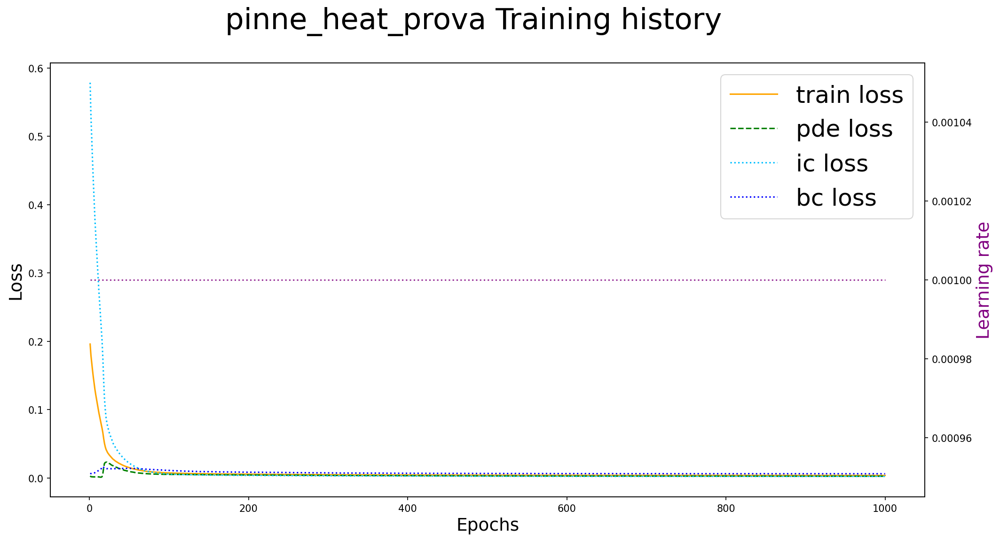

In [20]:
fig, ax = plt.subplots(figsize=(16, 8), dpi=150)
fig.suptitle(f"{pinn_model.model_name} Training history", fontsize=30)
ax.plot(range(1,len(pinn_model.training_loss)+1), pinn_model.training_loss, color='orange', linestyle='-', label='train loss')
# others
if pinn_model.use_rec:
    ax.plot(range(1,len(pinn_model.training_rec_loss)+1), pinn_model.training_rec_loss, color='red', linestyle='-.', label='rec loss')
ax.plot(range(1,len(pinn_model.training_pde_loss)+1), pinn_model.training_pde_loss, color='green', linestyle='--', label='pde loss')
ax.plot(range(1,len(pinn_model.training_ic_loss)+1), pinn_model.training_ic_loss, color='deepskyblue', linestyle=':', label='ic loss')
ax.plot(range(1,len(pinn_model.training_bc_loss)+1), pinn_model.training_bc_loss, color='blue', linestyle=':', label='bc loss')

ax.set_xlabel('Epochs',fontsize=18)
ax.set_ylabel('Loss',fontsize=18)

#ax.set_ylim(0.0, 0.9)

# plot LR
# twin object for two different y-axis on the sample plot
ax2=ax.twinx()
# make a plot with different y-axis using second axis object
ax2.plot(range(1,len(pinn_model.training_loss)+1), pinn_model.learning_rates, color='purple', linestyle=':', label='Learning rates', alpha=0.8)
ax2.set_ylabel("Learning rate", color="purple",fontsize=18)

ax.legend(fontsize=24)

fig.savefig(f"{pinn_model.BASE_PATH_TO_STORE}/{pinn_model.model_name}_training_history.pdf")

fig.show()

## 6. Test model

In [21]:
# load the best model
pinn_model.load_best_model()

Loaded best model: ./model_data/pinne_heat_prova.pth at epoch: 996



PDE loss: 0.0023585285525768995


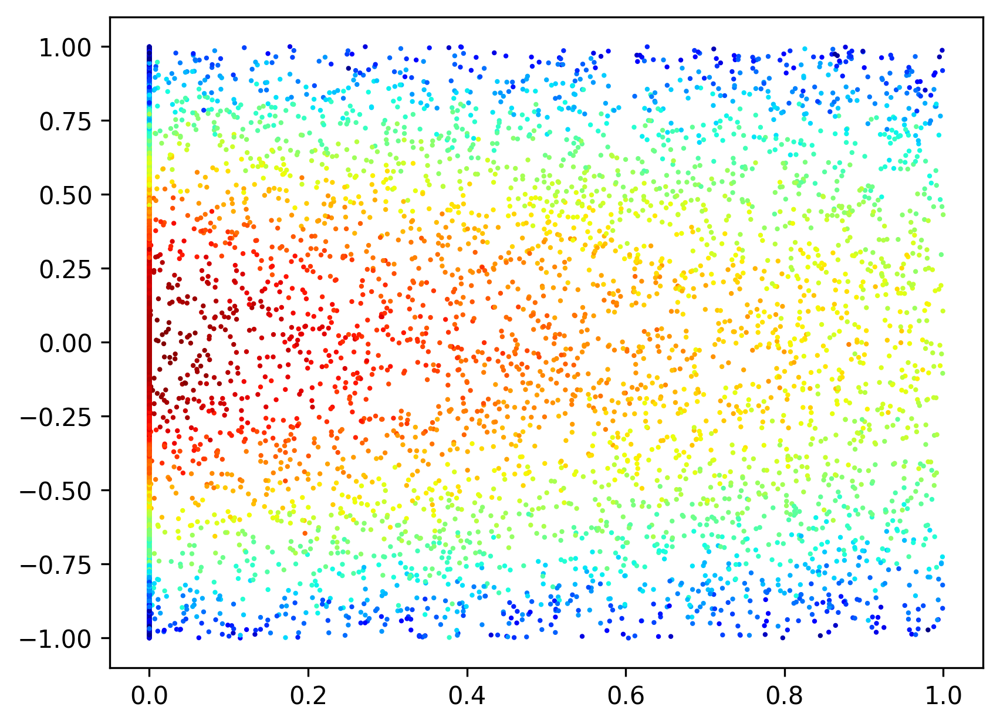

In [22]:
coords, ic_coords, bc_coords = pinn_model.generate_coords()
X = Variable(coords, requires_grad=True)
pred_func = pinn_model.forward(X.to(pinn_model.device) ).cpu()

X_ic = Variable(ic_coords, requires_grad=True)
pred_func_ic = pinn_model.forward(X_ic.to(pinn_model.device) ).cpu()

heat_pred = pinn_model.pde_loss(X, pred_func)

print(f"PDE loss: {heat_pred.item()}")

plt.figure(dpi=300)
coords = coords.detach().cpu()
plt.scatter(coords[:, 0], coords[:, 1], c=pred_func.squeeze(-1).detach().cpu(), s=1, cmap='jet')
ic_coords = ic_coords.detach().cpu()
plt.scatter(ic_coords[:, 0], ic_coords[:, 1], c=pred_func_ic.squeeze(-1).detach().cpu(), s=1, cmap='jet', vmin=0, vmax=1)
plt.show()

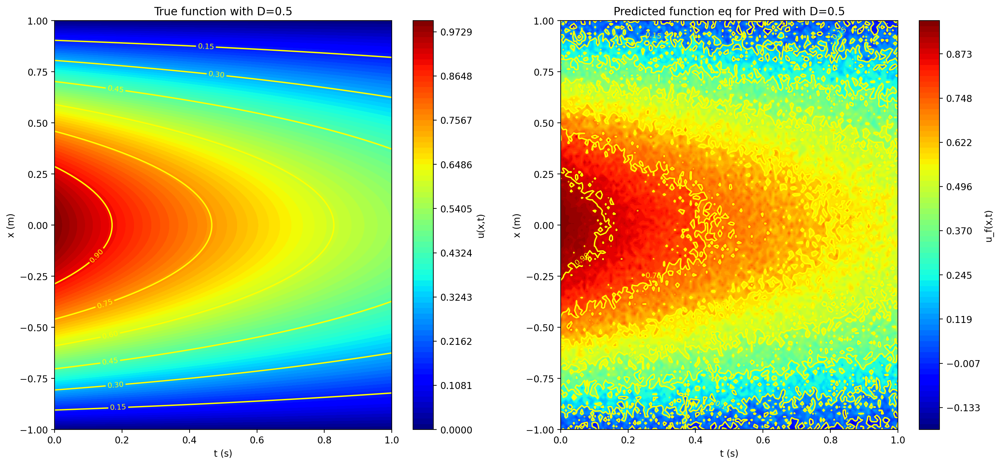

In [23]:
import scipy.interpolate

N_POINTS = 128

USE_SAME_SCALE = not True

# Grid data
t = np.linspace(pinn_model._t_min, pinn_model._t_max, N_POINTS)
x = np.linspace(pinn_model._x_min, pinn_model._x_max, N_POINTS)

T, X = np.meshgrid(t,x)

# True
true_func = exact_solution_func_np(T.flatten(), X.flatten(), diffusion_param=pinn_model.diffusion_coefficient)
Z = true_func.reshape(128, 128)

# Pred
coords = np.zeros([N_POINTS**2, 2])
coords[:, 0] = T.flatten()
coords[:, 1] = X.flatten()
X_VAR = Variable(torch.tensor(coords), requires_grad=True).float()
pred_func = pinn_model.forward(X_VAR.to(pinn_model.device) ).cpu().squeeze(-1).detach().numpy()
Z_false = pred_func.reshape(128, 128)

# ===== Figure ======
fig, axs = plt.subplots(nrows=1, ncols=2, dpi=200, figsize=(18,8))
#and then comes the plot, with the colour-blind-friendly viridis colourmap
levels = np.linspace(true_func.min().item(), true_func.max().item(), 75)
im0 = axs[0].contourf(
    T, X, Z,
    levels=levels ,
    origin = 'lower',
    cmap='jet',
    alpha = 1.0
)
cbar0 = plt.colorbar(im0, ax=axs[0])
cbar0.set_label('u(x,t)')

#optional countour lines:
contours = axs[0].contour(T, X, Z, colors='yellow');
axs[0].clabel(contours, inline=True, fontsize=8)

axs[0].set_title(f"True function with D={pinn_model.diffusion_coefficient}")
axs[0].set_xlabel('t (s)')
axs[0].set_ylabel('x (m)')

levels_pred = np.linspace(pred_func.min().item(), pred_func.max().item(), 75)
im1 = axs[1].contourf(
    T, X, Z_false,
    levels=levels if USE_SAME_SCALE else levels_pred,
    origin = 'lower',
    cmap='jet',
    alpha = 1.0
)
cbar1 = plt.colorbar(im1, ax=axs[1])
cbar1.set_label('u_f(x,t)')

#optional countour lines:
contours = axs[1].contour(T, X, Z_false, colors='yellow');
axs[1].clabel(contours, inline=True, fontsize=8)

axs[1].set_title(f"Predicted function eq for Pred with D={pinn_model.diffusion_coefficient}")
axs[1].set_xlabel('t (s)')
axs[1].set_ylabel('x (m)')

fig.savefig(f"{pinn_model.BASE_PATH_TO_STORE}/{pinn_model.model_name}_pred_func.pdf")

plt.show()

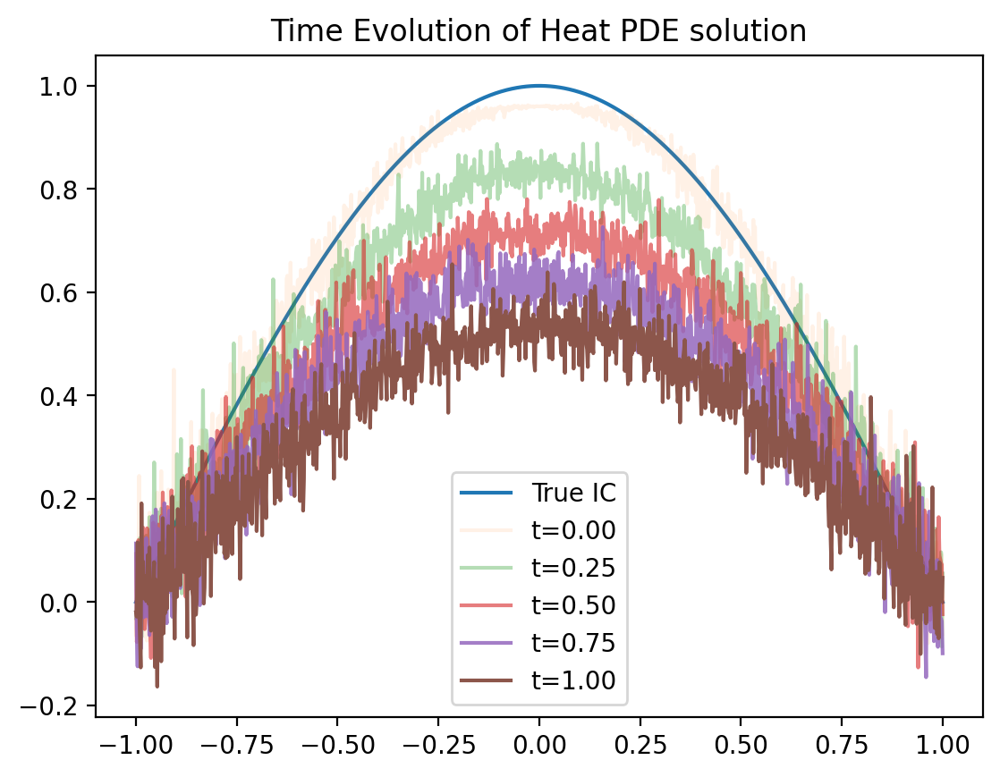

In [24]:
plt.figure(dpi=200)
N_POINTS = 1024

for t in np.arange(0.0, 1.25, 0.25):
    coords = np.ones([N_POINTS, 2])
    coords[:, 1]  = np.linspace(pinn_model._x_min, pinn_model._x_max, N_POINTS)
    coords[:, 0] *= t
    if t==0:
        plt.plot(coords[:, 1], np.cos(np.pi*coords[:,1]/2), label=f"True IC")
        
    X_VAR = Variable(torch.tensor(coords), requires_grad=True).float()
    pred_functor = pinn_model.forward(X_VAR.to(pinn_model.device) )
    pred_func = pred_functor.cpu().squeeze(-1).detach().numpy()
    
    plt.plot(coords[:, 1], pred_func, label=f"t={t:.2f}", alpha=min(t + 0.1,1))

plt.title("Time Evolution of Heat PDE solution")
plt.legend()
plt.show()

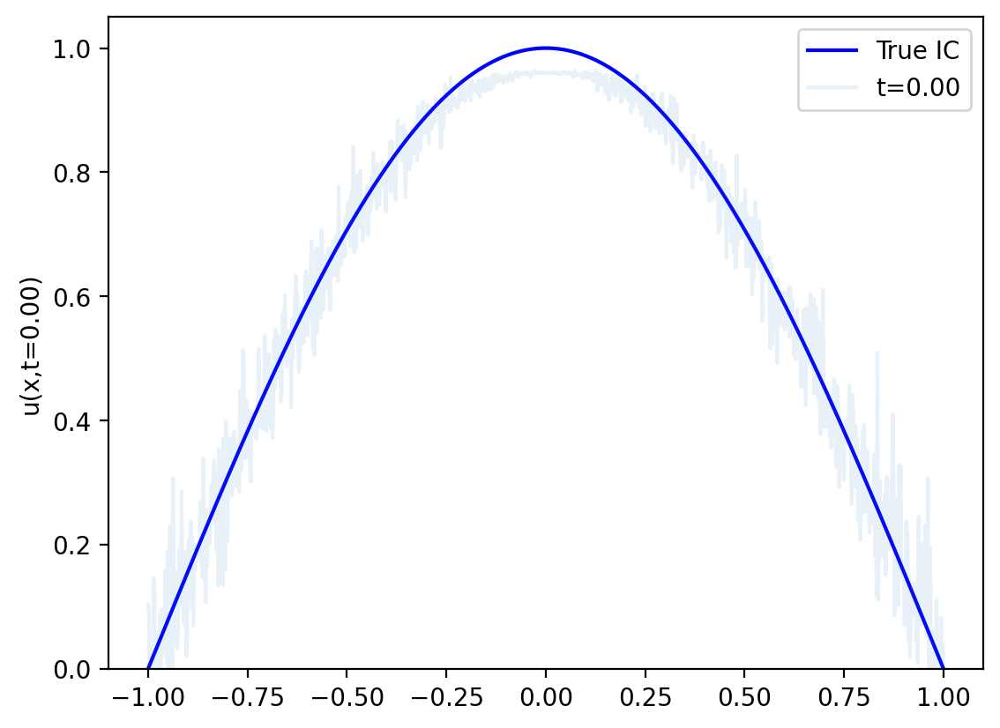

In [25]:
from matplotlib.animation import FuncAnimation

fig, ax = plt.subplots(1,1, dpi=200)
N_POINTS = 1024
ax.set_title("Time Evolution of Heat PDE solution")
ax.set_xlabel('x')

num_steps = 10
_Delta = 1/num_steps

_time_range = np.arange(0.0, 1.0 + _Delta ,_Delta)
    

def update_plot(time_idx):
    ax.cla()
    t = _time_range[time_idx]
    coords = np.ones([N_POINTS, 2])
    coords[:, 1]  = np.linspace(pinn_model._x_min, pinn_model._x_max, N_POINTS)
    coords[:, 0] *= t
        
        
    X_VAR = Variable(torch.tensor(coords), requires_grad=True).float()
    pred_functor = pinn_model.forward(X_VAR.to(pinn_model.device) )
    pred_func = pred_functor.cpu().squeeze(-1).detach().numpy()
    
    ax.plot(coords[:, 1], np.cos(np.pi*coords[:,1]/2), label=f"True IC", c='b')

    ax.plot(coords[:, 1], pred_func, label=f"t={t:.2f}", alpha=min(t + 0.1,1))
    ax.set_ylabel(f'u(x,t={t:.2f})')
    
    ax.set_ylim(bottom=0.0, top=1.05)
    
    ax.legend()

ani = FuncAnimation(fig = fig, func = update_plot, frames = num_steps, interval = 100) 

In [26]:
from IPython.display import HTML
HTML(ani.to_jshtml())